In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 


In [19]:
df = pd.read_csv('price_month.csv')

C:\Users\Dell\AppData\Local\Temp\ipykernel_23956\932434883.py:1: DtypeWarning: Columns (10,12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('price_month.csv')


In [20]:
PX_Y = df[['PX1','YYYYMM']]
print(df.columns)

Index(['CASEID', 'YYYYMM', 'YYYYQ', 'YYYY', 'ID', 'IDPREV', 'DATEPR', 'PX1Q1',
       'PX1Q2', 'PX1', 'PX5Q1', 'PX5Q2', 'PX5'],
      dtype='object')


In [39]:
df1 = df['PX5Q2']
print(df.columns)
df.dropna(inplace=True)
print(df.head())



Index(['CASEID', 'YYYYMM', 'YYYYQ', 'YYYY', 'ID', 'IDPREV', 'DATEPR', 'PX1Q1',
       'PX1Q2', 'PX1', 'PX5Q1', 'PX5Q2', 'PX5'],
      dtype='object')
   CASEID  YYYYMM  YYYYQ  YYYY  ID IDPREV  DATEPR  PX1Q1 PX1Q2  PX1 PX5Q1  \
0       1  197801  19781  1978   1                     1     3    3         
1       2  197801  19781  1978   2                     1    10   10         
2       3  197801  19781  1978   3                     1    20   20         
3       4  197801  19781  1978   4                     1     4    4         
4       5  197801  19781  1978   5                     3          0         

  PX5Q2  PX5  
0             
1             
2             
3             
4             


In [9]:
print(PX_Y.head(10))

   PX1  YYYYMM
0    3  197801
1   10  197801
2   20  197801
3    4  197801
4    0  197801
5   96  197801
6   96  197801
7    6  197801
8   96  197801
9   96  197801


In [41]:
PX_Y['PX1'].replace([-97, 96, 98, 99], np.nan, inplace=True)

# Drop the rows where 'px1' is NaN
PX_Y.dropna(subset=['PX1'], inplace=True)

# Print the dataset
print(PX_Y)

         PX1  YYYYMM
0        3.0  197801
1       10.0  197801
2       20.0  197801
3        4.0  197801
4        0.0  197801
...      ...     ...
311525   1.0  202305
311526   3.0  202305
311527  -3.0  202305
311528   0.0  202305
311529   5.0  202305

[283192 rows x 2 columns]


C:\Users\Dell\AppData\Local\Temp\ipykernel_23956\1003496263.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PX_Y['PX1'].replace([-97, 96, 98, 99], np.nan, inplace=True)
C:\Users\Dell\AppData\Local\Temp\ipykernel_23956\1003496263.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  PX_Y.dropna(subset=['PX1'], inplace=True)


In [42]:
PX_Y.to_csv('cleaned_dataset.csv', index=False)

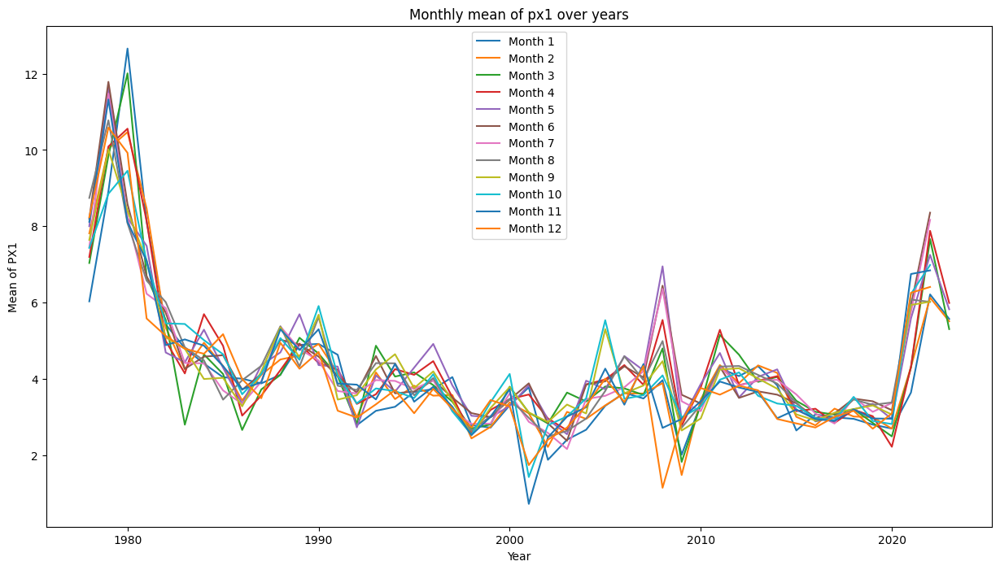

In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load your DataFrame
df = pd.read_csv('cleaned_dataset.csv')

# Convert 'yyyymm' to string to ensure consistent formatting
df['YYYYMM'] = df['YYYYMM'].astype(str)

# Split 'yyyymm' into 'year' and 'month' columns
df['year'] = df['YYYYMM'].str[:4].astype(int)
df['month'] = df['YYYYMM'].str[4:].astype(int)

# Group by 'year' and 'month', and calculate the mean of 'px1'
mean_df = df.groupby(['year', 'month'])['PX1'].mean().reset_index()

# Save the mean DataFrame to a CSV file
mean_df.to_csv('monthly_means.csv', index=False)

# Plotting
plt.figure(figsize=(15,8))
for month in range(1, 13):  # For each month
    month_data = mean_df[mean_df['month'] == month]
    plt.plot(month_data['year'], month_data['PX1'], label=f'Month {month}')

plt.xlabel('Year')
plt.ylabel('Mean of PX1')
plt.legend()
plt.title('Monthly mean of px1 over years')
plt.show()


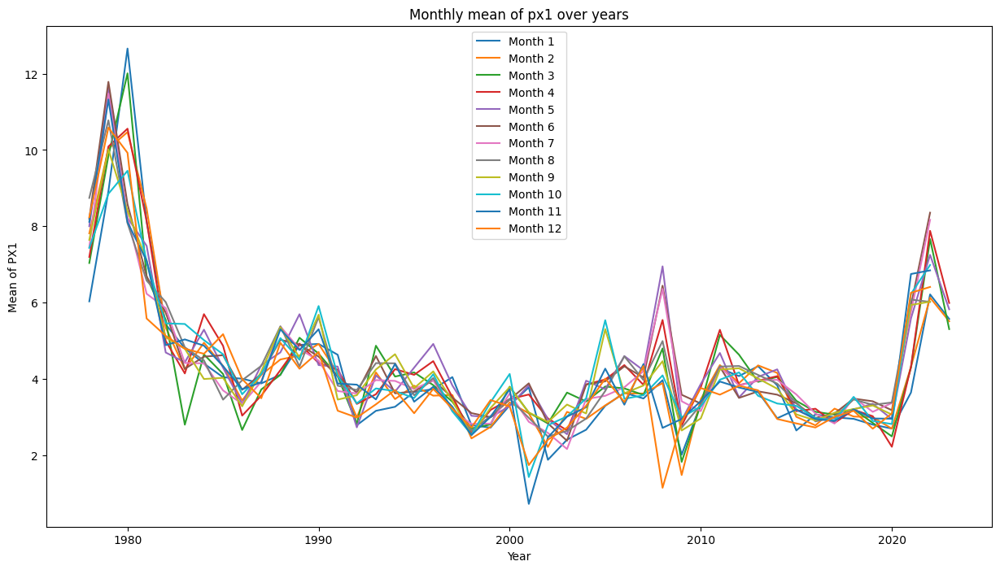

In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load your DataFrame
df = pd.read_csv('cleaned_dataset.csv')

# Convert 'yyyymm' to string to ensure consistent formatting
df['YYYYMM'] = df['YYYYMM'].astype(str)

# Split 'yyyymm' into 'year' and 'month' columns
df['year'] = df['YYYYMM'].str[:4].astype(int)
df['month'] = df['YYYYMM'].str[4:].astype(int)

# Group by 'year' and 'month', and calculate the mean of 'px1'
mean_df = df.groupby(['year', 'month'])['PX1'].mean().reset_index()

# Create 'YYYYMM' column
mean_df['YYYYMM'] = mean_df['year'].astype(str) + mean_df['month'].apply(lambda x: f'{x:02d}')

# Save the mean DataFrame to a CSV file
mean_df.to_csv('monthly_means.csv', index=False)

# Save the DataFrame with 'YYYYMM' column to another CSV file
mean_df[['YYYYMM', 'PX1']].to_csv('YYYYMM_means.csv', index=False)

# Plotting
plt.figure(figsize=(15,8))
for month in range(1, 13):  # For each month
    month_data = mean_df[mean_df['month'] == month]
    plt.plot(month_data['year'], month_data['PX1'], label=f'Month {month}')

plt.xlabel('Year')
plt.ylabel('Mean of PX1')
plt.legend()
plt.title('Monthly mean of px1 over years')
plt.show()


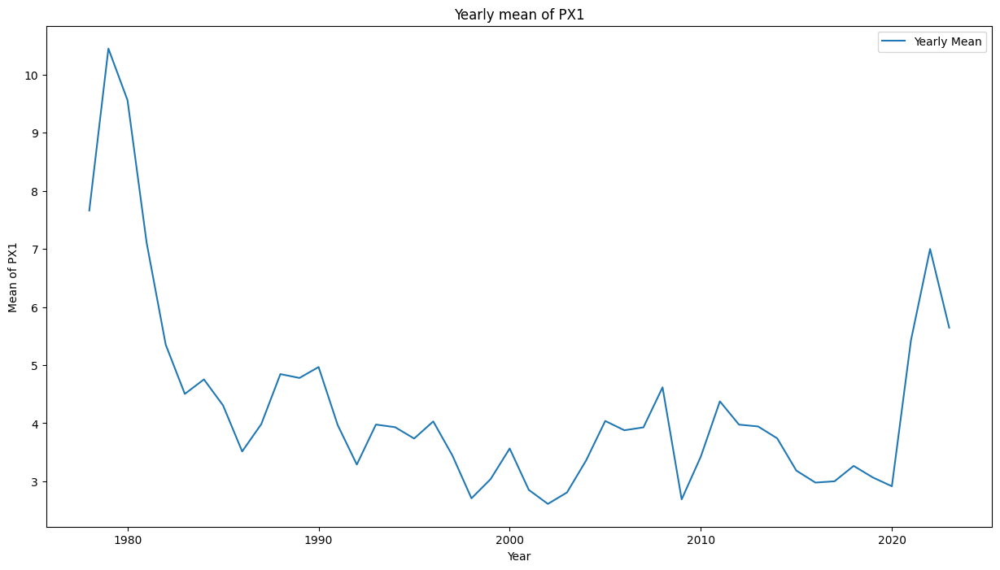

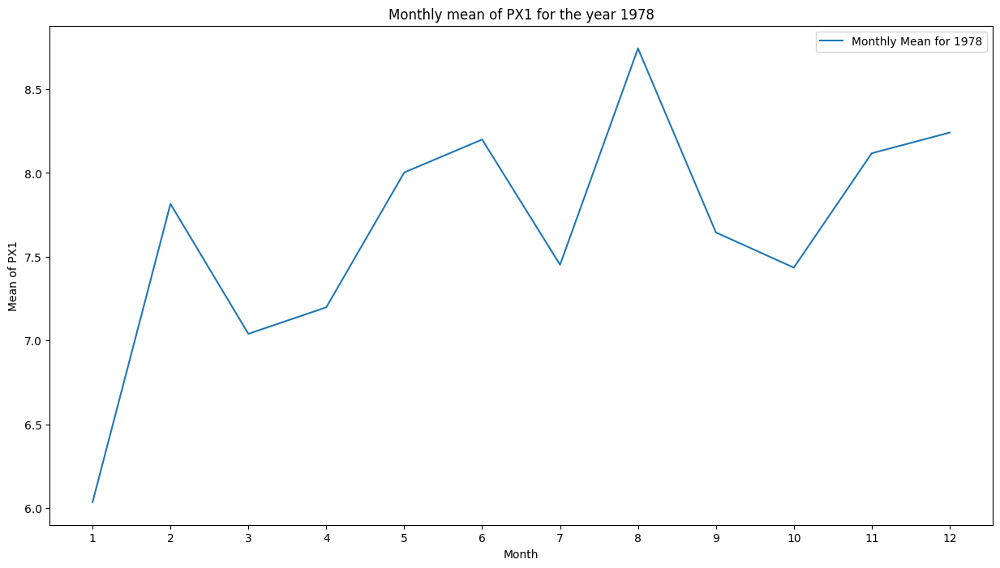

In [47]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load your DataFrame
mean_df = pd.read_csv('monthly_means.csv')

# Calculate the yearly mean of 'px1'
yearly_mean_df = mean_df.groupby('year')['PX1'].mean().reset_index()

# Save the yearly mean DataFrame to a CSV file
yearly_mean_df.to_csv('yearly_means.csv', index=False)

# Plotting yearly means
plt.figure(figsize=(15,8))
plt.plot(yearly_mean_df['year'], yearly_mean_df['PX1'], label='Yearly Mean')
plt.xlabel('Year')
plt.ylabel('Mean of PX1')
plt.title('Yearly mean of PX1')
plt.legend()
plt.show()

# Plotting monthly means for the year 1978
plt.figure(figsize=(15,8))
year_data = mean_df[mean_df['year'] == 1978]
plt.plot(year_data['month'], year_data['PX1'], label='Monthly Mean for 1978')
plt.xlabel('Month')
plt.ylabel('Mean of PX1')
plt.title('Monthly mean of PX1 for the year 1978')
plt.xticks(range(1, 13))
plt.legend()
plt.show()


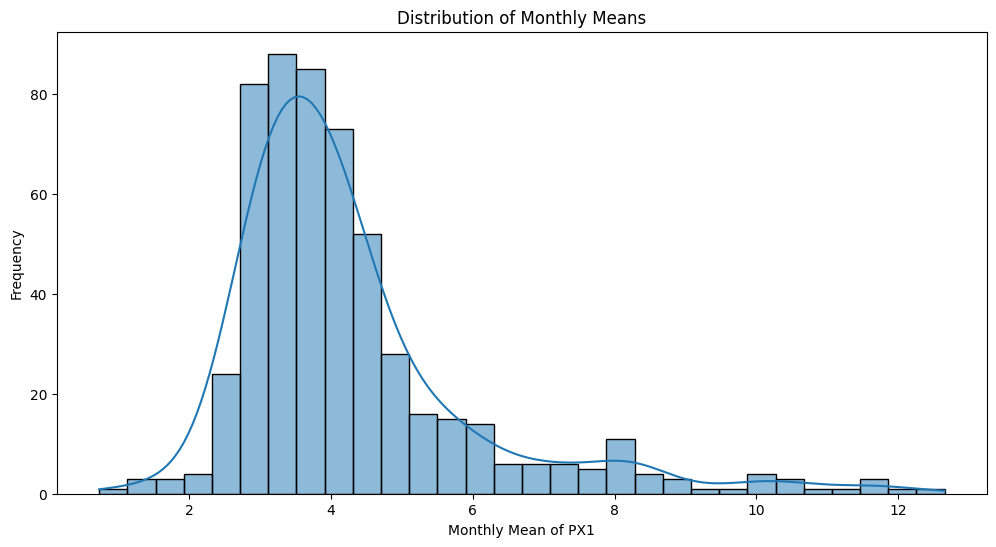

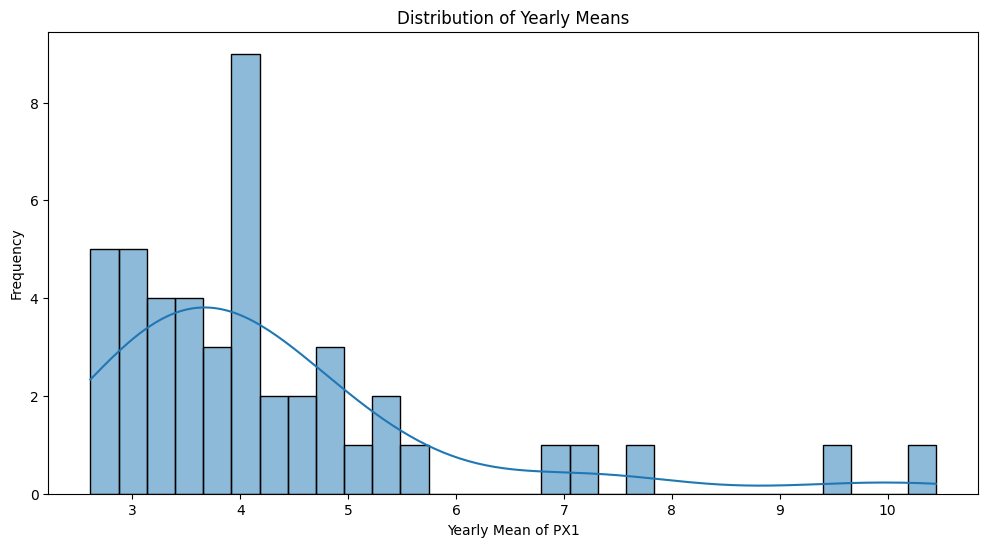

In [48]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your DataFrames
monthly_mean_df = pd.read_csv('monthly_means.csv')
yearly_mean_df = pd.read_csv('yearly_means.csv')

# Plotting the Gaussian distribution of the monthly means
plt.figure(figsize=(12, 6))
sns.histplot(monthly_mean_df['PX1'], kde=True, bins=30)
plt.title('Distribution of Monthly Means')
plt.xlabel('Monthly Mean of PX1')
plt.ylabel('Frequency')
plt.show()

# Plotting the Gaussian distribution of the yearly means
plt.figure(figsize=(12, 6))
sns.histplot(yearly_mean_df['PX1'], kde=True, bins=30)
plt.title('Distribution of Yearly Means')
plt.xlabel('Yearly Mean of PX1')
plt.ylabel('Frequency')
plt.show()


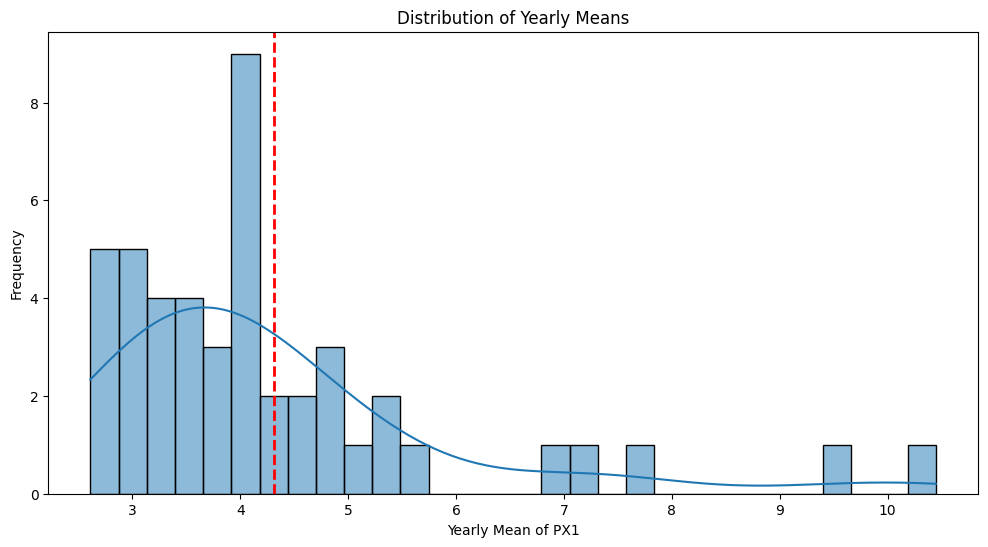

The mean of the yearly means is: 4.308237428079473


In [49]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load your DataFrame
yearly_mean_df = pd.read_csv('yearly_means.csv')

# Calculate the mean of the yearly means
mean_of_yearly_means = yearly_mean_df['PX1'].mean()

# Plotting the Gaussian distribution of the yearly means
plt.figure(figsize=(12, 6))
sns.histplot(yearly_mean_df['PX1'], kde=True, bins=30)
plt.title('Distribution of Yearly Means')
plt.xlabel('Yearly Mean of PX1')
plt.ylabel('Frequency')

# Plotting the mean of the yearly means as a single point
plt.axvline(mean_of_yearly_means, color='r', linestyle='dashed', linewidth=2)
plt.show()

print(f"The mean of the yearly means is: {mean_of_yearly_means}")


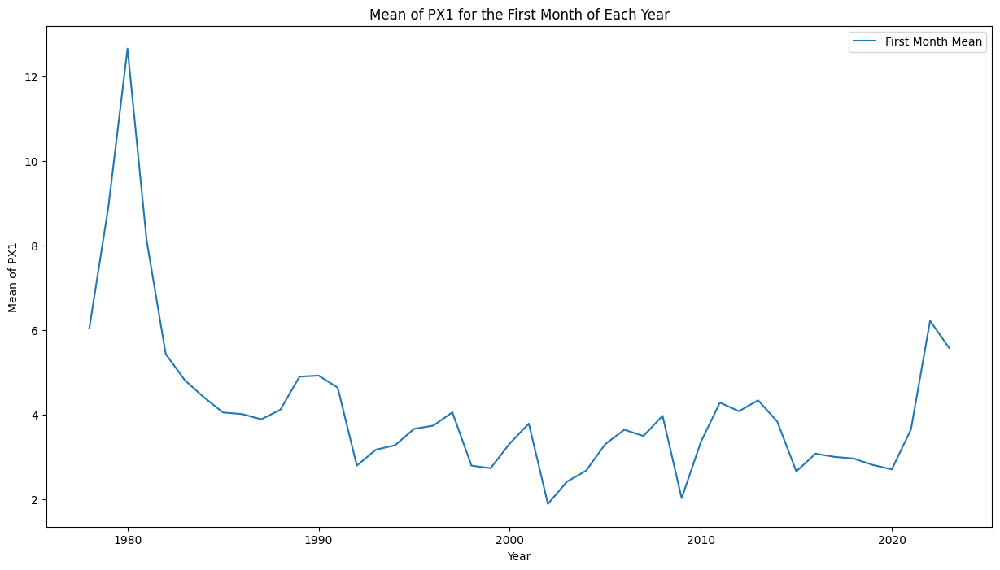

In [50]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your DataFrame
monthly_mean_df = pd.read_csv('monthly_means.csv')

# Filter the data for the first month of each year
first_month_data = monthly_mean_df[monthly_mean_df['month'] == 1]

# Save the first month data to a CSV file
first_month_data.to_csv('first_month_means.csv', index=False)

# Plotting
plt.figure(figsize=(15,8))
plt.plot(first_month_data['year'], first_month_data['PX1'], label='First Month Mean')
plt.xlabel('Year')
plt.ylabel('Mean of PX1')
plt.title('Mean of PX1 for the First Month of Each Year')
plt.legend()
plt.show()


In [52]:
import pandas as pd

# Load your DataFrame
first_month_data = pd.read_csv('first_month_means.csv')

# Filter out the data for the year 2023
first_month_data_no_2023 = first_month_data[first_month_data['year'] != 2023]

# Save the 'PX1' column to a new CSV file
first_month_data_no_2023[['PX1']].to_csv('first_month_means_no_2023.csv', index=False)


In [53]:
import pandas as pd

# Load your DataFrames
first_month_data_no_2023 = pd.read_csv('first_month_means_no_2023.csv')
other_data = pd.read_csv('monthly.csv')

# Add the 'FPCPITOTLZGUSA' column to the first dataframe
first_month_data_no_2023['FPCPITOTLZGUSA'] = other_data['FPCPITOTLZGUSA']

# Save the updated DataFrame to a new CSV file
first_month_data_no_2023.to_csv('updated_data.csv', index=False)


In [54]:
! pip install statsmodels

                                              0.0/9.4 MB ? eta -:--:--
     -                                        0.3/9.4 MB 6.5 MB/s eta 0:00:02
     ---                                      0.8/9.4 MB 8.3 MB/s eta 0:00:02
     -----                                    1.2/9.4 MB 8.7 MB/s eta 0:00:01
     -------                                  1.7/9.4 MB 8.9 MB/s eta 0:00:01
     ---------                                2.1/9.4 MB 9.1 MB/s eta 0:00:01
     -----------                              2.6/9.4 MB 9.1 MB/s eta 0:00:01
     ------------                             3.0/9.4 MB 9.2 MB/s eta 0:00:01
     --------------                           3.5/9.4 MB 9.3 MB/s eta 0:00:01
     ----------------                         3.9/9.4 MB 9.3 MB/s eta 0:00:01
     ------------------                       4.4/9.4 MB 9.3 MB/s eta 0:00:01
     --------------------                     4.8/9.4 MB 9.3 MB/s eta 0:00:01
     ----------------------                   5.3/9.4 MB 9.4 MB/s eta 0

In [55]:
import pandas as pd
import statsmodels.api as sm

# Load your DataFrame
df = pd.read_csv('updated_data.csv')

# Define the dependent and independent variables for the first case
X1 = df['FPCPITOTLZGUSA']
Y1 = df['PX1']

# Add a constant to the independent variable
X1 = sm.add_constant(X1)

# Perform the linear regression for the first case
model1 = sm.OLS(Y1, X1)
results1 = model1.fit()

# Print the summary statistics for the first model
print(results1.summary())

# Define the dependent and independent variables for the second case
X2 = df['PX1']
Y2 = df['FPCPITOTLZGUSA']

# Add a constant to the independent variable
X2 = sm.add_constant(X2)

# Perform the linear regression for the second case
model2 = sm.OLS(Y2, X2)
results2 = model2.fit()

# Print the summary statistics for the second model
print(results2.summary())


                            OLS Regression Results                            
Dep. Variable:                    PX1   R-squared:                       0.868
Model:                            OLS   Adj. R-squared:                  0.865
Method:                 Least Squares   F-statistic:                     282.3
Date:                Tue, 20 Jun 2023   Prob (F-statistic):           1.65e-20
Time:                        20:15:12   Log-Likelihood:                -46.620
No. Observations:                  45   AIC:                             97.24
Df Residuals:                      43   BIC:                             100.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              1.7952      0.172     10.

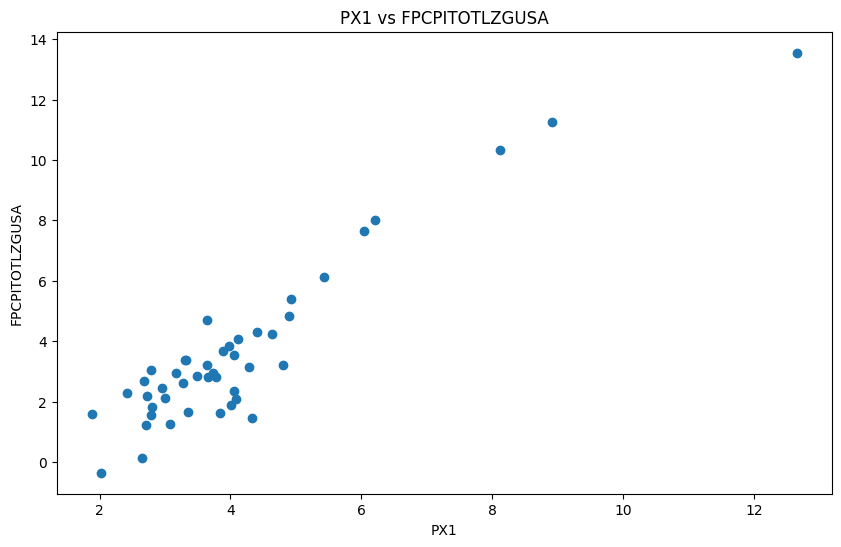

In [60]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your DataFrame
df = pd.read_csv('updated_data.csv')

# Plot 'px1' vs 'FPCPITOTLZGUSA'
plt.figure(figsize=(10, 6))
plt.scatter(df['PX1'], df['FPCPITOTLZGUSA'])
plt.title('PX1 vs FPCPITOTLZGUSA')
plt.xlabel('PX1')
plt.ylabel('FPCPITOTLZGUSA')
plt.show()


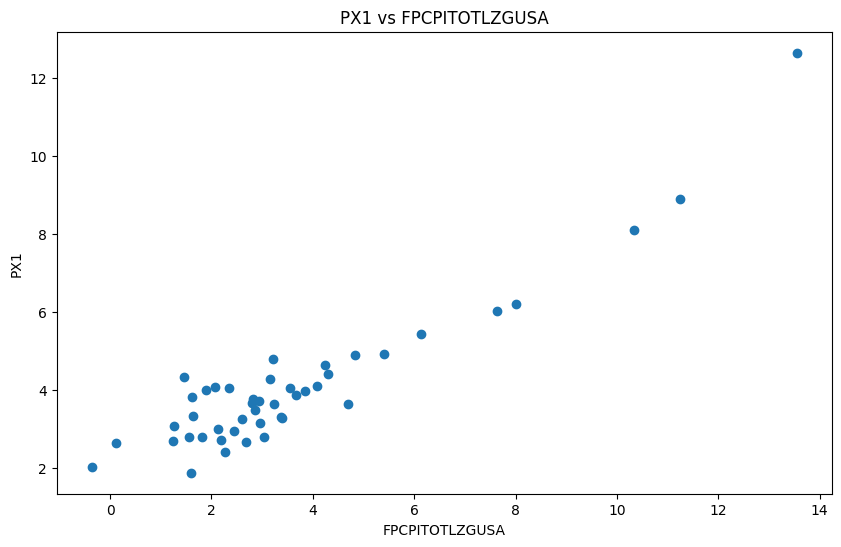

In [61]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your DataFrame
df = pd.read_csv('updated_data.csv')

# Plot 'px1' vs 'FPCPITOTLZGUSA'
plt.figure(figsize=(10, 6))
plt.scatter(df['FPCPITOTLZGUSA'], df['PX1'])
plt.title('PX1 vs FPCPITOTLZGUSA')
plt.xlabel('FPCPITOTLZGUSA')
plt.ylabel('PX1')
plt.show()


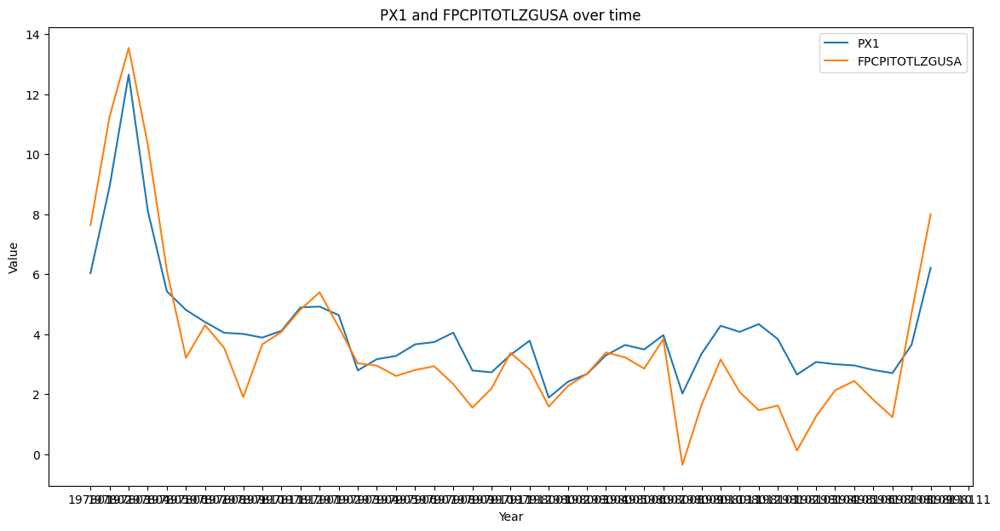

In [59]:
# Load the two DataFrames
df1 = pd.read_csv('updated_data.csv')
df2 = pd.read_csv('monthly_means.csv')

# Create a new DataFrame with the 'yyyymm', 'px1', and 'FPCPITOTLZGUSA' columns
merged_df = df2[['YYYYMM']].copy()
merged_df['PX1'] = df1['PX1']
merged_df['FPCPITOTLZGUSA'] = df1['FPCPITOTLZGUSA']

# Extract the year from the 'yyyymm' column
merged_df['year'] = merged_df['YYYYMM'].apply(lambda x: str(x)[:46])

# Plot 'px1' and 'FPCPITOTLZGUSA' over time
plt.figure(figsize=(14, 7))
plt.plot(merged_df['year'], merged_df['PX1'], label='PX1')
plt.plot(merged_df['year'], merged_df['FPCPITOTLZGUSA'], label='FPCPITOTLZGUSA')
plt.xlabel('Year')
plt.ylabel('Value')
plt.title('PX1 and FPCPITOTLZGUSA over time')
plt.legend()
plt.show()


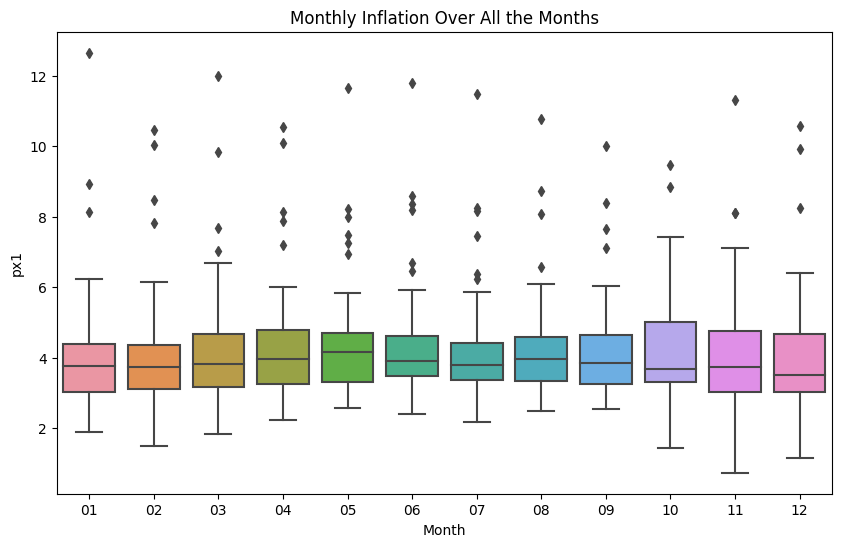

In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your DataFrame
df = pd.read_csv('monthly_means.csv')

# Extract the month from the 'yyyymm' column
df['month'] = df['YYYYMM'].apply(lambda x: str(x)[4:])

# Create the boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x='month', y='PX1', data=df)

plt.title('Monthly Inflation Over All the Months')
plt.xlabel('Month')
plt.ylabel('px1')
plt.show()


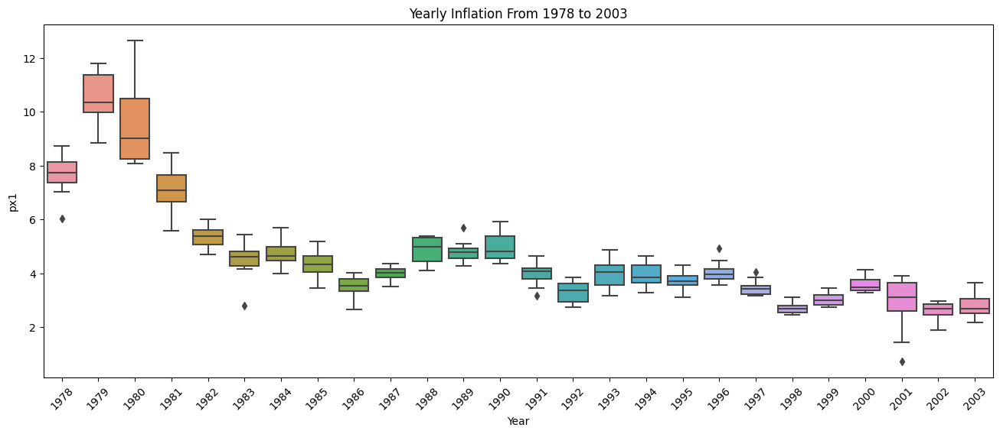

In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your DataFrame
df = pd.read_csv('monthly_means.csv')

# Extract the year from the 'yyyymm' column
df['year'] = df['YYYYMM'].apply(lambda x: str(x)[:4])

# Filter the data to only include years from 1978 to 2003
df = df[(df['year'] >= '1978') & (df['year'] <= '2003')]

# Create the boxplot
plt.figure(figsize=(16, 6))  # Adjust as needed
sns.boxplot(x='year', y='PX1', data=df)

plt.title('Yearly Inflation From 1978 to 2003')
plt.xlabel('Year')
plt.ylabel('px1')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.show()


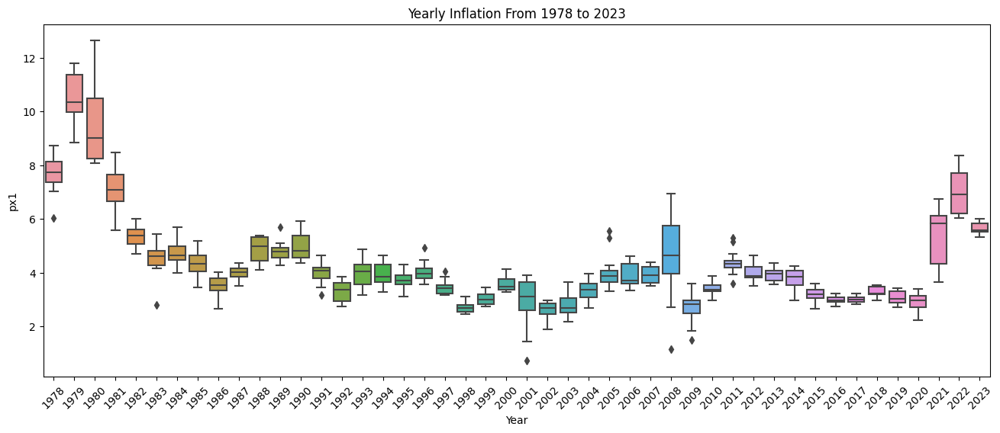

In [13]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your DataFrame
df = pd.read_csv('monthly_means.csv')

# Extract the year from the 'yyyymm' column
df['year'] = df['YYYYMM'].apply(lambda x: str(x)[:4])

# Filter the data to only include years from 1978 to 2003
df = df[(df['year'] >= '1978') & (df['year'] <= '2023')]

# Create the boxplot
plt.figure(figsize=(16, 6))  # Adjust as needed
sns.boxplot(x='year', y='PX1', data=df)

plt.title('Yearly Inflation From 1978 to 2023')
plt.xlabel('Year')
plt.ylabel('px1')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.show()


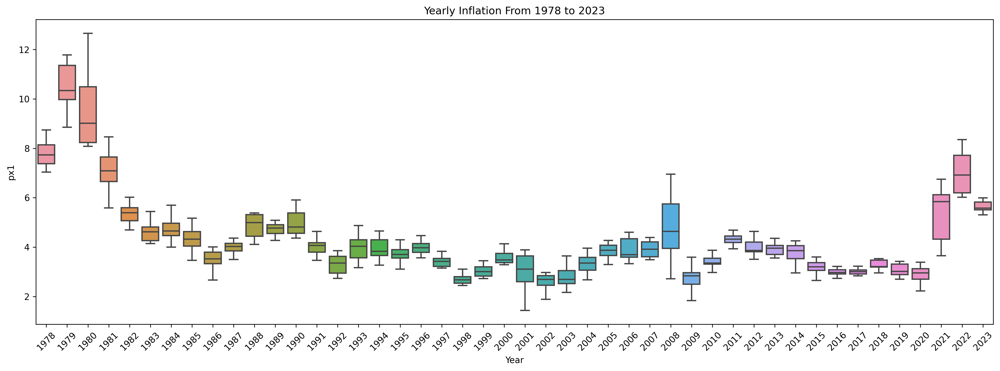

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your DataFrame
df = pd.read_csv('monthly_means.csv')

# Extract the year from the 'yyyymm' column
df['year'] = df['YYYYMM'].apply(lambda x: str(x)[:4])

# Filter the data to only include years from 1978 to 2003
df = df[(df['year'] >= '1978') & (df['year'] <= '2023')]

# Create the boxplot
plt.figure(figsize=(16, 6), dpi=300)  # Adjust as needed with high resolution
sns.boxplot(x='year', y='PX1', data=df, showfliers=False)

plt.title('Yearly Inflation From 1978 to 2023')
plt.xlabel('Year')
plt.ylabel('px1')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability

# Uncomment the following line if your data spans several orders of magnitude
# plt.yscale('log')

plt.tight_layout()  # Ensure your labels are not cut off
plt.show()


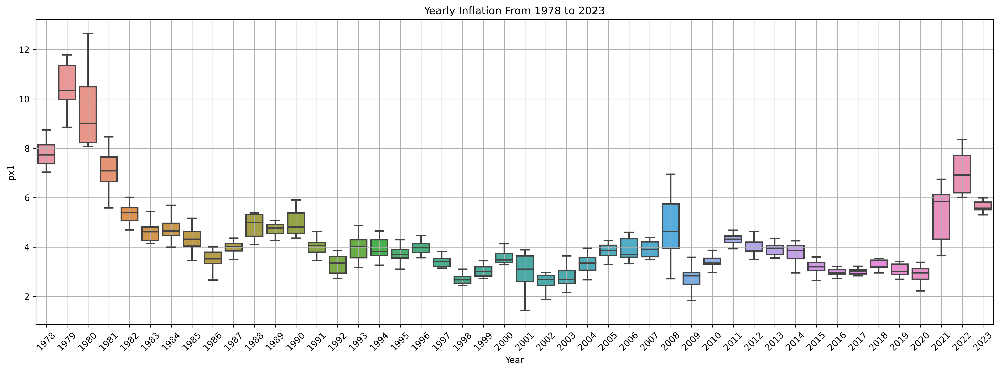

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your DataFrame
df = pd.read_csv('monthly_means.csv')

# Extract the year from the 'yyyymm' column
df['year'] = df['YYYYMM'].apply(lambda x: str(x)[:4])

# Filter the data to only include years from 1978 to 2023
df = df[(df['year'] >= '1978') & (df['year'] <= '2023')]

# Create the boxplot
plt.figure(figsize=(16, 6), dpi=300)  # Adjust as needed with high resolution
sns.boxplot(x='year', y='PX1', data=df, showfliers=False)

plt.title('Yearly Inflation From 1978 to 2023')
plt.xlabel('Year')
plt.ylabel('px1')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability

# Add a grid
plt.grid(True)

# Uncomment the following line if your data spans several orders of magnitude
# plt.yscale('log')

plt.tight_layout()  # Ensure your labels are not cut off
plt.show()


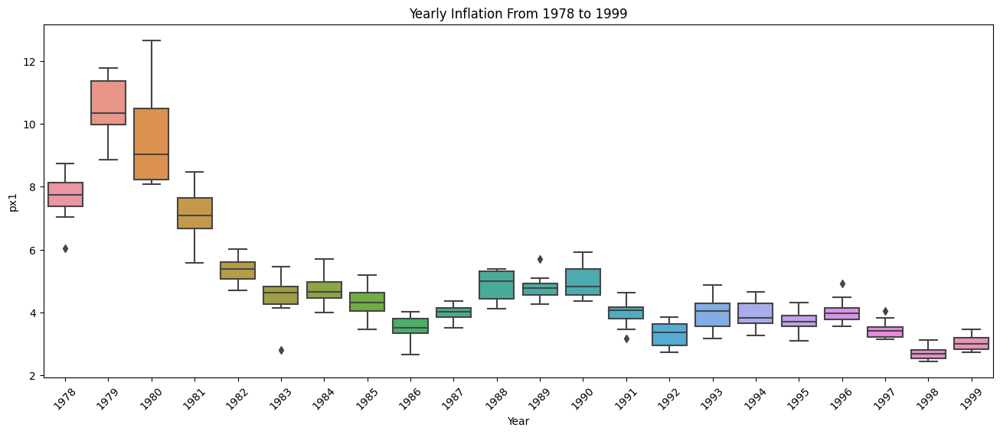

In [14]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your DataFrame
df = pd.read_csv('monthly_means.csv')

# Extract the year from the 'yyyymm' column
df['year'] = df['YYYYMM'].apply(lambda x: str(x)[:4])

# Filter the data to only include years from 1978 to 2003
df = df[(df['year'] >= '1978') & (df['year'] <= '1999')]

# Create the boxplot
plt.figure(figsize=(16, 6))  # Adjust as needed
sns.boxplot(x='year', y='PX1', data=df)

plt.title('Yearly Inflation From 1978 to 1999')
plt.xlabel('Year')
plt.ylabel('px1')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.show()


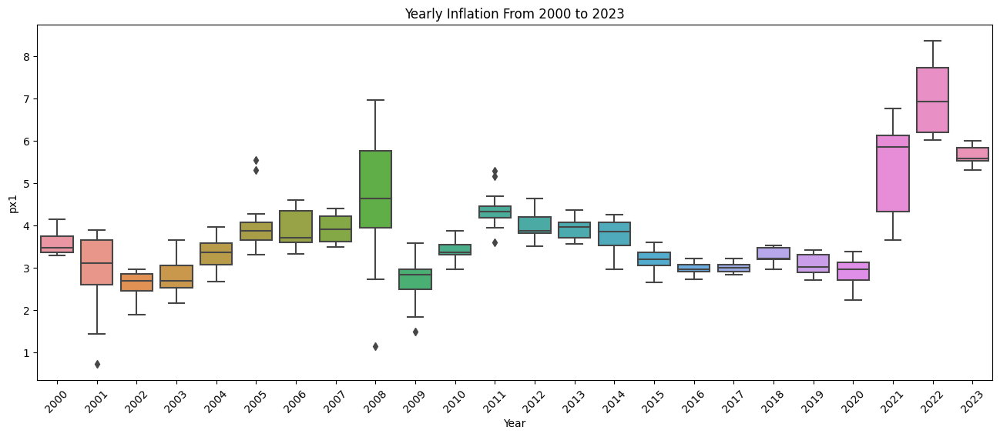

In [15]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your DataFrame
df = pd.read_csv('monthly_means.csv')

# Extract the year from the 'yyyymm' column
df['year'] = df['YYYYMM'].apply(lambda x: str(x)[:4])

# Filter the data to only include years from 1978 to 2003
df = df[(df['year'] >= '2000') & (df['year'] <= '2023')]

# Create the boxplot
plt.figure(figsize=(16, 6))  # Adjust as needed
sns.boxplot(x='year', y='PX1', data=df)

plt.title('Yearly Inflation From 2000 to 2023')
plt.xlabel('Year')
plt.ylabel('px1')
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.show()


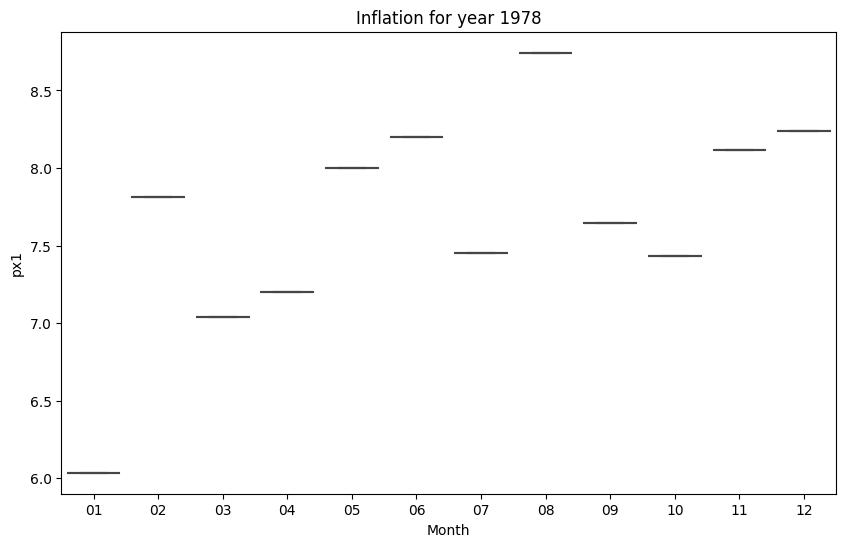

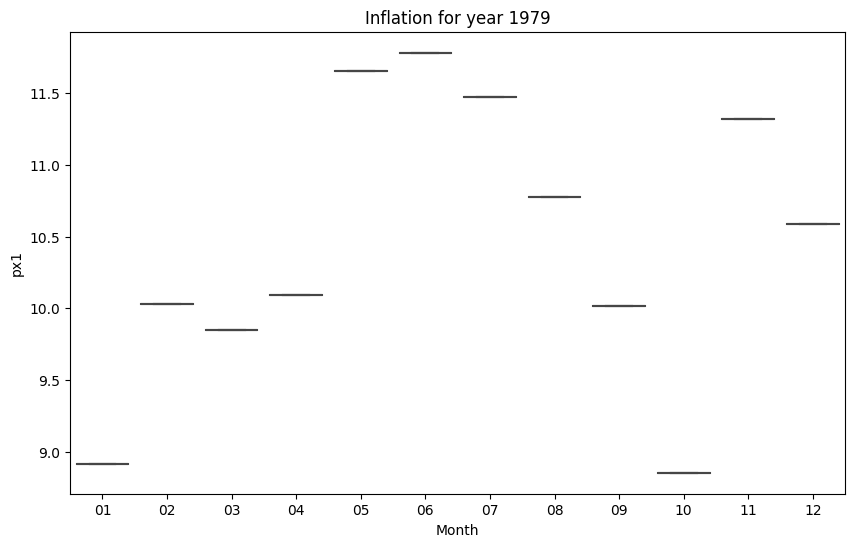

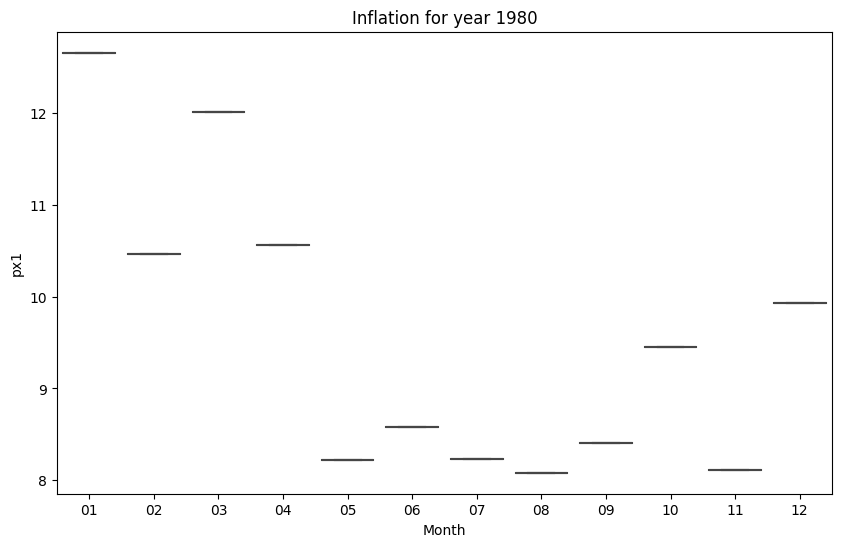

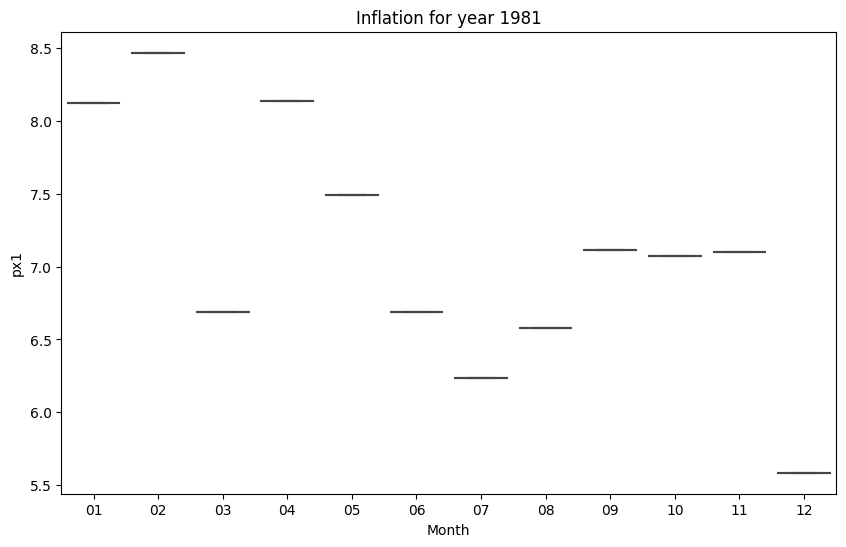

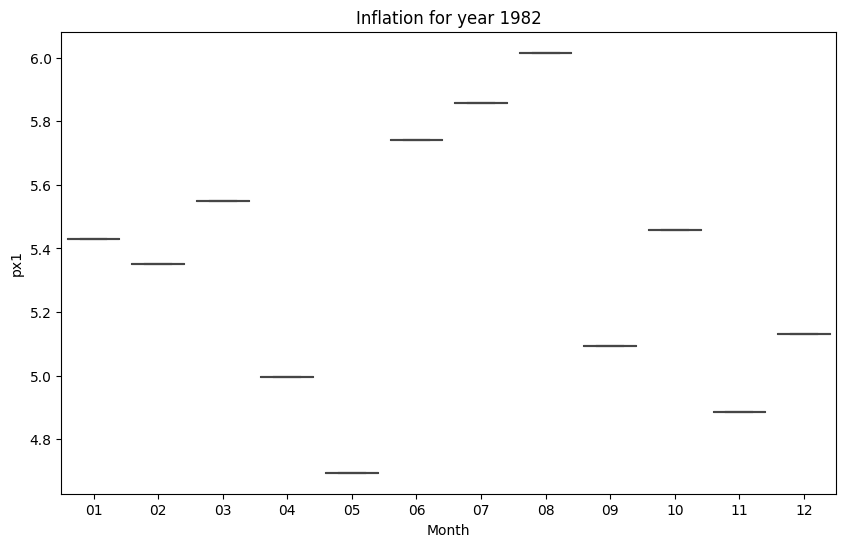

...

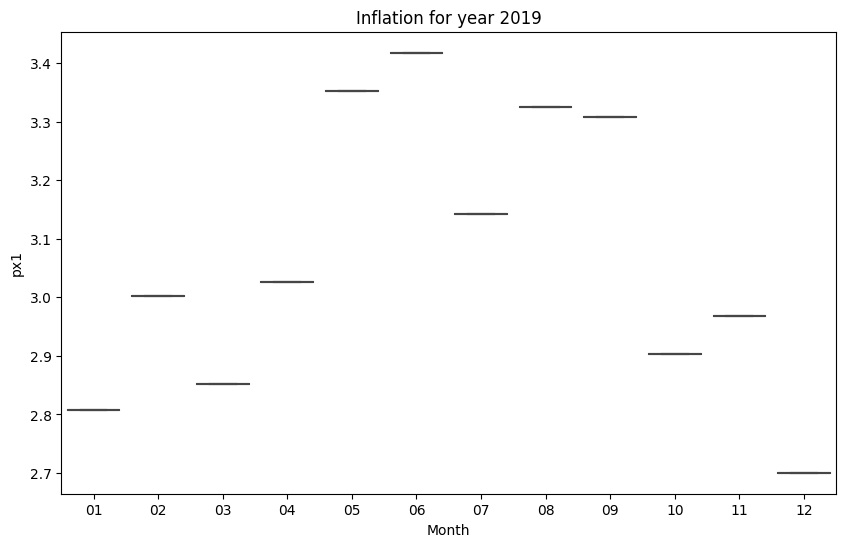

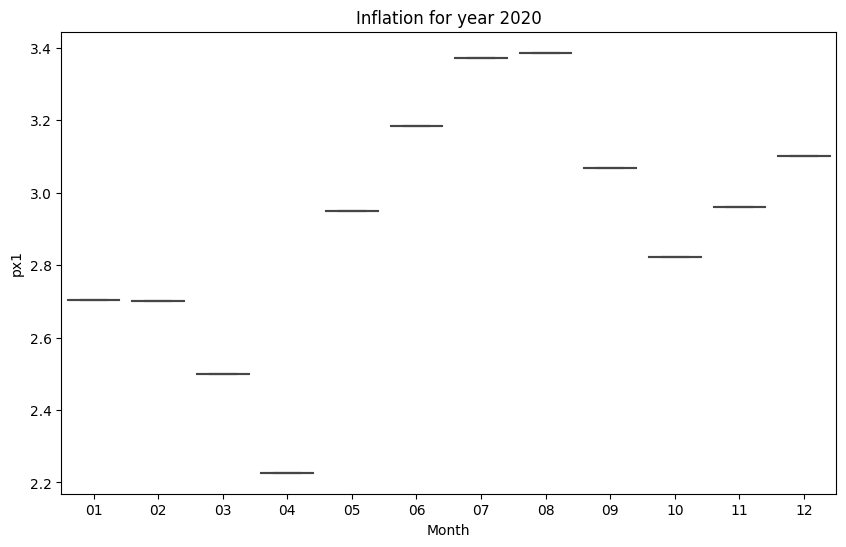

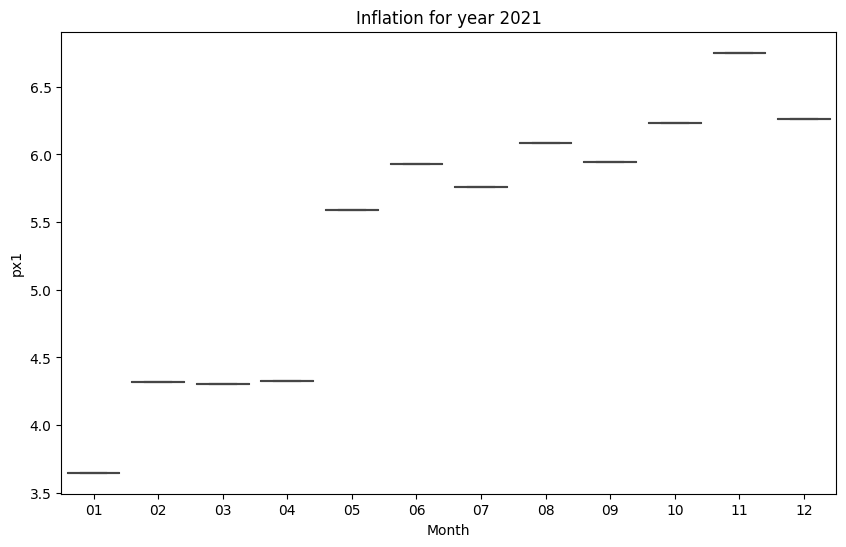

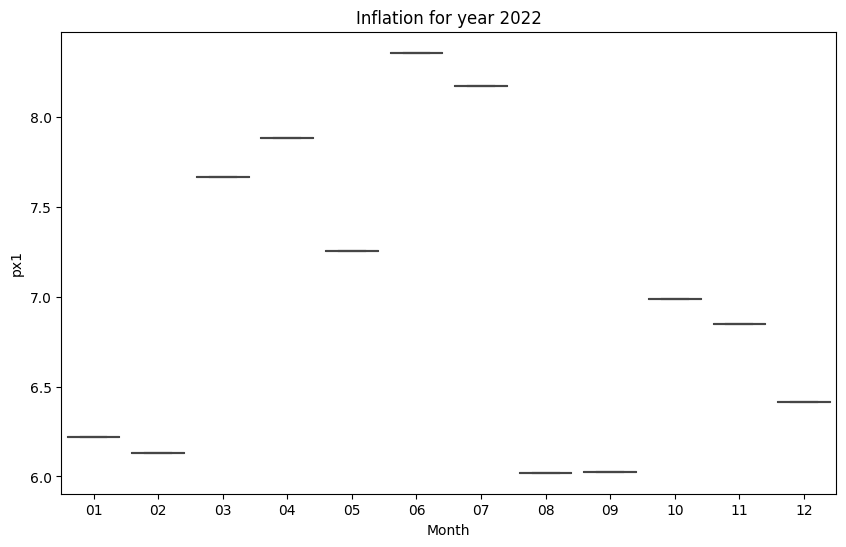

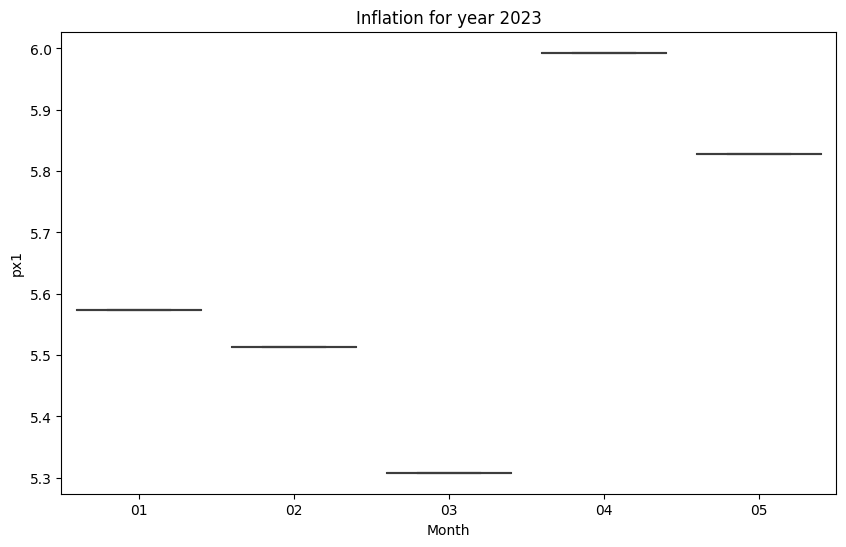

In [9]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your DataFrame
df = pd.read_csv('monthly_means.csv')

# Extract the year and month from the 'yyyymm' column
df['year'] = df['YYYYMM'].apply(lambda x: str(x)[:4])
df['month'] = df['YYYYMM'].apply(lambda x: str(x)[4:])

# Get unique years
years = df['year'].unique()

# Create separate plot for each year
for year in years:
    yearly_data = df[df['year'] == year]
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='month', y='PX1', data=yearly_data)
    plt.title('Inflation for year {}'.format(year))
    plt.xlabel('Month')
    plt.ylabel('px1')
    plt.show()


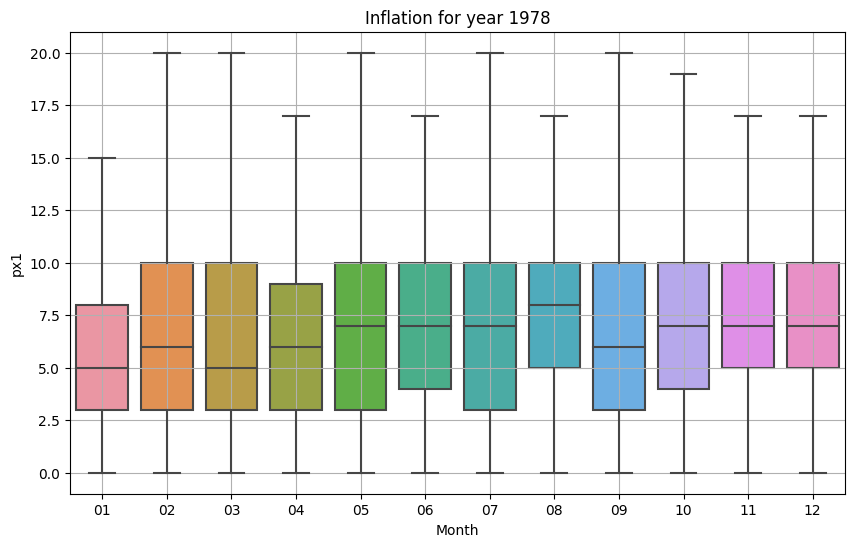

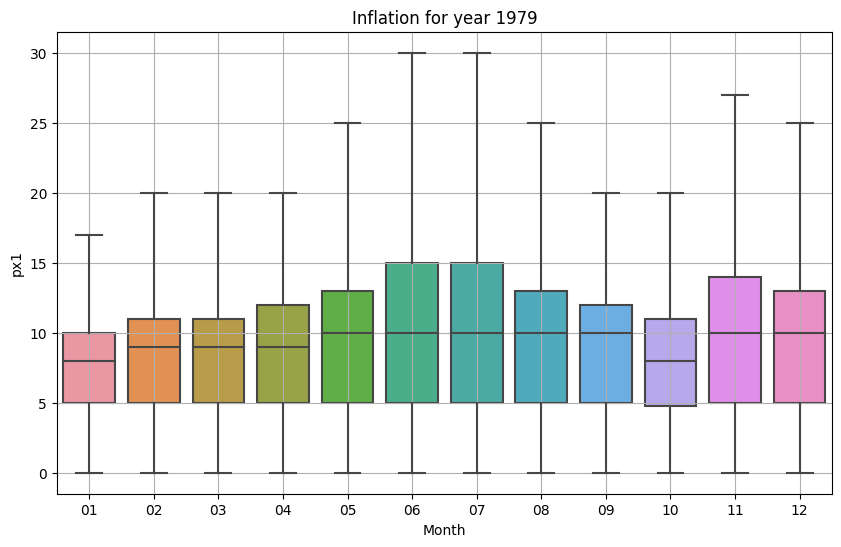

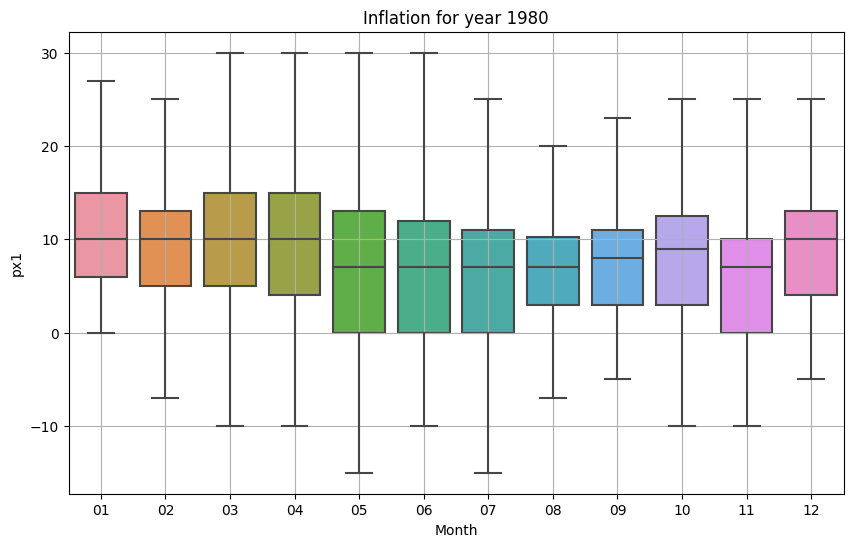

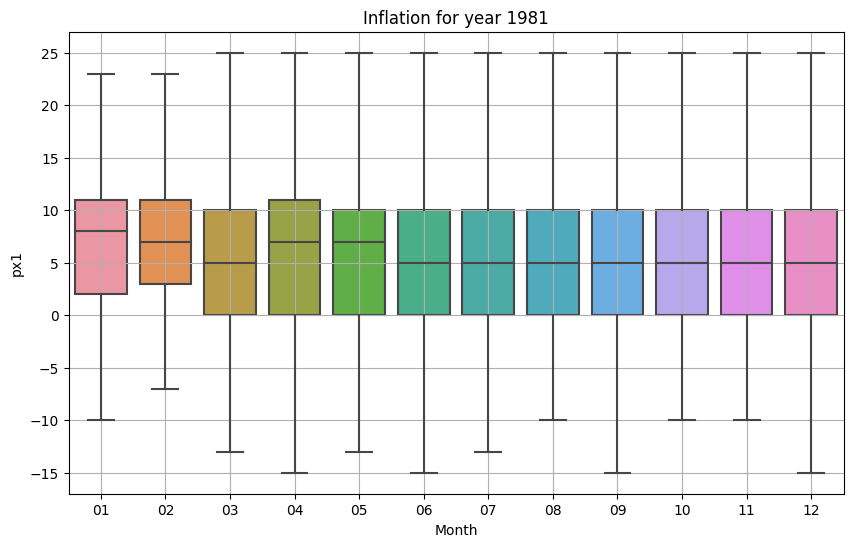

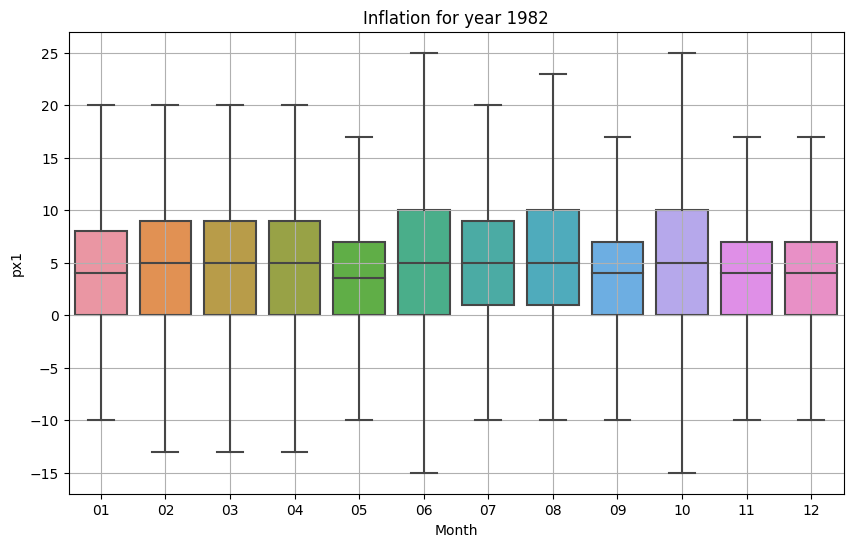

...

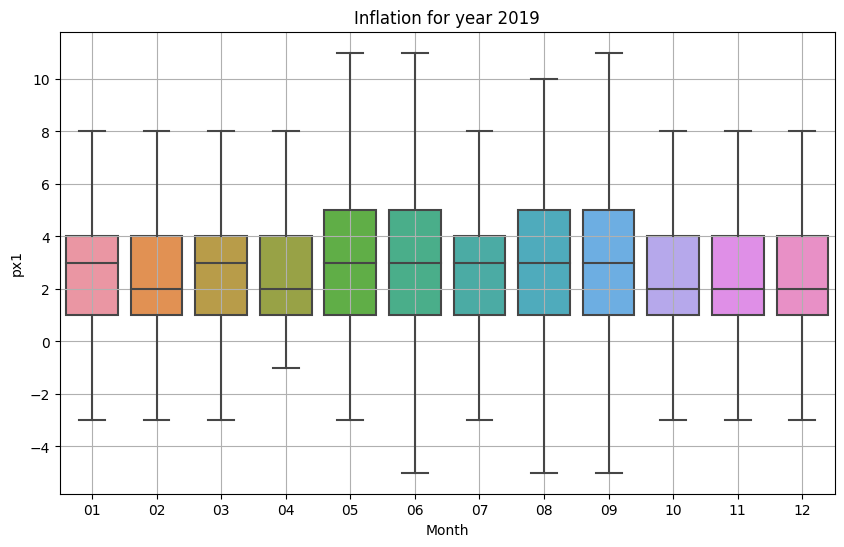

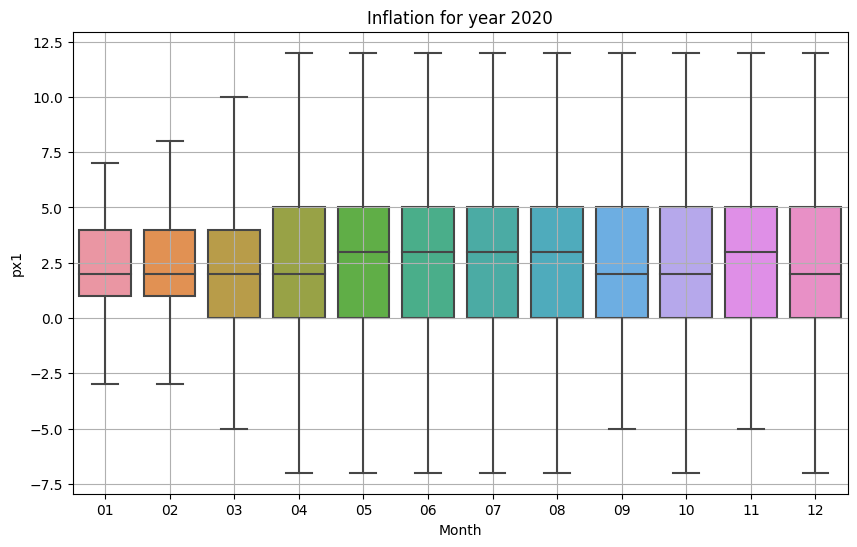

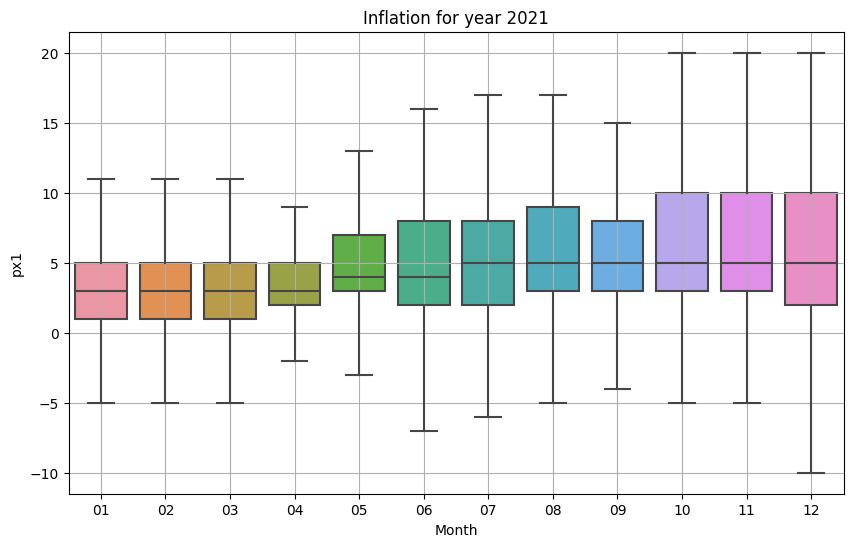

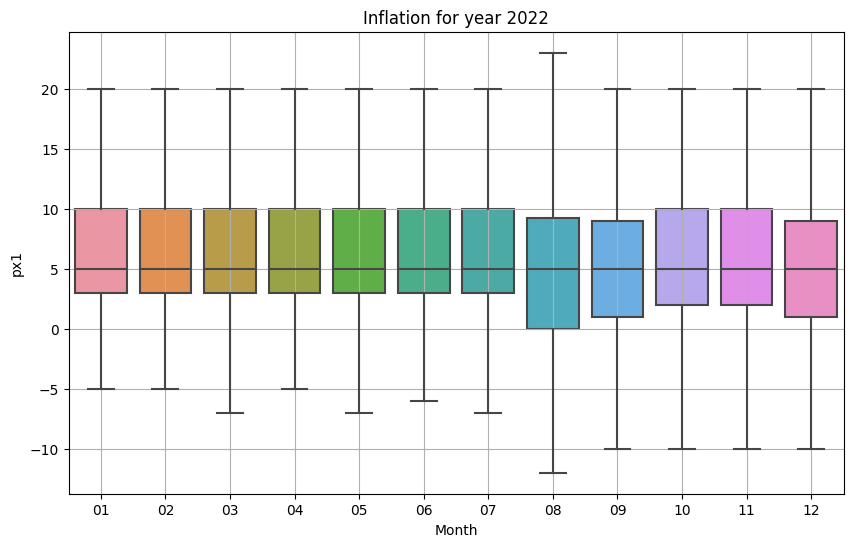

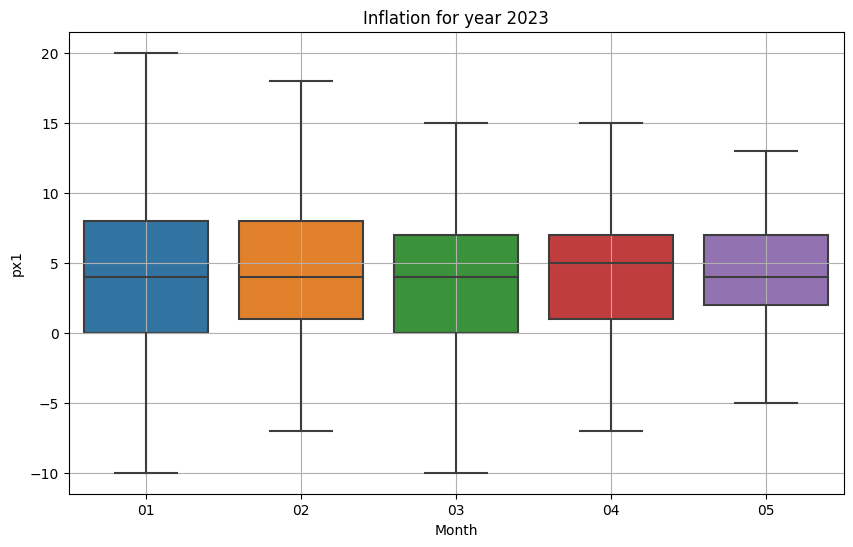

In [3]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your DataFrame
df = pd.read_csv('cleaned_dataset.csv')  # Replace with your file name

# Convert 'yyyymm' to string to make sure we can perform string operations on it
df['YYYYMM'] = df['YYYYMM'].astype(str)

# Extract the year and month from the 'yyyymm' column
df['year'] = df['YYYYMM'].apply(lambda x: x[:4])
df['month'] = df['YYYYMM'].apply(lambda x: x[4:])

# Get unique years
years = df['year'].unique()

# Create separate plot for each year
for year in years:
    yearly_data = df[df['year'] == year]
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='month', y='PX1', data=yearly_data, showfliers=False)
    plt.title('Inflation for year {}'.format(year))
    plt.xlabel('Month')
    plt.ylabel('px1')
    plt.grid(True)  # Add grid
    plt.show()


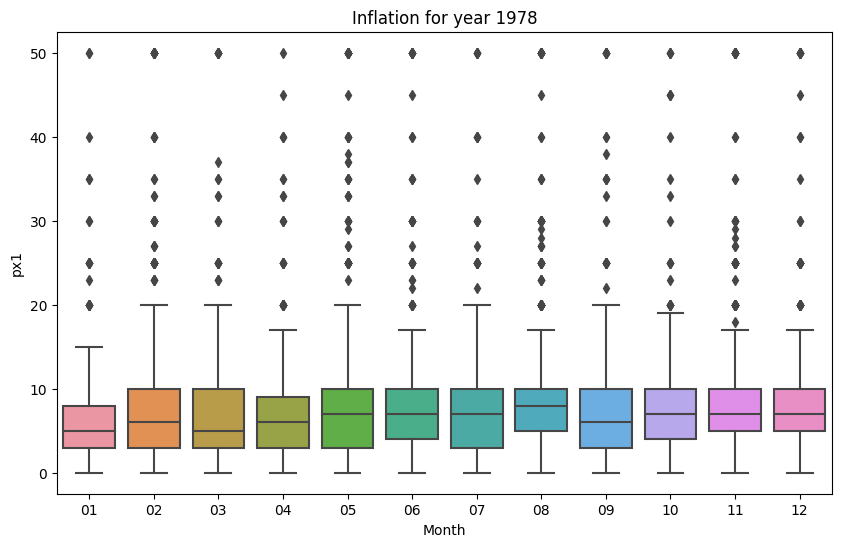

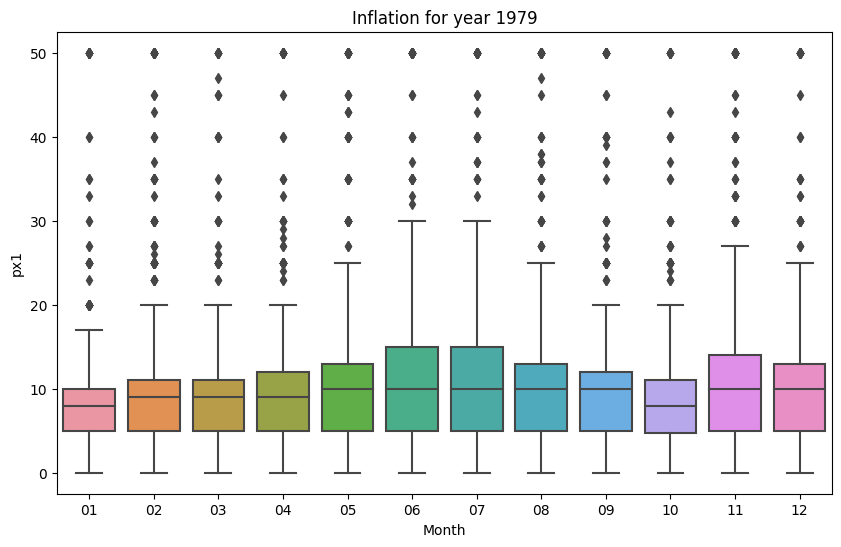

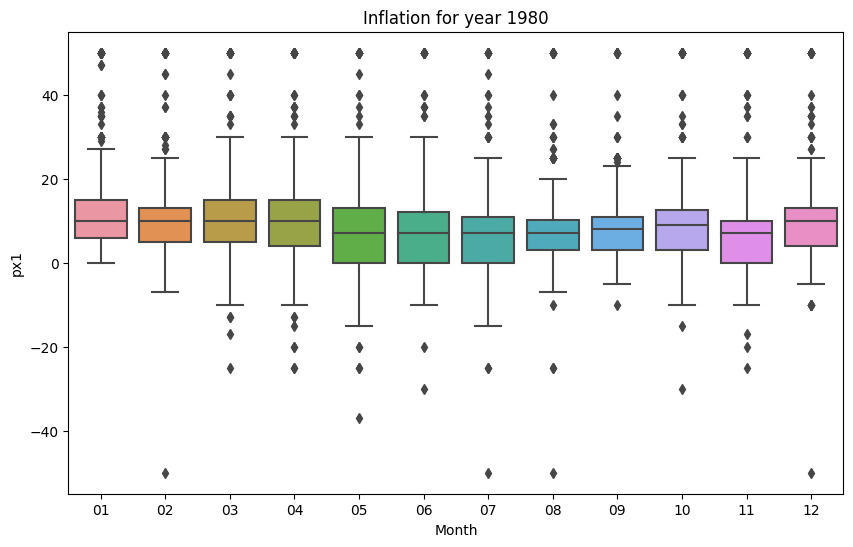

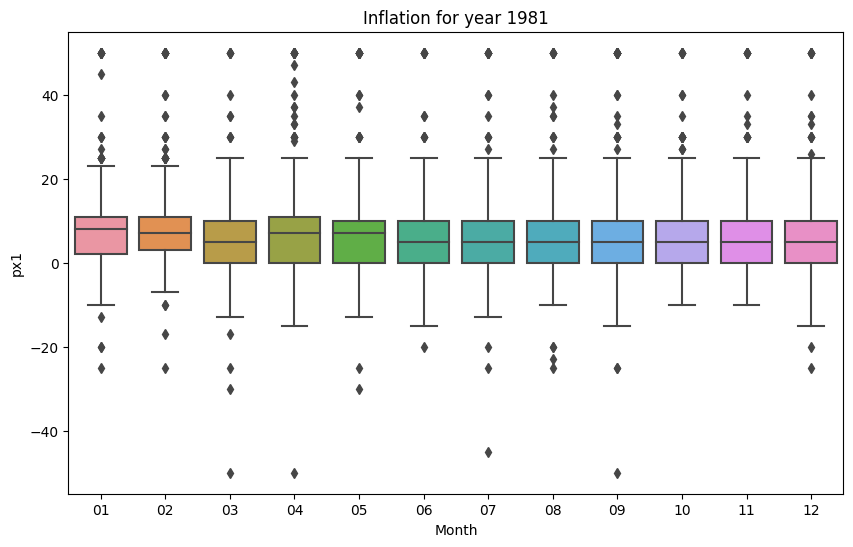

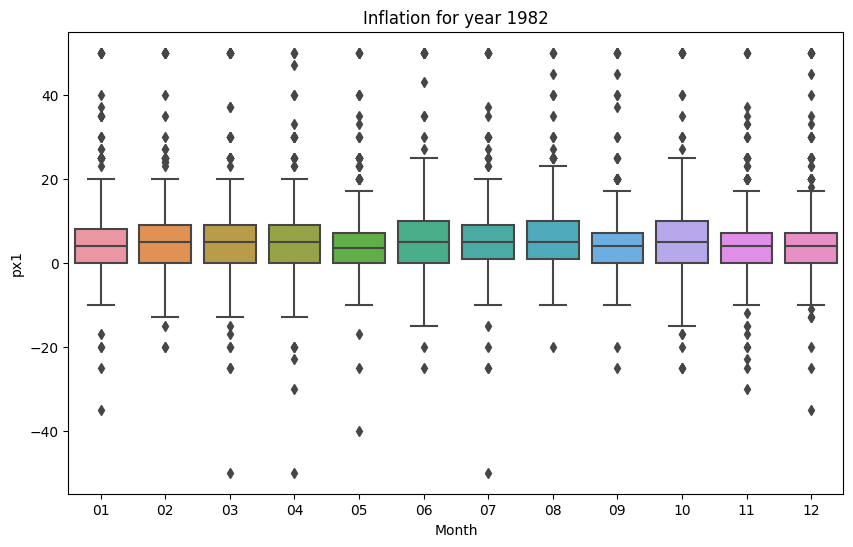

...

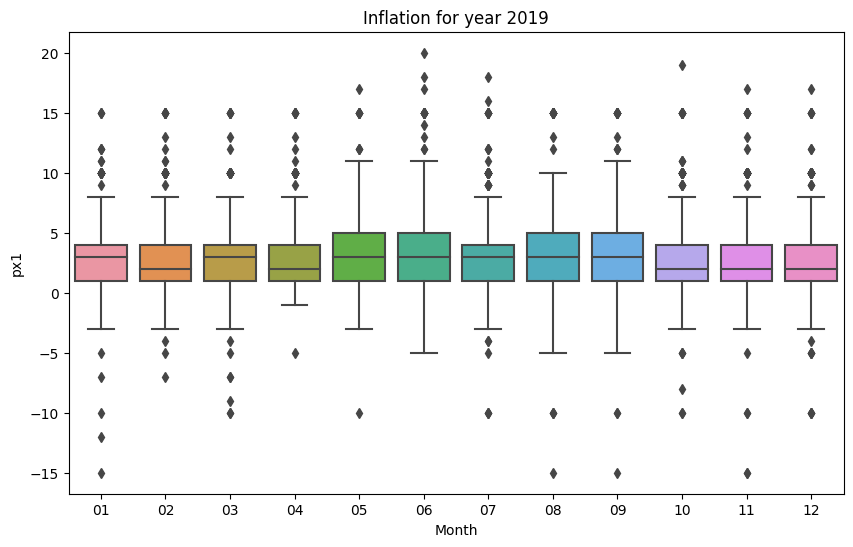

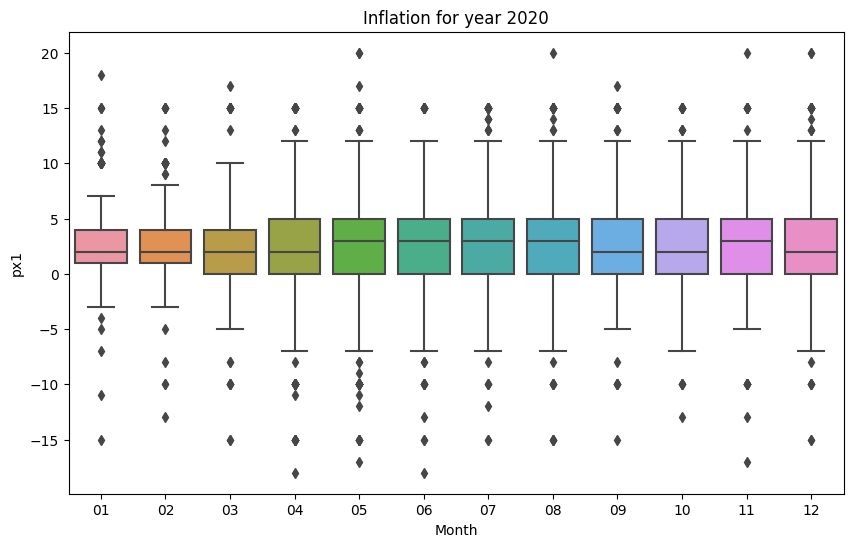

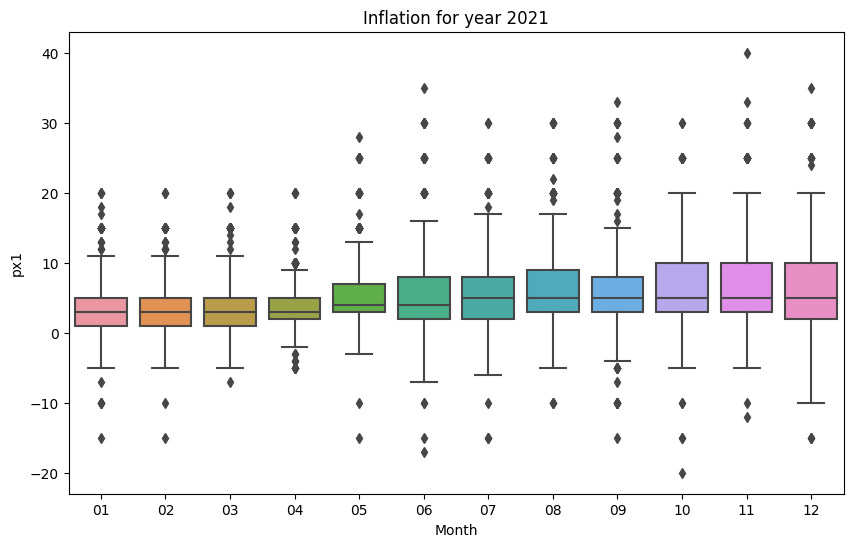

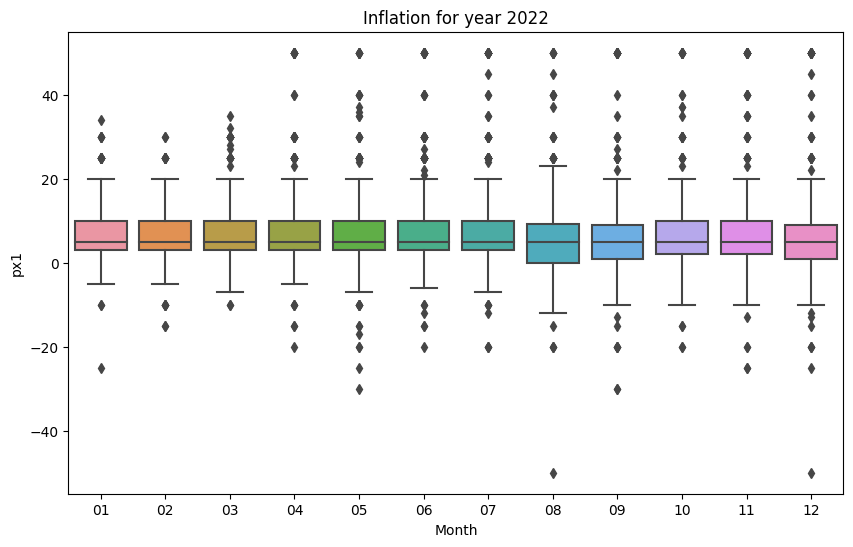

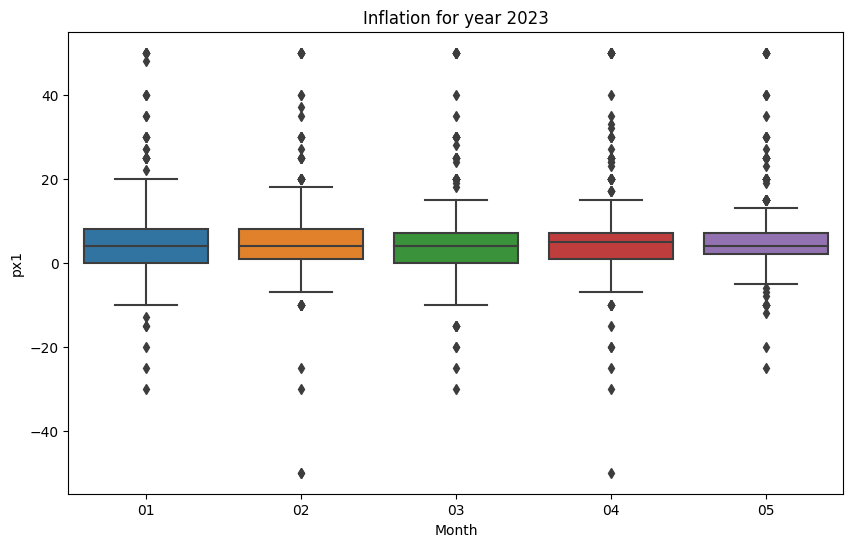

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your DataFrame
df = pd.read_csv('cleaned_dataset.csv') # Replace with your file name

# Convert 'yyyymm' to string to make sure we can perform string operations on it
df['YYYYMM'] = df['YYYYMM'].astype(str)

# Extract the year and month from the 'yyyymm' column
df['year'] = df['YYYYMM'].apply(lambda x: x[:4])
df['month'] = df['YYYYMM'].apply(lambda x: x[4:])

# Get unique years
years = df['year'].unique()

# Create separate plot for each year
for year in years:
    yearly_data = df[df['year'] == year]
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='month', y='PX1', data=yearly_data)
    plt.title('Inflation for year {}'.format(year))
    plt.xlabel('Month')
    plt.ylabel('px1')
    plt.show()


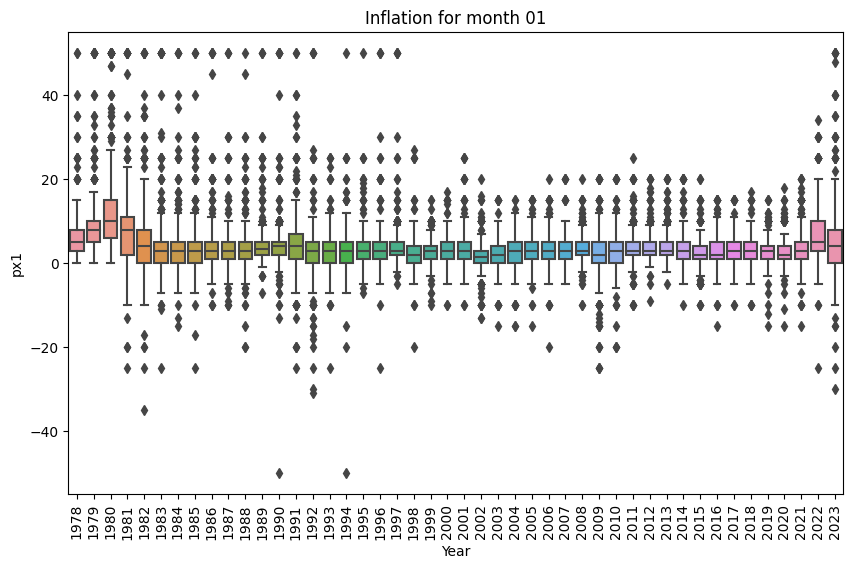

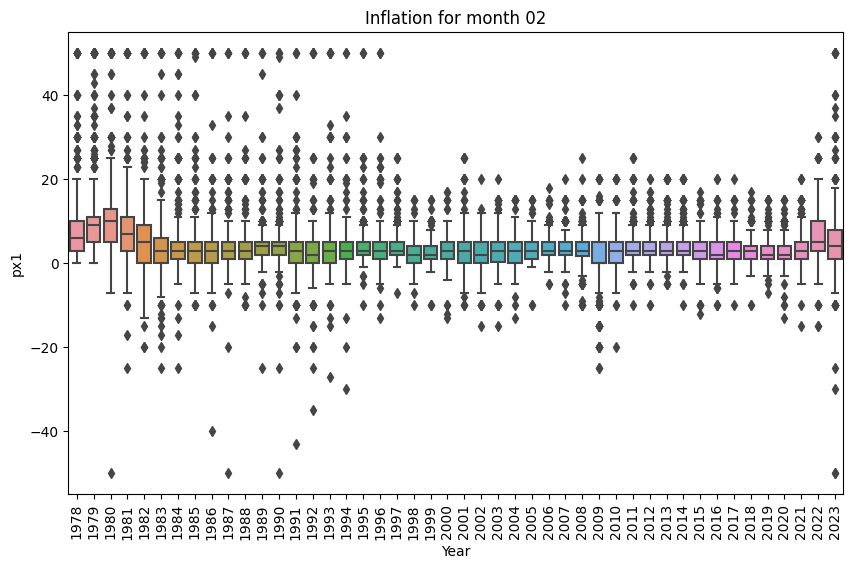

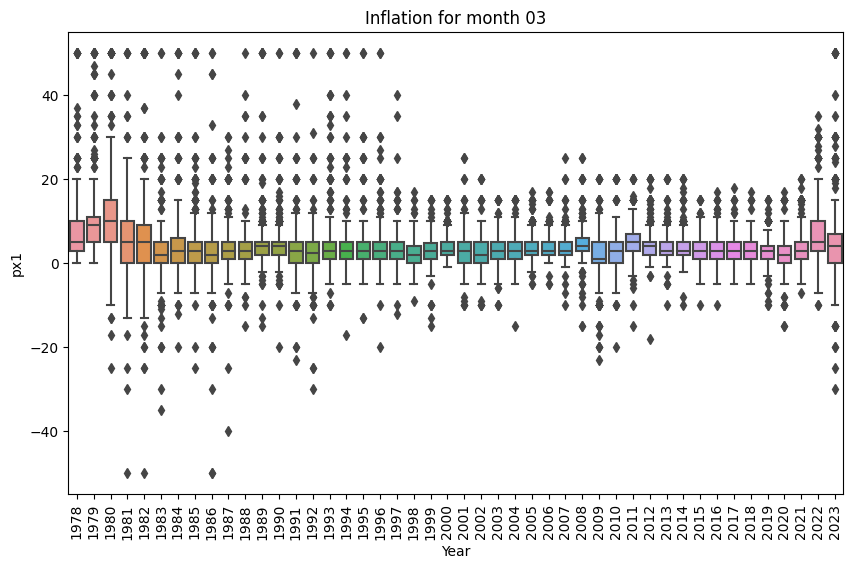

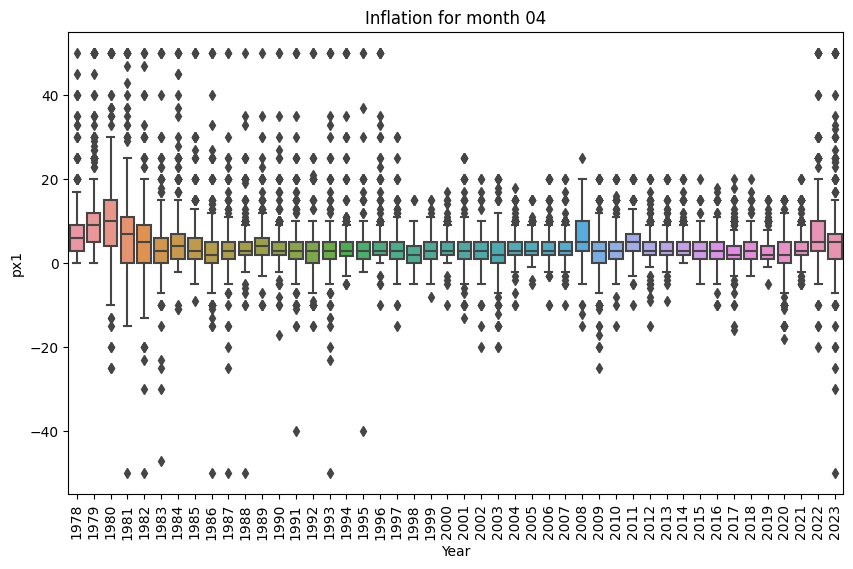

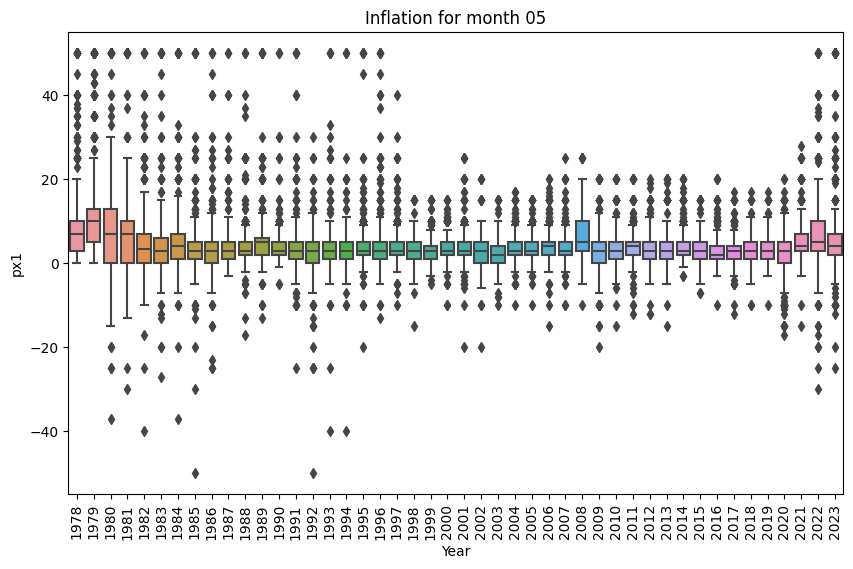

...

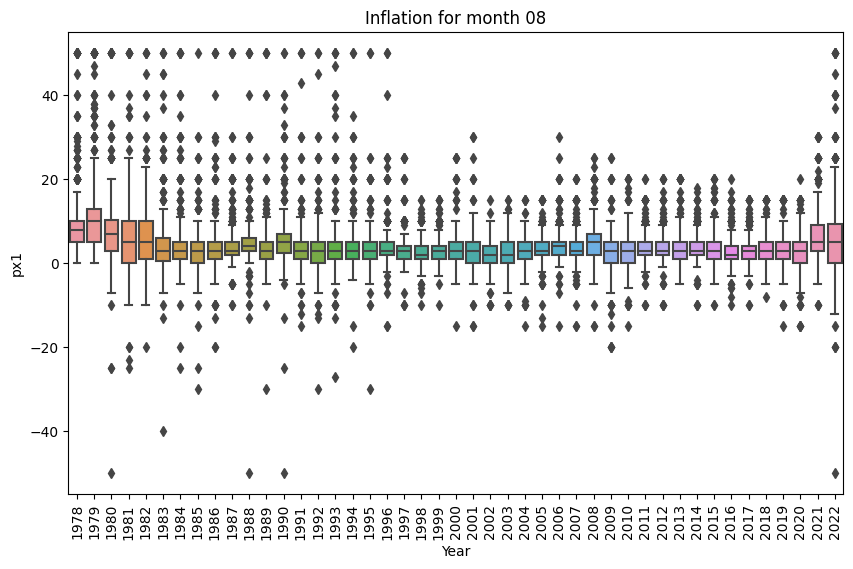

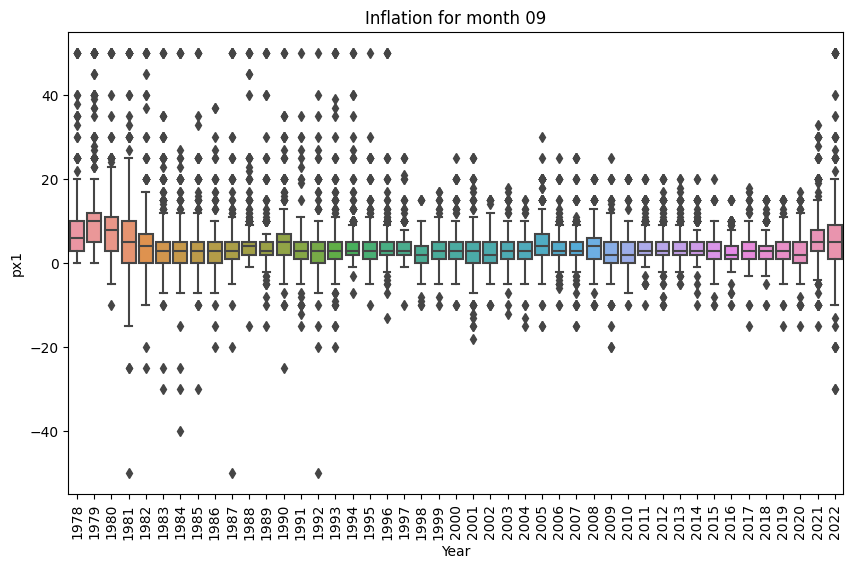

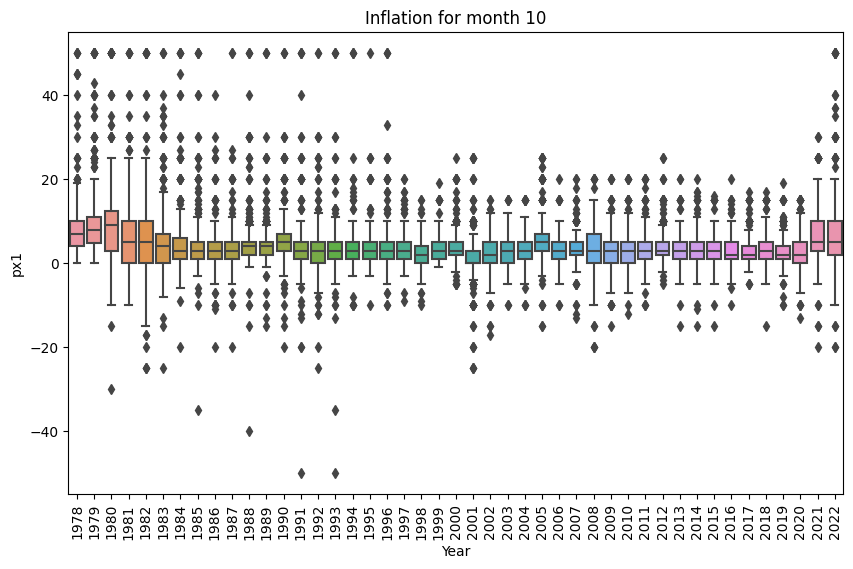

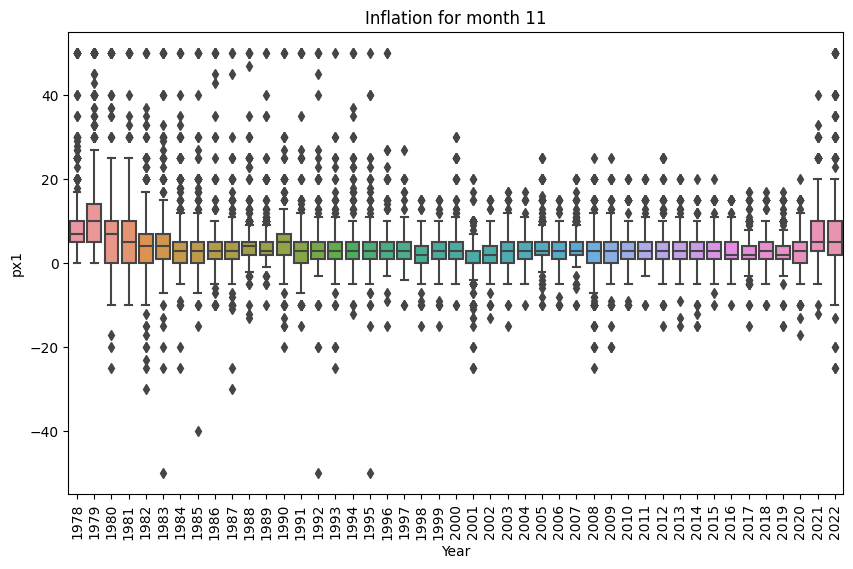

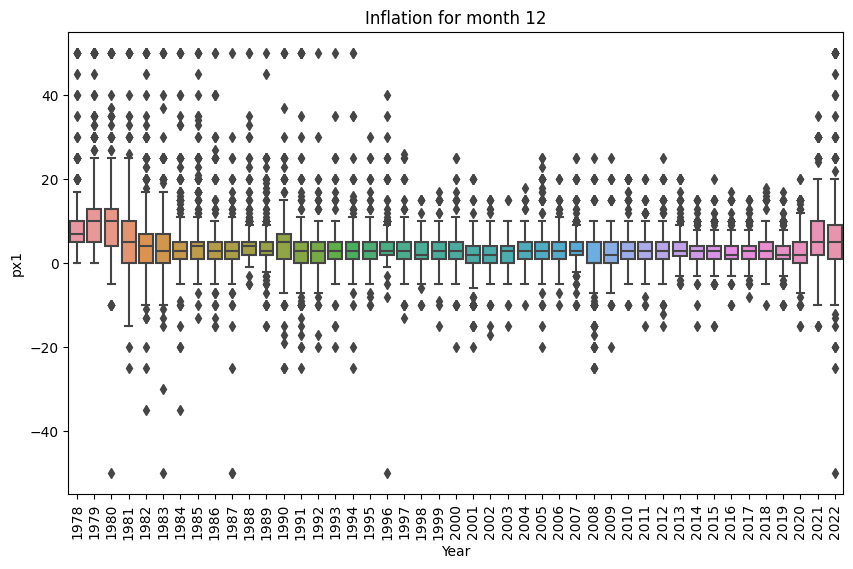

In [12]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your DataFrame
df = pd.read_csv('cleaned_dataset.csv')  # Replace with your file name

# Convert 'yyyymm' to string to make sure we can perform string operations on it
df['YYYYMM'] = df['YYYYMM'].astype(str)

# Extract the year and month from the 'yyyymm' column
df['year'] = df['YYYYMM'].apply(lambda x: x[:4])
df['month'] = df['YYYYMM'].apply(lambda x: x[4:])

# Get unique months
months = df['month'].unique()

# Create separate plot for each month
for month in months:
    monthly_data = df[df['month'] == month]
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='year', y='PX1', data=monthly_data)
    plt.title('Inflation for month {}'.format(month))
    plt.xlabel('Year')
    plt.ylabel('px1')
    plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
    plt.show()


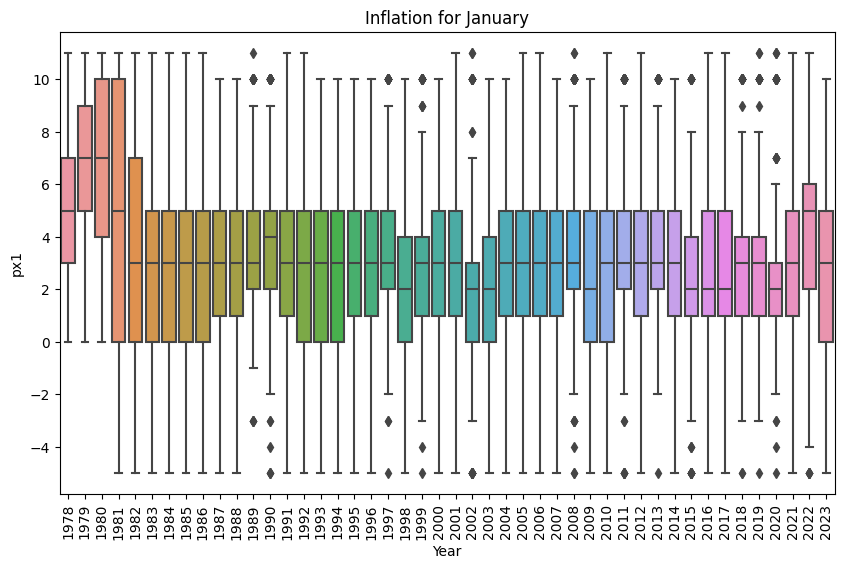

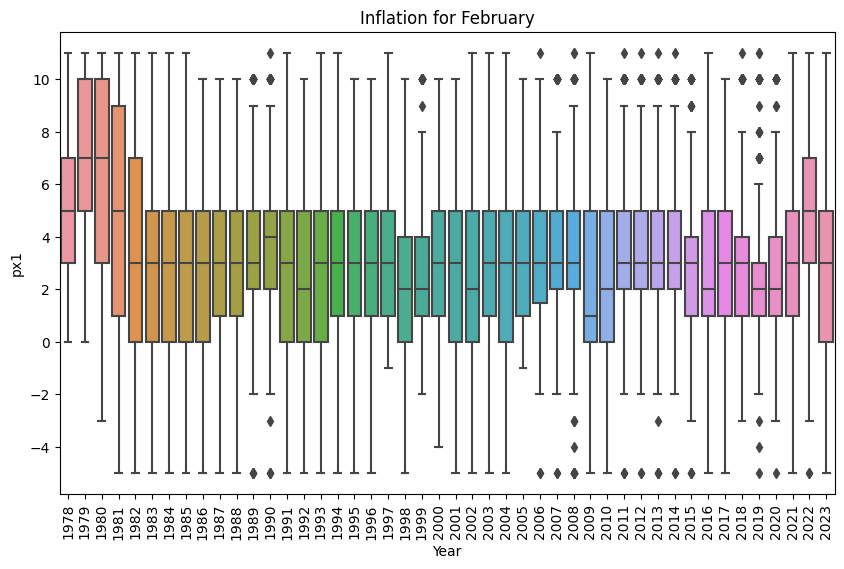

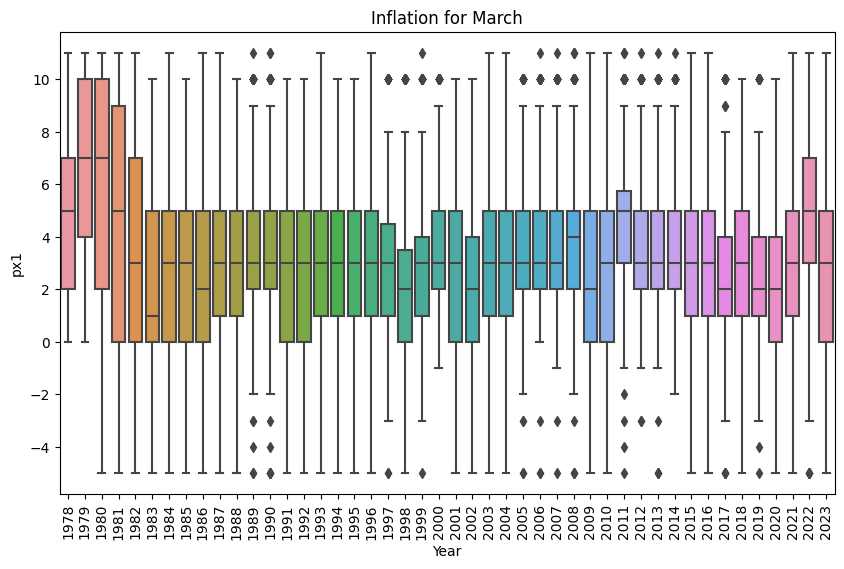

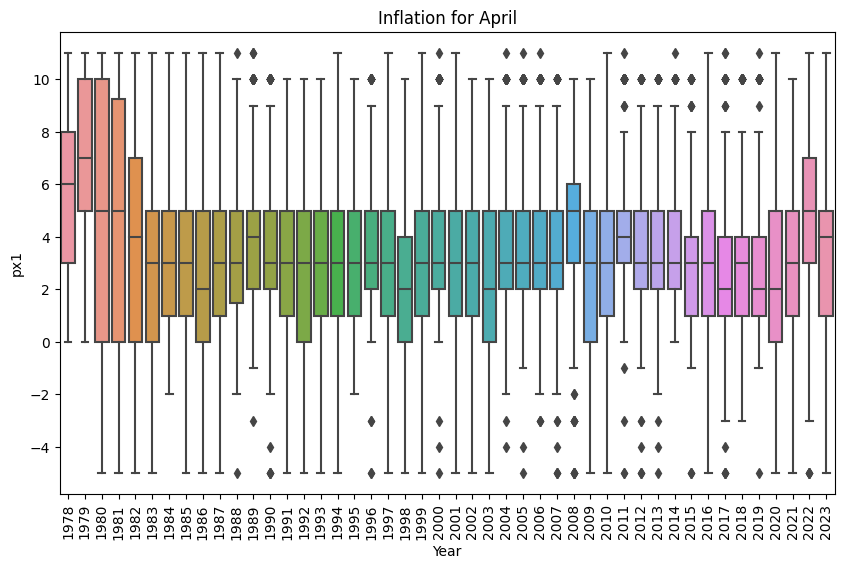

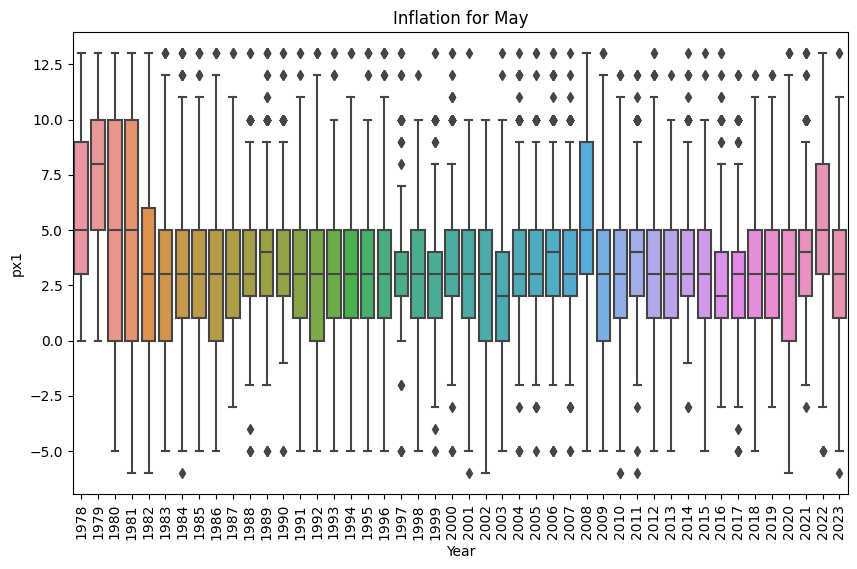

...

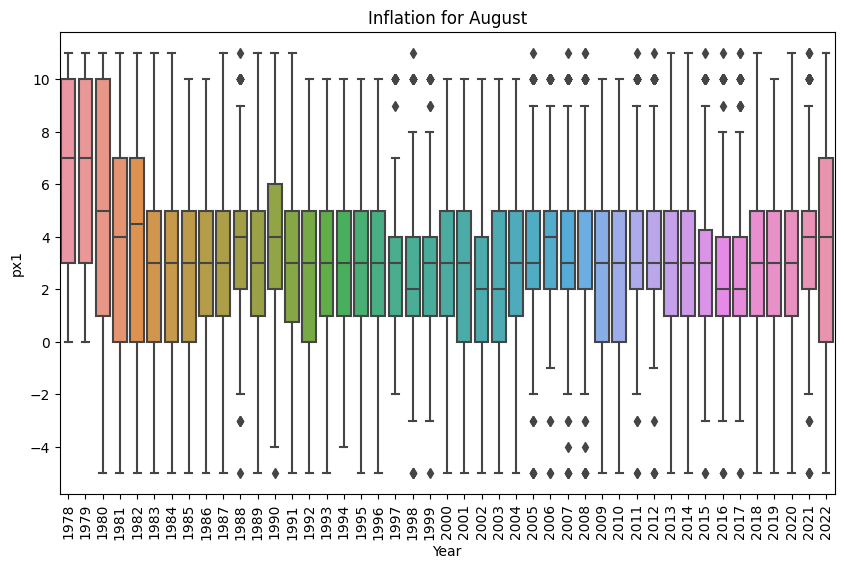

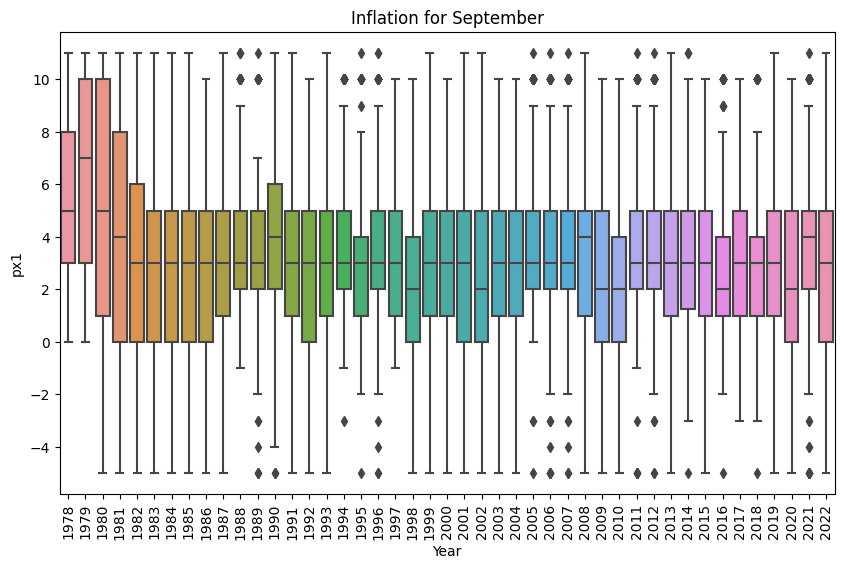

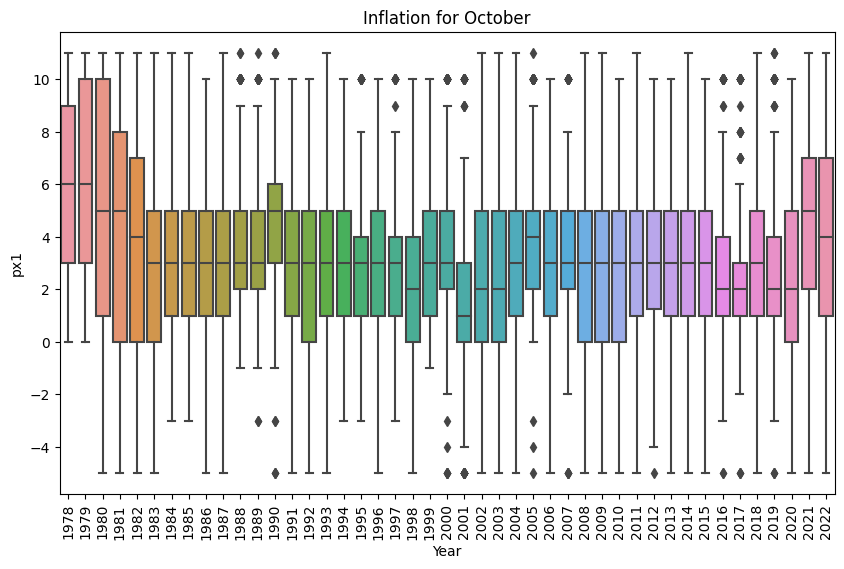

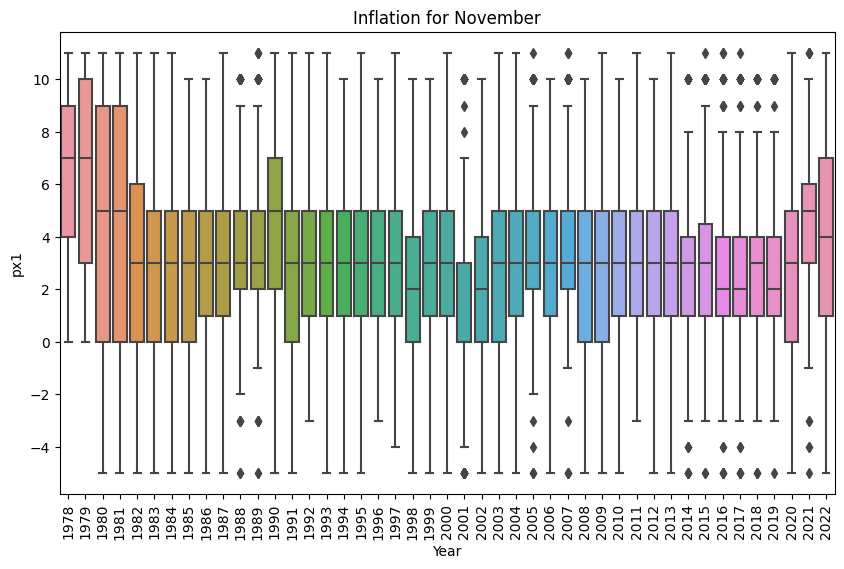

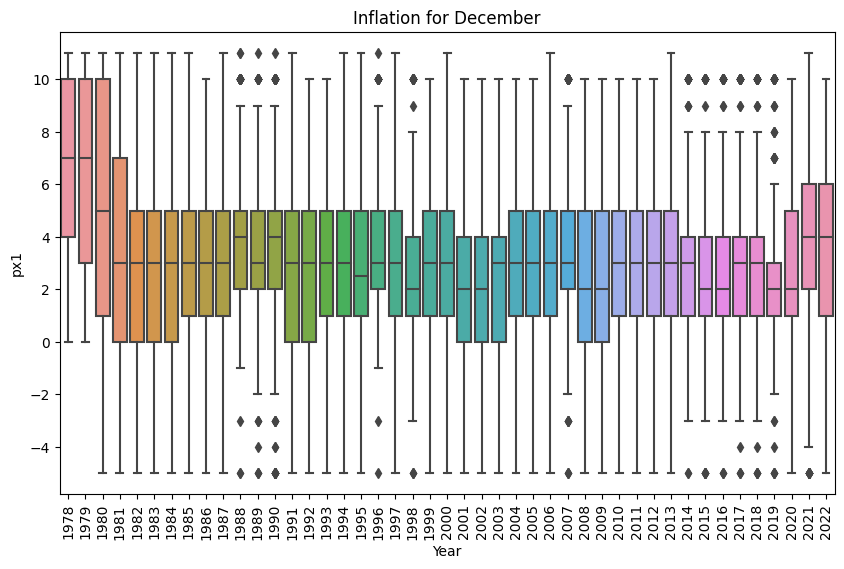

In [7]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your DataFrame
df = pd.read_csv('cleaned_dataset.csv')  # Replace with your file name

# Convert 'yyyymm' to string to make sure we can perform string operations on it
df['YYYYMM'] = df['YYYYMM'].astype(str)

# Extract the year and month from the 'yyyymm' column
df['year'] = df['YYYYMM'].apply(lambda x: x[:4])
df['month'] = df['YYYYMM'].apply(lambda x: x[4:])

# Function to remove outliers using the IQR method
def remove_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]

# Remove outliers for each month
df_cleaned = pd.DataFrame()
for month in df['month'].unique():
    monthly_data = df[df['month'] == month]
    cleaned_data = remove_outliers_iqr(monthly_data, 'PX1')
    df_cleaned = pd.concat([df_cleaned, cleaned_data])

# Define a list of month names
month_names = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Create separate plot for each month without outliers
for month_num, month_name in enumerate(month_names, start=1):
    monthly_data_cleaned = df_cleaned[df_cleaned['month'] == str(month_num).zfill(2)]
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='year', y='PX1', data=monthly_data_cleaned)
    plt.title('Inflation for {}'.format(month_name))
    plt.xlabel('Year')
    plt.ylabel('px1')
    plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
    plt.show()


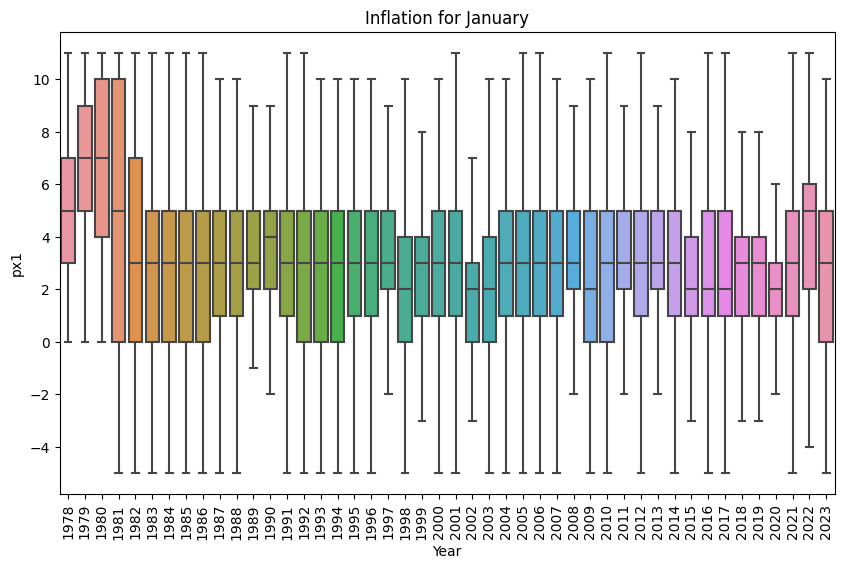

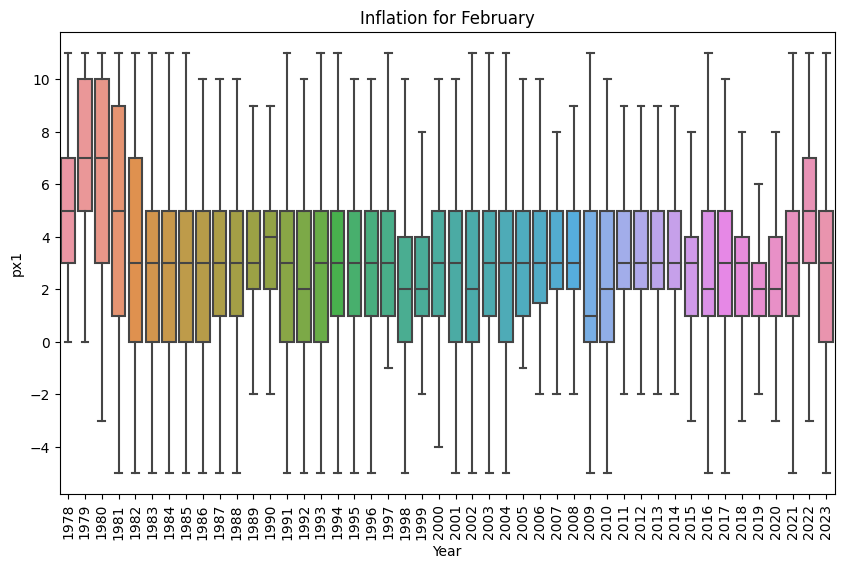

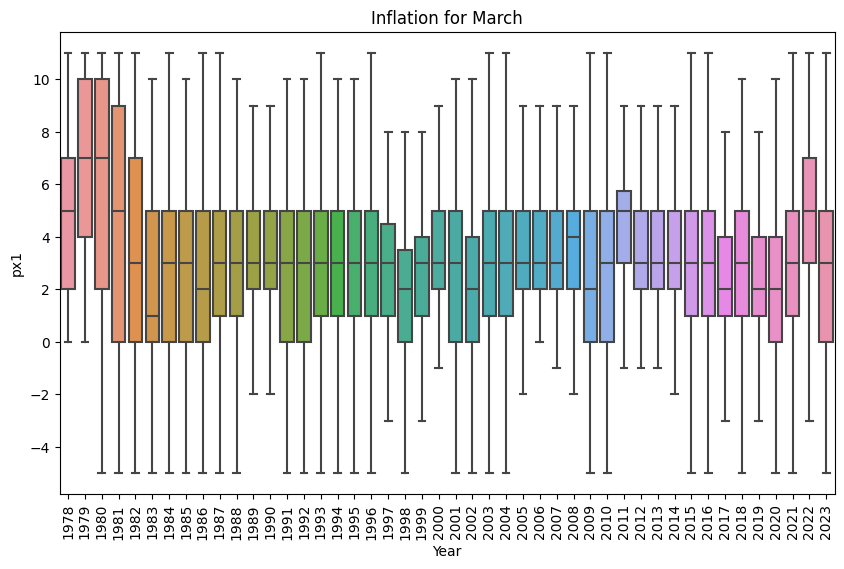

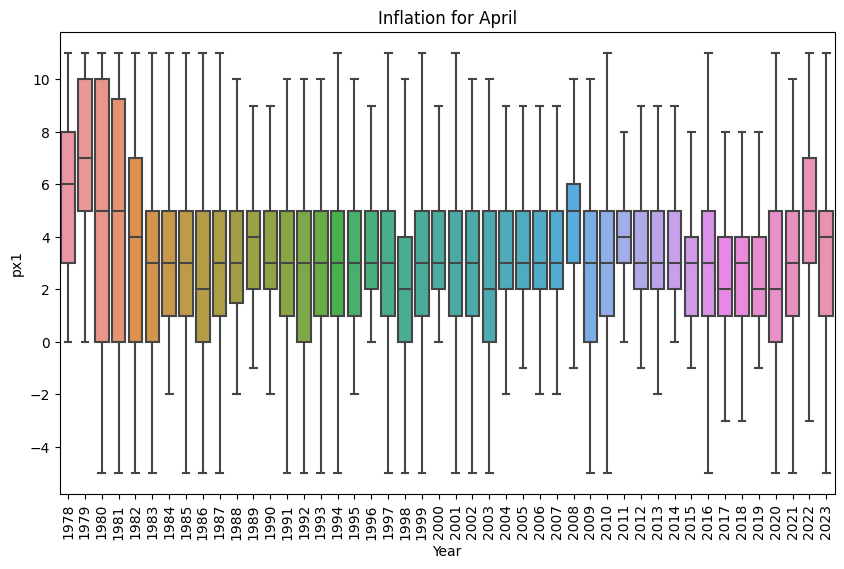

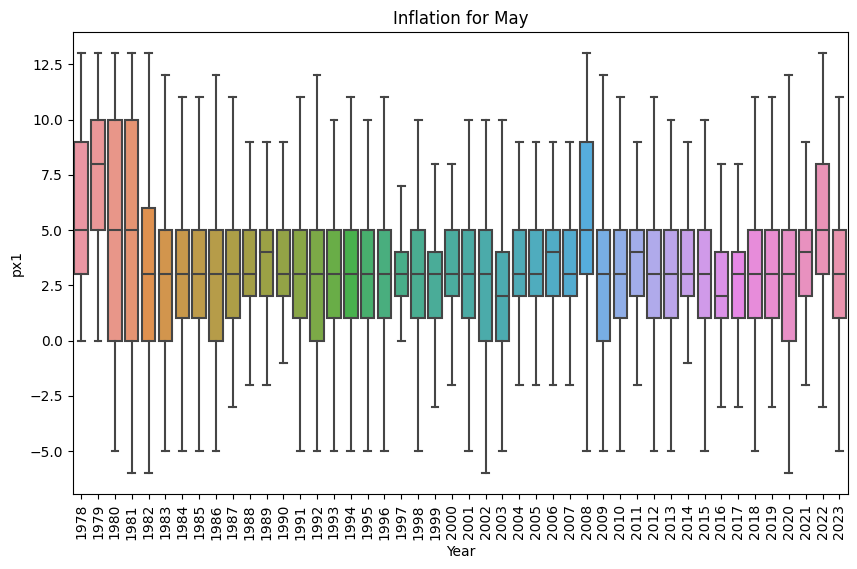

...

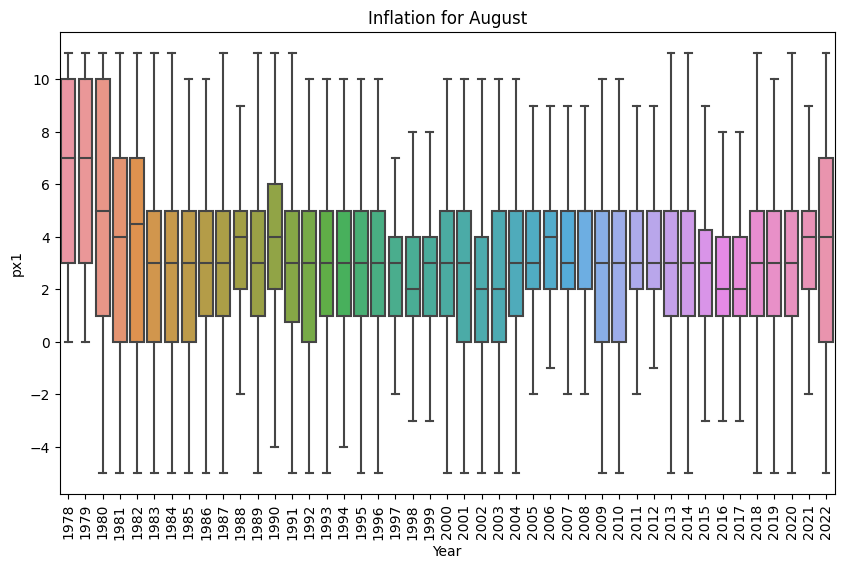

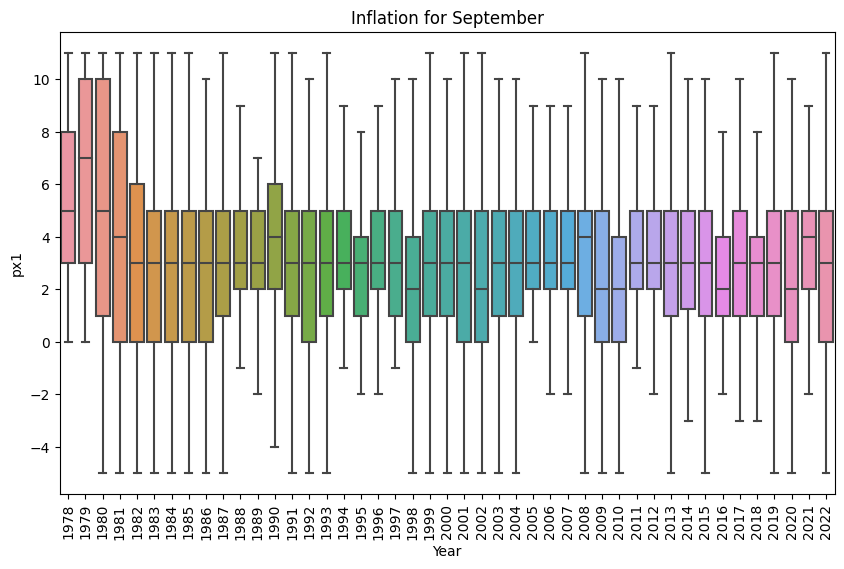

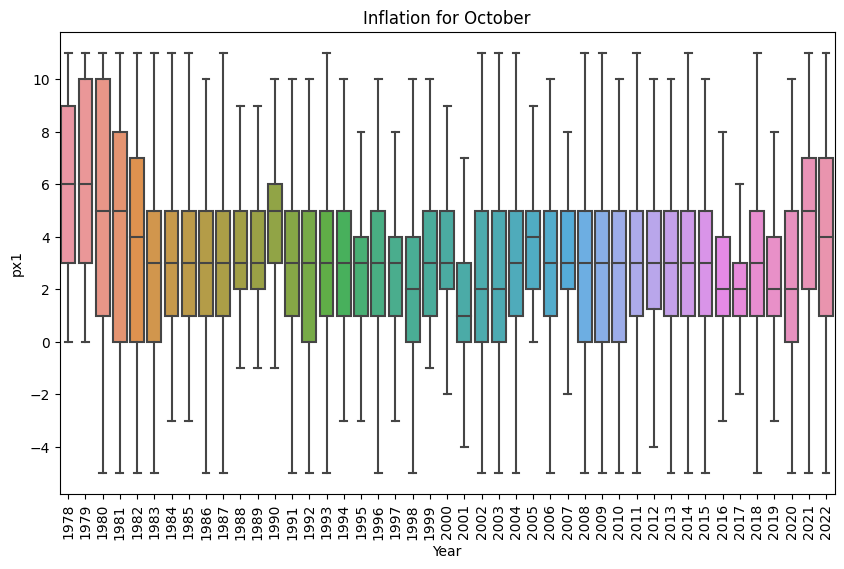

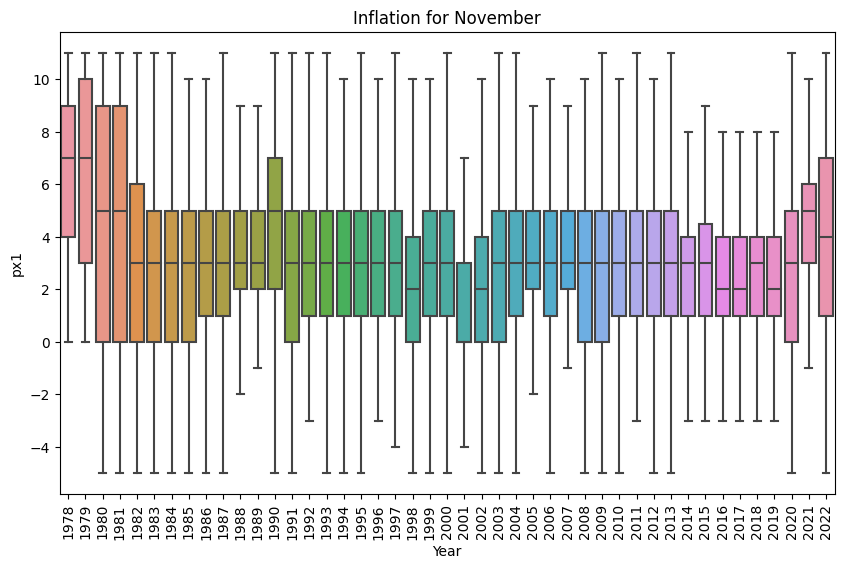

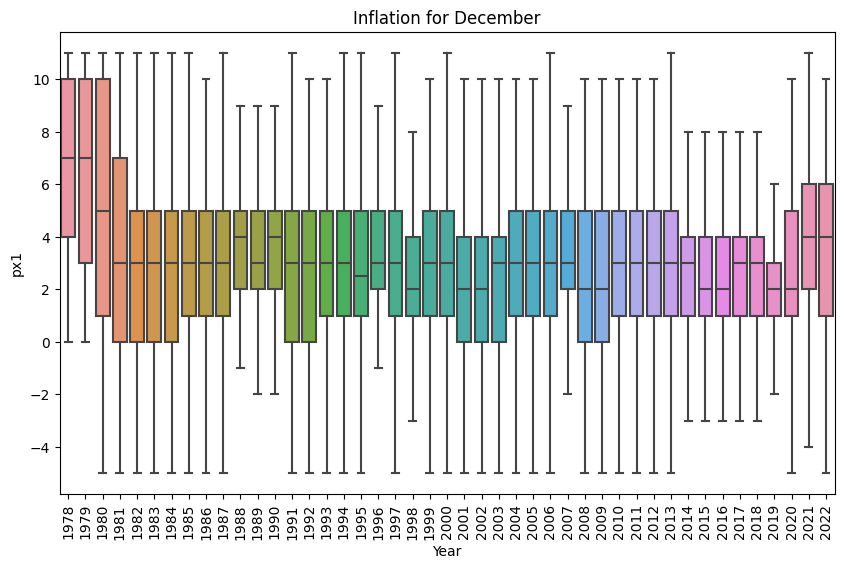

In [8]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your DataFrame
df = pd.read_csv('cleaned_dataset.csv')  # Replace with your file name

# Convert 'yyyymm' to string to make sure we can perform string operations on it
df['YYYYMM'] = df['YYYYMM'].astype(str)

# Extract the year and month from the 'yyyymm' column
df['year'] = df['YYYYMM'].apply(lambda x: x[:4])
df['month'] = df['YYYYMM'].apply(lambda x: x[4:])

# Function to remove outliers using the IQR method
def remove_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]

# Remove outliers for each month
df_cleaned = pd.DataFrame()
for month in df['month'].unique():
    monthly_data = df[df['month'] == month]
    cleaned_data = remove_outliers_iqr(monthly_data, 'PX1')
    df_cleaned = pd.concat([df_cleaned, cleaned_data])

# Define a list of month names
month_names = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Create separate plot for each month without outliers
for month_num, month_name in enumerate(month_names, start=1):
    monthly_data_cleaned = df_cleaned[df_cleaned['month'] == str(month_num).zfill(2)]
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='year', y='PX1', data=monthly_data_cleaned, sym='')
    plt.title('Inflation for {}'.format(month_name))
    plt.xlabel('Year')
    plt.ylabel('px1')
    plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
    plt.show()


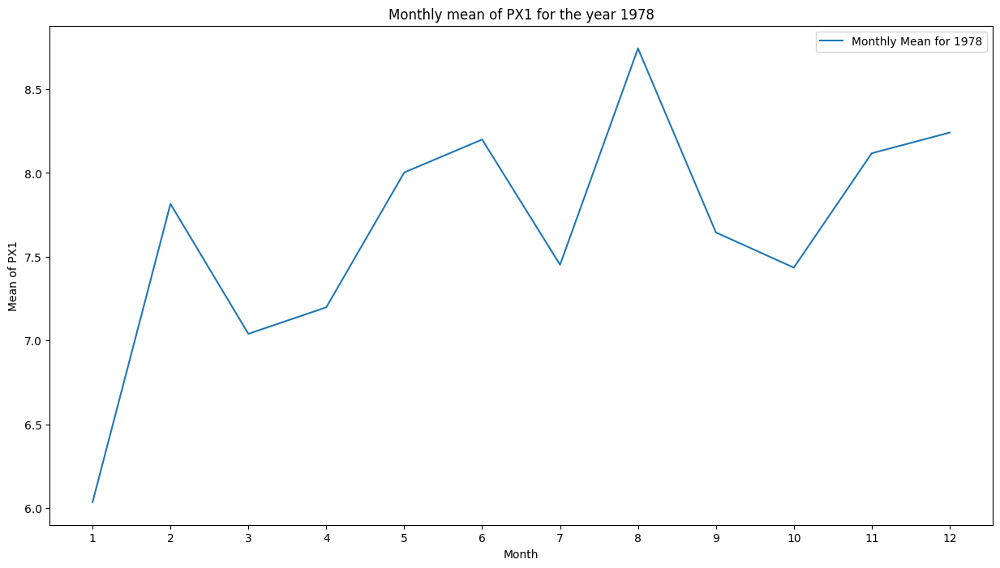

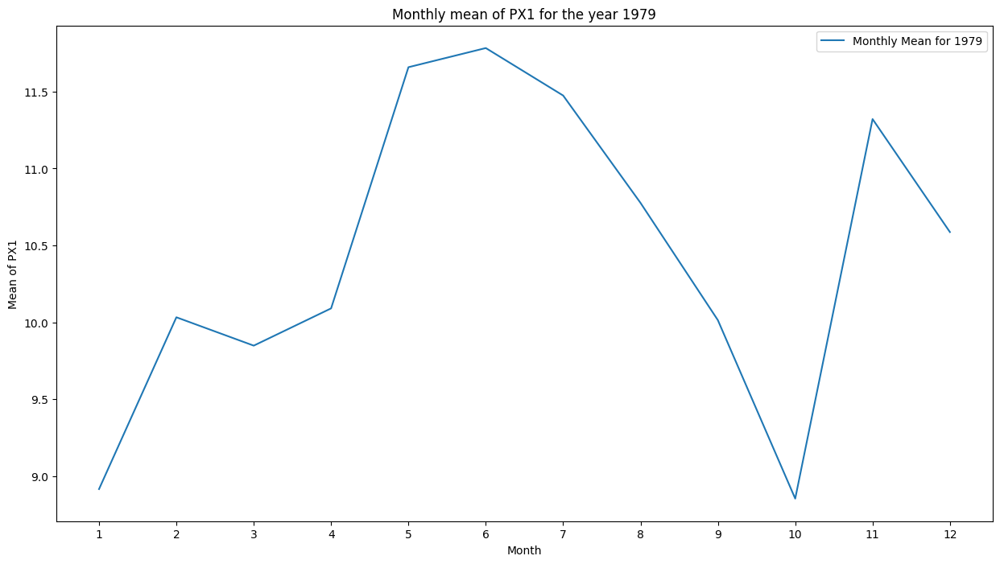

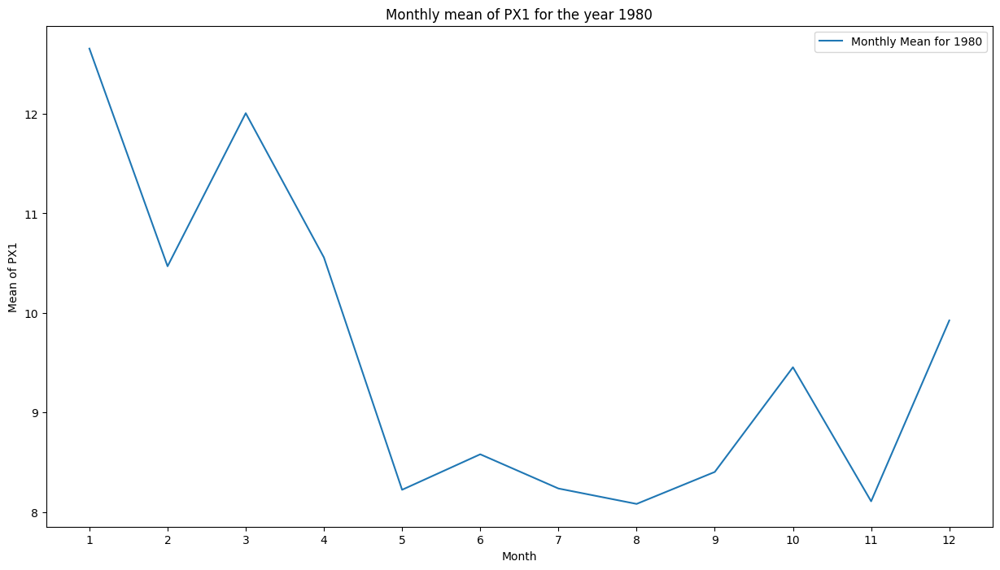

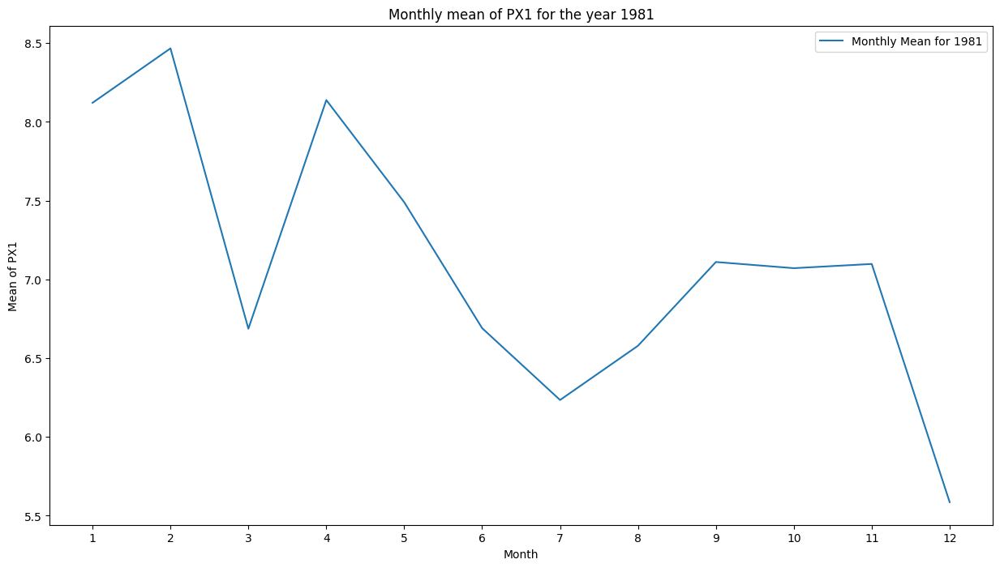

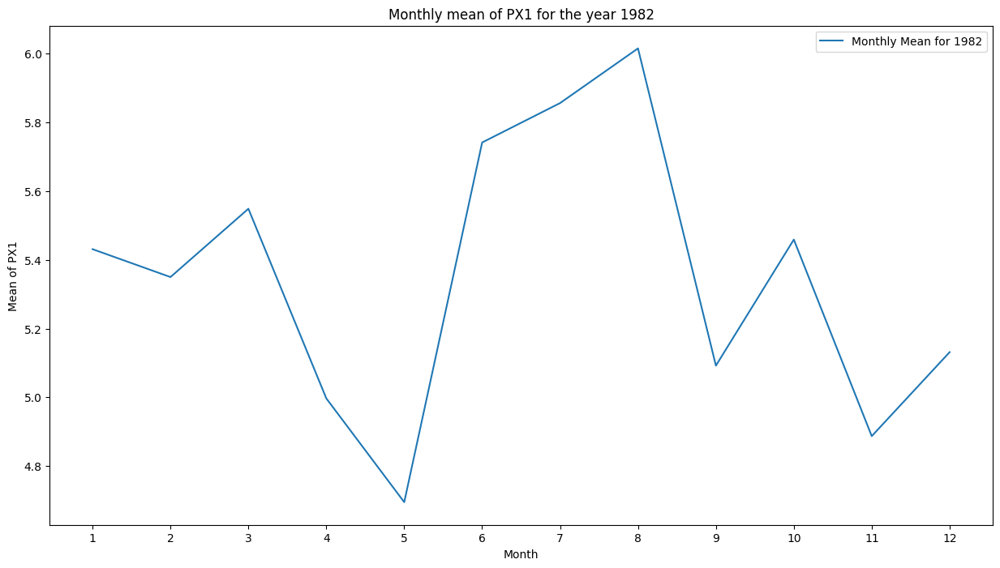

...

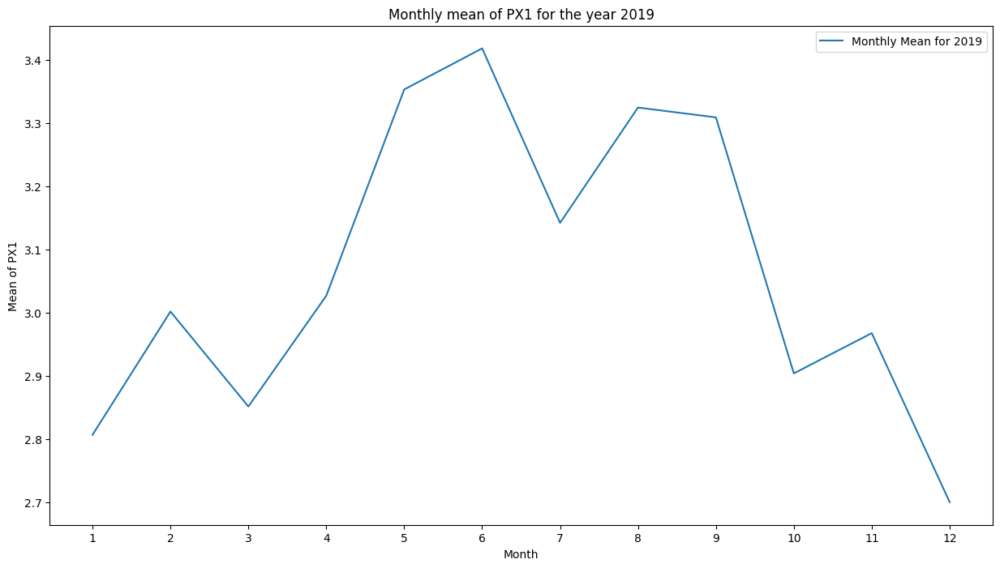

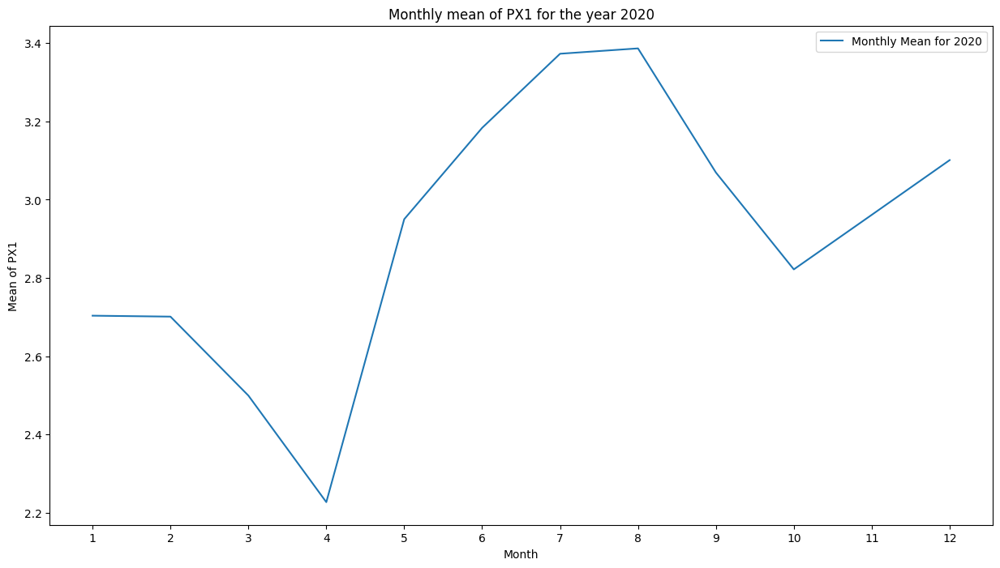

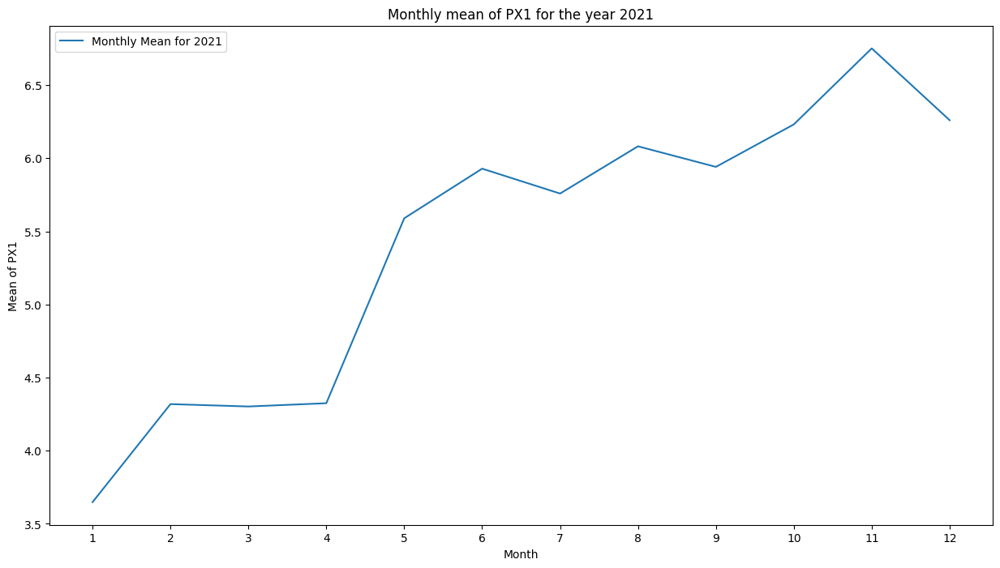

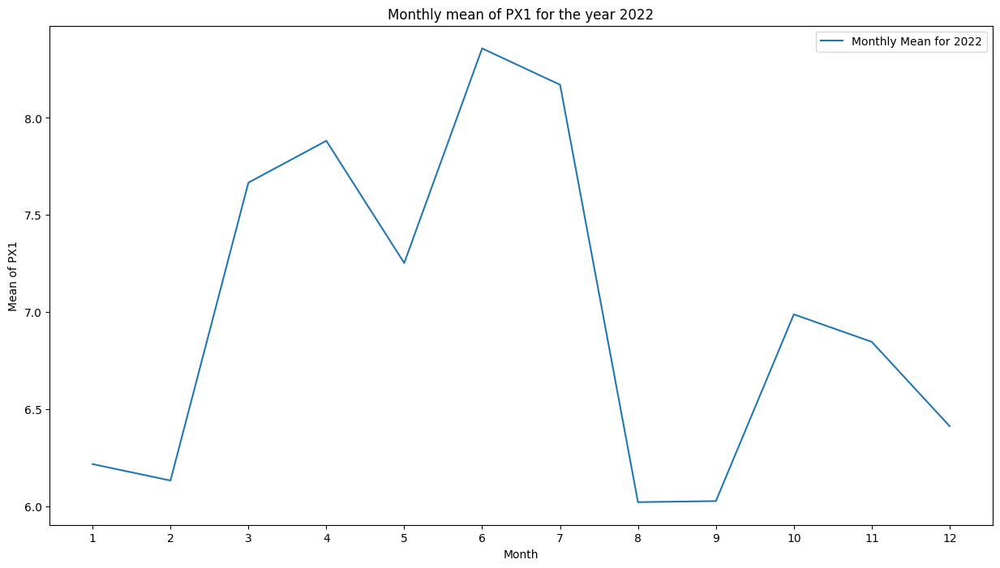

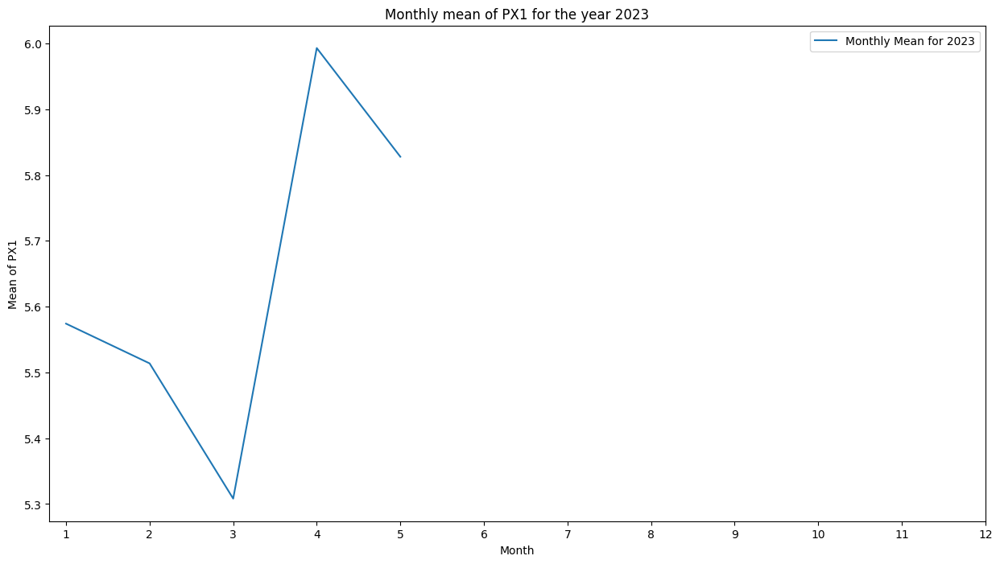

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load your DataFrame
mean_df = pd.read_csv('monthly_means.csv')

# Get the unique years
years = mean_df['year'].unique()

# Create a separate plot for each year
for year in years:
    plt.figure(figsize=(15,8))
    year_data = mean_df[mean_df['year'] == year]
    plt.plot(year_data['month'], year_data['PX1'], label='Monthly Mean for {}'.format(year))
    plt.xlabel('Month')
    plt.ylabel('Mean of PX1')
    plt.title('Monthly mean of PX1 for the year {}'.format(year))
    plt.xticks(range(1, 13))
    plt.legend()
    plt.show()


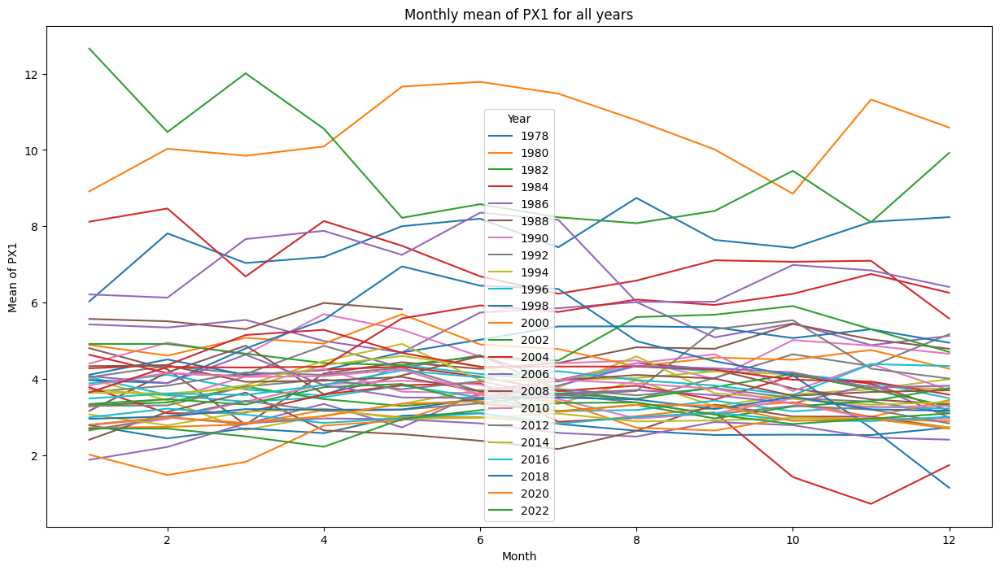

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load your DataFrame
mean_df = pd.read_csv('monthly_means.csv')

# Get unique years
years = mean_df['year'].unique()

plt.figure(figsize=(15,8))

# Create a line for each year
for year in years:
    year_data = mean_df[mean_df['year'] == year]
    plt.plot(year_data['month'], year_data['PX1'], label=str(year))

plt.xlabel('Month')
plt.ylabel('Mean of PX1')
plt.title('Monthly mean of PX1 for all years')

# Limit the number of legend entries
if len(years) > 20: # or whatever number you feel appropriate
    plt.legend(years[::int(len(years)/20)], title="Year")
else:
    plt.legend(title="Year")

plt.show()


In [18]:
! pip install nbconvert
! pip install pandoc


                                              0.0/290.4 kB ? eta -:--:--
     --------------                         112.6/290.4 kB 6.8 MB/s eta 0:00:01
     -------------------------------------- 290.4/290.4 kB 3.6 MB/s eta 0:00:00
                                              0.0/162.5 kB ? eta -:--:--
     -------------------------------------- 162.5/162.5 kB 4.8 MB/s eta 0:00:00
                                              0.0/48.0 kB ? eta -:--:--
     ---------------------------------------- 48.0/48.0 kB ? eta 0:00:00
                                              0.0/73.1 kB ? eta -:--:--
     ---------------------------------------- 73.1/73.1 kB 3.9 MB/s eta 0:00:00
                                              0.0/77.6 kB ? eta -:--:--
     ---------------------------------------- 77.6/77.6 kB 4.5 MB/s eta 0:00:00
                                              0.0/90.4 kB ? eta -:--:--
     ---------------------------------------- 90.4/90.4 kB 5.0 MB/s eta 0:00:00
             

In [19]:
jupyter nbconvert --to pdf m.ipynb


SyntaxError: invalid syntax (33762989.py, line 1)

In [20]:
import pandas as pd

# Load your data
df = pd.read_csv('hiii3.csv')

# Reset the index to make 'Year' a column, not the index
df.reset_index(level=0, inplace=True)

# Melt the DataFrame from wide format to long format
df_melted = df.melt(id_vars='Year', var_name='Month', value_name='FPCPITOTLZGUSA')

# You now have a DataFrame with three columns: 'Year', 'Month', and 'FPCPITOTLZGUSA'

# You can create a new column 'YYYYMM' that combines 'Year' and 'Month'
df_melted['YYYYMM'] = df_melted['Year'].astype(str) + df_melted['Month'].str.zfill(2)

# You can then drop the 'Year' and 'Month' columns if you don't need them
df_final = df_melted.drop(['Year', 'Month'], axis=1)

# Reorder the columns to have 'YYYYMM' first and 'FPCPITOTLZGUSA' second
df_final = df_final[['YYYYMM', 'FPCPITOTLZGUSA']]

# Now 'df_final' is in the format you want, and you can save it to a new CSV file
df_final.to_csv('newfile.csv', index=False)


In [21]:
import pandas as pd

# Load your data
df = pd.read_csv('hiii3.csv')

# Melt the DataFrame from wide format to long format
df_melted = df.melt(id_vars='Year', var_name='Month', value_name='PX1')

# Create a dictionary to map month names to numbers
month_dict = {'Jan': '01', 'Feb': '02', 'Mar': '03', 'Apr': '04', 'May': '05', 'Jun': '06', 'Jul': '07', 'Aug': '08', 'Sep': '09', 'Oct': '10', 'Nov': '11', 'Dec': '12'}

# Replace the month names with numbers
df_melted['Month'] = df_melted['Month'].map(month_dict)

# Create 'YYYYMM' column
df_melted['YYYYMM'] = df_melted['Year'].astype(str) + df_melted['Month']

# Reorder the columns
df_melted = df_melted[['Year', 'Month', 'PX1', 'YYYYMM']]

# Rename 'Year' to 'year', 'Month' to 'month', and 'PX1' to 'px1'
df_melted.rename(columns={'Year': 'year', 'Month': 'month', 'PX1': 'px1'}, inplace=True)

# Save to new CSV
df_melted.to_csv('new2file.csv', index=False)


In [ ]:
# Convert 'YYYYMM' to integer for comparison
df_melted['YYYYMM'] = df_melted['YYYYMM'].astype(int)

# Keep only the rows with 'YYYYMM' between 197801 and 202305
df_filtered = df_melted[(df_melted['YYYYMM'] >= 197801) & (df_melted['YYYYMM'] <= 202305)]

# Save to new CSV
df_filtered.to_csv('newfile.csv', index=False)


In [22]:
import pandas as pd

# Load your data
df = pd.read_csv('hiii3.csv')

# Melt the DataFrame from wide format to long format
df_melted = df.melt(id_vars='Year', var_name='Month', value_name='PX1')

# Create a dictionary to map month names to numbers
month_dict = {'Jan': '01', 'Feb': '02', 'Mar': '03', 'Apr': '04', 'May': '05', 'Jun': '06', 'Jul': '07', 'Aug': '08', 'Sep': '09', 'Oct': '10', 'Nov': '11', 'Dec': '12'}

# Replace the month names with numbers
df_melted['Month'] = df_melted['Month'].map(month_dict)

# Create 'YYYYMM' column
df_melted['YYYYMM'] = df_melted['Year'].astype(str) + df_melted['Month']

# Reorder the columns
df_melted = df_melted[['Year', 'Month', 'PX1', 'YYYYMM']]

# Rename 'Year' to 'year', 'Month' to 'month', and 'PX1' to 'px1'
df_melted.rename(columns={'Year': 'year', 'Month': 'month', 'PX1': 'px1'}, inplace=True)

# Save to new CSV
df_melted.to_csv('new3file.csv', index=False)

# Convert 'YYYYMM' to integer for comparison
df_melted['YYYYMM'] = df_melted['YYYYMM'].astype(int)

# Keep only the rows with 'YYYYMM' between 197801 and 202305
df_filtered = df_melted[(df_melted['YYYYMM'] >= 197801) & (df_melted['YYYYMM'] <= 202305)]

# Save to new CSV
df_filtered.to_csv('new4file.csv', index=False)

In [23]:
import pandas as pd

# Load your data
df = pd.read_csv('hiii3.csv')

# Melt the DataFrame from wide format to long format
df_melted = df.melt(id_vars='Year', var_name='Month', value_name='PX1')

# Create a dictionary to map month names to numbers
month_dict = {'Jan': '01', 'Feb': '02', 'Mar': '03', 'Apr': '04', 'May': '05', 'Jun': '06', 'Jul': '07', 'Aug': '08', 'Sep': '09', 'Oct': '10', 'Nov': '11', 'Dec': '12'}

# Replace the month names with numbers
df_melted['Month'] = df_melted['Month'].map(month_dict)

# Create 'YYYYMM' column
df_melted['YYYYMM'] = df_melted['Year'].astype(str) + df_melted['Month']

# Reorder the columns
df_melted = df_melted[['Year', 'Month', 'PX1', 'YYYYMM']]

# Rename 'Year' to 'year', 'Month' to 'month', and 'PX1' to 'px1'
df_melted.rename(columns={'Year': 'year', 'Month': 'month', 'PX1': 'px1'}, inplace=True)

# Save to new CSV
df_melted.to_csv('new5file.csv', index=False)

# Convert 'YYYYMM' to integer for comparison
df_melted['YYYYMM'] = df_melted['YYYYMM'].astype(int)

# Keep only the rows with 'YYYYMM' between 197801 and 202305
df_filtered = df_melted[(df_melted['YYYYMM'] >= 197701) & (df_melted['YYYYMM'] <= 202305)]

# Save to new CSV
df_filtered.to_csv('new6file.csv', index=False)

In [25]:
import pandas as pd

# Load your DataFrame
df = pd.read_csv('new6file.csv')

# Convert 'CPI' column to numeric values for calculation
df['CPI'] = pd.to_numeric(df['CPI'])

# Filter the DataFrame to include only years from 1978 to 2023
df = df[(df['year'] >= 1978) & (df['year'] <= 2023)]

# Calculate the past year 'CPI' for the same month
df['PastYearCPI'] = df.groupby('month')['CPI'].shift()

# Calculate expected inflation: (current year - past year) / past year
df['ExpectedInflation'] = (df['CPI'] - df['PastYearCPI']) / df['PastYearCPI']

# Create a new DataFrame with only the columns we're interested in
result = df[['year', 'month', 'YYYYMM', 'ExpectedInflation']]

# Save the result to a new CSV file
result.to_csv('expected_inflation.csv', index=False)

# Display DataFrame
print(result)


     year  month  YYYYMM  ExpectedInflation
1    1978      1  197801                NaN
2    1979      1  197901           0.092800
3    1980      1  198001           0.139092
4    1981      1  198101           0.118252
5    1982      1  198201           0.083908
..    ...    ...     ...                ...
552  2018     12  201812           0.019102
553  2019     12  201912           0.022851
554  2020     12  202012           0.013620
555  2021     12  202112           0.070364
556  2022     12  202212           0.064544

[545 rows x 4 columns]


In [26]:
import pandas as pd

# Load your DataFrame
df = pd.read_csv('new6file.csv')

# Convert 'CPI' column to numeric values for calculation
df['CPI'] = pd.to_numeric(df['CPI'])

# Filter the DataFrame to include only years from 1978 to 2023
df = df[(df['year'] >= 1977) & (df['year'] <= 2023)]

# Calculate the past year 'CPI' for the same month
df['PastYearCPI'] = df.groupby('month')['CPI'].shift()

# Calculate expected inflation: (current year - past year) / past year
df['ExpectedInflation'] = (df['CPI'] - df['PastYearCPI']) / df['PastYearCPI']

# Create a new DataFrame with only the columns we're interested in
result = df[['year', 'month', 'YYYYMM', 'ExpectedInflation']]

# Save the result to a new CSV file
result.to_csv('expected_inflation2.csv', index=False)

# Display DataFrame
print(result)


     year  month  YYYYMM  ExpectedInflation
0    1977      1  197701                NaN
1    1978      1  197801           0.068376
2    1979      1  197901           0.092800
3    1980      1  198001           0.139092
4    1981      1  198101           0.118252
..    ...    ...     ...                ...
552  2018     12  201812           0.019102
553  2019     12  201912           0.022851
554  2020     12  202012           0.013620
555  2021     12  202112           0.070364
556  2022     12  202212           0.064544

[557 rows x 4 columns]


In [27]:
import pandas as pd

# Load your DataFrame
df = pd.read_csv('expected_inflation2.csv')

# Remove rows where 'year' is 1977
df = df[df['year'] != 1977]

# Multiply 'ExpectedInflation' by 100 and round it to two decimal places
df['ExpectedInflation'] = (df['ExpectedInflation'] * 100).round(2)

# Save the result to a new CSV file
df.to_csv('expected_inflation_adjusted.csv', index=False)

# Display DataFrame
print(df)


     year  month  YYYYMM  ExpectedInflation
1    1978      1  197801               6.84
2    1979      1  197901               9.28
3    1980      1  198001              13.91
4    1981      1  198101              11.83
5    1982      1  198201               8.39
..    ...    ...     ...                ...
552  2018     12  201812               1.91
553  2019     12  201912               2.29
554  2020     12  202012               1.36
555  2021     12  202112               7.04
556  2022     12  202212               6.45

[545 rows x 4 columns]


In [28]:
import pandas as pd

# Load your DataFrame
df = pd.read_csv('monthly_means.csv')



# Multiply 'ExpectedInflation' by 100 and round it to two decimal places
df['PX1'] = (df['PX1']).round(2)

# Save the result to a new CSV file
df.to_csv('adjusted.csv', index=False)

# Display DataFrame
print(df)


     year  month   PX1  YYYYMM
0    1978      1  6.03  197801
1    1978      2  7.82  197802
2    1978      3  7.04  197803
3    1978      4  7.20  197804
4    1978      5  8.00  197805
..    ...    ...   ...     ...
540  2023      1  5.57  202301
541  2023      2  5.51  202302
542  2023      3  5.31  202303
543  2023      4  5.99  202304
544  2023      5  5.83  202305

[545 rows x 4 columns]


In [29]:
import pandas as pd

# Load the two dataframes
df1 = pd.read_csv('expected_inflation_adjusted.csv')
df2 = pd.read_csv('adjusted.csv')

# Merge the two dataframes based on 'YYYYMM'
merged_df = pd.merge(df1, df2, on='YYYYMM')

# Drop the unnecessary columns
merged_df.drop(['year_x', 'month_x', 'year_y', 'month_y'], axis=1, inplace=True)

# Save the merged DataFrame to a new CSV file
merged_df.to_csv('merged.csv', index=False)

# Display the merged DataFrame
print(merged_df)


     YYYYMM  ExpectedInflation    PX1
0    197801               6.84   6.03
1    197901               9.28   8.91
2    198001              13.91  12.66
3    198101              11.83   8.12
4    198201               8.39   5.43
..      ...                ...    ...
540  201812               1.91   3.17
541  201912               2.29   2.70
542  202012               1.36   3.10
543  202112               7.04   6.26
544  202212               6.45   6.41

[545 rows x 3 columns]


In [30]:
import pandas as pd

# Load the DataFrame
df = pd.read_csv('merged.csv')

# Create a new DataFrame with the columns in the desired order
df = df[['YYYYMM', 'PX1', 'FPCPITOTLZGUSA']]

# Save the rearranged DataFrame back to the csv file
df.to_csv('merged2.csv', index=False)

# Display the rearranged DataFrame
print(df)


     YYYYMM    PX1  FPCPITOTLZGUSA
0    197801   6.03            6.84
1    197901   8.91            9.28
2    198001  12.66           13.91
3    198101   8.12           11.83
4    198201   5.43            8.39
..      ...    ...             ...
540  201812   3.17            1.91
541  201912   2.70            2.29
542  202012   3.10            1.36
543  202112   6.26            7.04
544  202212   6.41            6.45

[545 rows x 3 columns]


In [31]:
import pandas as pd

# Load the DataFrame
df = pd.read_csv('merged2.csv')

# Remove 'YYYYMM' column
df = df[['PX1', 'FPCPITOTLZGUSA']]

# Save the DataFrame to a new csv file
df.to_csv('new_merged.csv', index=False)

# Display the new DataFrame
print(df)


       PX1  FPCPITOTLZGUSA
0     6.03            6.84
1     8.91            9.28
2    12.66           13.91
3     8.12           11.83
4     5.43            8.39
..     ...             ...
540   3.17            1.91
541   2.70            2.29
542   3.10            1.36
543   6.26            7.04
544   6.41            6.45

[545 rows x 2 columns]


In [32]:
import statsmodels.api as sm
from scipy import stats

# Load the new DataFrame
df = pd.read_csv('new_merged.csv')

# Define actual and forecasted values
actual = df['FPCPITOTLZGUSA']
forecasted = df['PX1']

# Unbiasedness test
X = sm.add_constant(forecasted)
model = sm.OLS(actual, X)
results = model.fit()

print('Unbiasedness test results:')
print('Intercept: ', results.params[0])
print('Slope: ', results.params[1])
print('p-value: ', results.f_pvalue)

# Efficiency test
forecast_error = actual - forecasted
X = sm.add_constant(df.drop(['FPCPITOTLZGUSA'], axis=1))
model = sm.OLS(forecast_error, X)
results = model.fit()

print('\nEfficiency test results:')
print('p-values:\n', results.pvalues)


Unbiasedness test results:
Intercept:  -2.5548641378754104
Slope:  1.4374456230002954
p-value:  1.5637979201259368e-198

Efficiency test results:
p-values:
 const    1.369728e-59
PX1      2.347005e-41
dtype: float64


In [33]:
import pandas as pd
import statsmodels.formula.api as smf

# Load the data
df = pd.read_csv('new_merged.csv')

# Define the model
model = smf.ols(formula='FPCPITOTLZGUSA ~ PX1', data=df)

# Fit the model
results = model.fit()

# Print the model summary
print(results.summary())

# To check for autocorrelation in the residuals (efficiency test), you can use the Durbin-Watson statistic:
print('Durbin-Watson statistic:', sm.stats.durbin_watson(results.resid))


                            OLS Regression Results                            
Dep. Variable:         FPCPITOTLZGUSA   R-squared:                       0.811
Model:                            OLS   Adj. R-squared:                  0.811
Method:                 Least Squares   F-statistic:                     2329.
Date:                Tue, 04 Jul 2023   Prob (F-statistic):          1.56e-198
Time:                        09:27:05   Log-Likelihood:                -882.04
No. Observations:                 545   AIC:                             1768.
Df Residuals:                     543   BIC:                             1777.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -2.5549      0.138    -18.494      0.0

In [34]:
import pandas as pd
import statsmodels.api as sm

# Load the data
df = pd.read_csv('new_merged.csv')

# Add a constant (intercept term) to the independent variables
df['const'] = 1

# Define the dependent variable and the independent variables
y = df['FPCPITOTLZGUSA']
X = df[['const', 'PX1']]

# Fit the model
model = sm.OLS(y, X)
results = model.fit()

# Print the coefficients
print('Intercept:', results.params['const'])
print('Slope:', results.params['PX1'])

# Print the standard errors
print('Standard Error Intercept:', results.bse['const'])
print('Standard Error Slope:', results.bse['PX1'])

# Print the p-values
print('p-value Intercept:', results.pvalues['const'])
print('p-value Slope:', results.pvalues['PX1'])


Intercept: -2.5548641378754104
Slope: 1.4374456230002954
Standard Error Intercept: 0.1381422159026085
Standard Error Slope: 0.02978771485560373
p-value Intercept: 1.369727878529938e-59
p-value Slope: 1.563797920125478e-198


In [35]:
import pandas as pd
from sklearn.linear_model import LinearRegression

# Load data
data = pd.read_csv('new_merged.csv')

# Define dependent and independent variables
Y = data['FPCPITOTLZGUSA']
X = data['PX1']

# Add a constant to the independent variable
X = sm.add_constant(X)

# Perform linear regression
model = sm.OLS(Y, X)
results = model.fit()

# Print out the statistics
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:         FPCPITOTLZGUSA   R-squared:                       0.811
Model:                            OLS   Adj. R-squared:                  0.811
Method:                 Least Squares   F-statistic:                     2329.
Date:                Tue, 04 Jul 2023   Prob (F-statistic):          1.56e-198
Time:                        09:40:27   Log-Likelihood:                -882.04
No. Observations:                 545   AIC:                             1768.
Df Residuals:                     543   BIC:                             1777.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -2.5549      0.138    -18.494      0.0

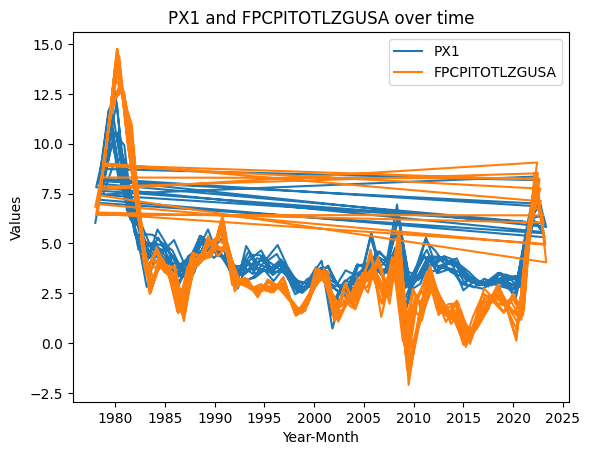

In [36]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
data = pd.read_csv('merged2.csv')

# Convert 'YYYYMM' to datetime format for better plotting
data['YYYYMM'] = pd.to_datetime(data['YYYYMM'], format='%Y%m')

# Set the figure and axes
fig, ax = plt.subplots()

# Plot 'PX1'
ax.plot(data['YYYYMM'], data['PX1'], label='PX1')

# Plot 'FPCPITOTLZGUSA'
ax.plot(data['YYYYMM'], data['FPCPITOTLZGUSA'], label='FPCPITOTLZGUSA')

# Set labels and title
ax.set_xlabel('Year-Month')
ax.set_ylabel('Values')
ax.set_title('PX1 and FPCPITOTLZGUSA over time')

# Add a legend
ax.legend()

# Display the plot
plt.show()


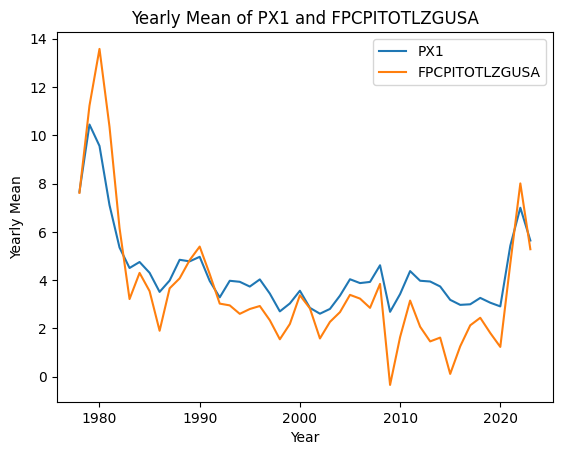

In [37]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data
data = pd.read_csv('merged2.csv')

# Convert 'YYYYMM' to datetime format
data['YYYYMM'] = pd.to_datetime(data['YYYYMM'], format='%Y%m')

# Extract year from 'YYYYMM' and store it in a new column
data['Year'] = data['YYYYMM'].dt.year

# Compute yearly mean of 'PX1' and 'FPCPITOTLZGUSA'
yearly_data = data.groupby('Year').mean().reset_index()

# Set the figure and axes
fig, ax = plt.subplots()

# Plot yearly mean of 'PX1'
ax.plot(yearly_data['Year'], yearly_data['PX1'], label='PX1')

# Plot yearly mean of 'FPCPITOTLZGUSA'
ax.plot(yearly_data['Year'], yearly_data['FPCPITOTLZGUSA'], label='FPCPITOTLZGUSA')

# Set labels and title
ax.set_xlabel('Year')
ax.set_ylabel('Yearly Mean')
ax.set_title('Yearly Mean of PX1 and FPCPITOTLZGUSA')

# Add a legend
ax.legend()

# Display the plot
plt.show()


In [2]:
import pandas as pd
import statsmodels.api as sm

# Load data
data = pd.read_csv('merged2.csv')

# Rename columns
data = data.rename(columns={'PX1': 'PredictedInflation', 'FPCPITOTLZGUSA': 'ActualInflation'})

# Convert 'YYYYMM' to datetime format and extract year
data['Year'] = pd.to_datetime(data['YYYYMM'], format='%Y%m').dt.year

# Exclude the first entry of the actual inflation data and the last entry of the predicted inflation data
data_regression = data[1:-1][['Year', 'PredictedInflation', 'ActualInflation']]

# Save the dataframe to a new CSV file
data_regression.to_csv('new_merged.csv', index=False)

# Add a constant to the dataframe for regression
data_regression = sm.add_constant(data_regression)

# Perform linear regression
model = sm.OLS(data_regression['ActualInflation'], data_regression[['const', 'PredictedInflation']])
results = model.fit()

# Print the summary of the regression
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:        ActualInflation   R-squared:                       0.810
Model:                            OLS   Adj. R-squared:                  0.810
Method:                 Least Squares   F-statistic:                     2310.
Date:                Sun, 09 Jul 2023   Prob (F-statistic):          2.20e-197
Time:                        16:21:03   Log-Likelihood:                -879.61
No. Observations:                 543   AIC:                             1763.
Df Residuals:                     541   BIC:                             1772.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -2.5537      0

In [3]:
import pandas as pd

# Load data
data = pd.read_csv('merged2.csv')

# Rename columns
data = data.rename(columns={'PX1': 'PredictedInflation', 'FPCPITOTLZGUSA': 'ActualInflation'})

# Convert 'YYYYMM' to datetime format and extract year
data['Year'] = pd.to_datetime(data['YYYYMM'], format='%Y%m').dt.year

# Shift the 'PredictedInflation' column by one year forward
data['PredictedInflation'] = data['PredictedInflation'].shift(-1)

# Exclude the last year of 'PredictedInflation' and the first year of 'ActualInflation'
data = data[(data['Year'] >= 1979) & (data['Year'] < 2023)]

# Save the dataframe to a new CSV file
data[['Year', 'PredictedInflation', 'ActualInflation']].to_csv('new_merged2.csv', index=False)


In [4]:
import pandas as pd

# Load data
data = pd.read_csv('merged2.csv')

# Rename columns
data = data.rename(columns={'PX1': 'PredictedInflation', 'FPCPITOTLZGUSA': 'ActualInflation'})

# Convert 'YYYYMM' to datetime format and extract year and month
data['Year'] = pd.to_datetime(data['YYYYMM'], format='%Y%m').dt.year
data['Month'] = pd.to_datetime(data['YYYYMM'], format='%Y%m').dt.month

# Add 1 to the 'Year' for 'PredictedInflation'
data['Year'] = data['Year'] + 1

# Restrict data to the desired range
data = data[(data['Year'] >= 1979) & (data['Year'] <= 2023)]

# Reconstruct 'YYYYMM' from 'Year' and 'Month'
data['YYYYMM'] = data['Year']*100 + data['Month']

# Save the 'PredictedInflation' and 'YYYYMM' to a new CSV file
data[['YYYYMM', 'PredictedInflation']].to_csv('new_predicted.csv', index=False)


In [6]:
import pandas as pd

# Load the new predicted data
data = pd.read_csv('new_predicted.csv')

# Filter out the rows where 'YYYYMM' is greater than 202305
data = data[data['YYYYMM'] <= 202305]

# Save the filtered data to a new CSV file
data.to_csv('filtered_new_predicted.csv', index=False)


In [7]:
# Load the data from the two CSV files
data_merged2 = pd.read_csv('merged2.csv')
data_filtered_predicted = pd.read_csv('filtered_new_predicted.csv')

# Rename the columns for clarity
data_merged2 = data_merged2.rename(columns={"YYYYMM": "Date", "PX1": "PredictedInflation", "FPCPITOTLZGUSA": "ActualInflation"})

# Merge the two dataframes on 'YYYYMM'/'Date'
merged_data = pd.merge(data_filtered_predicted, data_merged2, how='inner', left_on='YYYYMM', right_on='Date')

# Keep only the required columns
merged_data = merged_data[['YYYYMM', 'PredictedInflation', 'ActualInflation']]

# Save the merged data to a new CSV file
merged_data.to_csv('final_merged.csv', index=False)


KeyError: "['PredictedInflation'] not in index"

In [8]:
print(data_filtered_predicted.head())
print(data_merged2.head())


   YYYYMM  PredictedInflation
0  197901                6.03
1  198001                8.91
2  198101               12.66
3  198201                8.12
4  198301                5.43
     Date  PredictedInflation  ActualInflation
0  197801                6.03             6.84
1  197901                8.91             9.28
2  198001               12.66            13.91
3  198101                8.12            11.83
4  198201                5.43             8.39


In [9]:
# Read the data from the CSV files
data_filtered_predicted = pd.read_csv('filtered_new_predicted.csv')
data_merged2 = pd.read_csv('merged2.csv')

# Rename the columns to match the ones in the other DataFrame
data_filtered_predicted.columns = ['YYYYMM', 'PredictedInflation']
data_merged2.columns = ['Date', 'PX1', 'ActualInflation']

# Convert the 'Date' column in data_merged2 to match the format of 'YYYYMM'
data_merged2['Date'] = data_merged2['Date'].apply(lambda x: str(x)[:4] + str(x)[5:])

# Merge the data on the 'YYYYMM'/'Date' column
merged_data = pd.merge(data_filtered_predicted, data_merged2, how='inner', left_on='YYYYMM', right_on='Date')

# Keep only the required columns
merged_data = merged_data[['YYYYMM', 'PredictedInflation', 'ActualInflation']]

# Save the merged data to a new CSV file
merged_data.to_csv('final_merged.csv', index=False)


ValueError: You are trying to merge on int64 and object columns. If you wish to proceed you should use pd.concat

In [10]:
# Read the data from the CSV files
data_filtered_predicted = pd.read_csv('filtered_new_predicted.csv')
data_merged2 = pd.read_csv('merged2.csv')

# Rename the columns to match the ones in the other DataFrame
data_filtered_predicted.columns = ['YYYYMM', 'PredictedInflation']
data_merged2.columns = ['Date', 'PX1', 'ActualInflation']

# Convert the 'Date' and 'YYYYMM' columns to string
data_filtered_predicted['YYYYMM'] = data_filtered_predicted['YYYYMM'].astype(str)
data_merged2['Date'] = data_merged2['Date'].astype(str)

# Merge the data on the 'YYYYMM'/'Date' column
merged_data = pd.merge(data_filtered_predicted, data_merged2, how='inner', left_on='YYYYMM', right_on='Date')

# Keep only the required columns
merged_data = merged_data[['YYYYMM', 'PredictedInflation', 'ActualInflation']]

# Save the merged data to a new CSV file
merged_data.to_csv('final_merged.csv', index=False)


In [11]:
import statsmodels.api as sm
import numpy as np
from scipy import stats

# Read the data
data = pd.read_csv('final_merged.csv')

# Set up the regression model: PredictedInflation = constant + ActualInflation
X = data['ActualInflation']
y = data['PredictedInflation']

# Add a constant to the X matrix for the regression intercept
X = sm.add_constant(X)

# Fit the OLS model
model = sm.OLS(y, X)
results = model.fit()

# Print the results
print(results.summary())

# Perform unbiasedness test: are the means of the predicted and actual inflation rates equal?
t_stat, p_val = stats.ttest_ind(data['PredictedInflation'], data['ActualInflation'])
print("\nUnbiasedness Test Results:")
print("T-statistic:", t_stat)
print("P-value:", p_val)

# Output only the required results
print("\nRequired Results:")
print("Constant Error (Standard Error of Intercept):", results.bse.const)
print("Constant Value (Intercept):", results.params.const)
print("P-value of the Intercept:", results.pvalues.const)


                            OLS Regression Results                            
Dep. Variable:     PredictedInflation   R-squared:                       0.581
Model:                            OLS   Adj. R-squared:                  0.580
Method:                 Least Squares   F-statistic:                     735.2
Date:                Sun, 09 Jul 2023   Prob (F-statistic):          2.86e-102
Time:                        16:44:43   Log-Likelihood:                -820.82
No. Observations:                 533   AIC:                             1646.
Df Residuals:                     531   BIC:                             1654.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               2.5536      0.079     

In [8]:
import statsmodels.api as sm
import numpy as np
from scipy import stats

# Read the data
data = pd.read_csv('final_merged.csv')

# Set up the regression model: PredictedInflation = constant + ActualInflation
X = data['ActualInflation']
y = data['PredictedInflation']

# Add a constant to the X matrix for the regression intercept
X = sm.add_constant(X)

# Fit the OLS model
model = sm.OLS(y, X)
results = model.fit()

# Get the p-value, coefficients, and standard errors
p_value = results.pvalues.const
coef = results.params.const
std_err = results.bse.const

# Assign significance levels
significance_level = ''
if p_value < 0.01:
    significance_level = '**'
elif p_value < 0.05:
    significance_level = '*'

print("Panel A: Testing for Bias:")
print(f"const: Mean Error {coef:.2f}%{significance_level}")




Panel A: Testing for Bias:
const: Mean Error 2.55%**
(Constant only) (0.08)


In [10]:
import statsmodels.api as sm
import numpy as np
from scipy.stats import ttest_1samp

# Read the data
data = pd.read_csv('final_merged.csv')

# Set up the regression model: PredictedInflation = constant + ActualInflation
X = data['ActualInflation']
y = data['PredictedInflation']

# Add a constant to the X matrix for the regression intercept
X = sm.add_constant(X)

# Fit the OLS model
model = sm.OLS(y, X)
results = model.fit()

# Get the predictions
y_pred = results.predict(X)

# Calculate mean error


# Perform a t-test against zero for the mean error
t_stat, p_val = ttest_1samp(y - y_pred, 0)

# Assign significance levels
significance_level = ''
if p_val < 0.01:
    significance_level = '**'
elif p_val < 0.05:
    significance_level = '*'

# Get the coefficient and standard error of the constant
const_value = results.params.const
std_err = results.bse.const
coef = results.params.const


print("Panel A: Testing for Bias:")
print(f"α: std Error: {std_err * 100:.2f}%{significance_level}")
print(f"(Constant only) ({coef:.2f})")

Panel A: Testing for Bias:
α: std Error: 7.93%
(Constant only) (2.55)


In [15]:
import pandas as pd

# Load the data
data_merged2 = pd.read_csv('merged2.csv')

# Filter rows based on the condition for 'YYYYMM'
data_filtered = data_merged2[(data_merged2['YYYYMM'] >= 197802) & (data_merged2['YYYYMM'] <= 202305)]

# Keep only 'PX1' column and rename it to 'PredictedInflation'
data_filtered = data_filtered['PX1'].rename('y')

# Save the filtered data to a new CSV file
data_filtered.to_csv('y.csv', index=False)


In [14]:
import pandas as pd

# Load the data
data_merged2 = pd.read_csv('merged2.csv')

# Filter rows based on the condition for 'YYYYMM'
data_filtered = data_merged2[(data_merged2['YYYYMM'] >= 197801) & (data_merged2['YYYYMM'] <= 202304)]

# Keep only 'PX1' column and rename it to 'PredictedInflation'
data_filtered = data_filtered['PX1'].rename('x2')

# Save the filtered data to a new CSV file
data_filtered.to_csv('x2.csv', index=False)


In [21]:
import pandas as pd

# Load the data
data_merged2 = pd.read_csv('merged2.csv')

# Filter rows based on the condition for 'YYYYMM'
data_filtered = data_merged2[(data_merged2['YYYYMM'] >= 197801) & (data_merged2['YYYYMM'] <= 202304)]

data_filtered = data_filtered[['YYYYMM', 'FPCPITOTLZGUSA']]

# Keep only 'PX1' column and rename it to 'PredictedInflation'

data_filtered = data_filtered.rename(columns={'FPCPITOTLZGUSA': 'x1'})
# Save the filtered data to a new CSV file
data_filtered.to_csv('x1.csv', index=False)


In [17]:
import pandas as pd

# Load the data
data_y = pd.read_csv('y.csv')
data_x1 = pd.read_csv('x1.csv')
data_x2 = pd.read_csv('x2.csv')

# Concatenate the dataframes together
data = pd.concat([data_y, data_x1, data_x2], axis=1)

# Save the combined data to a new CSV file
data.to_csv('combined.csv', index=False)


In [20]:
import pandas as pd

# Load the data
data_merged2 = pd.read_csv('merged2.csv')

# Filter rows based on the condition for 'YYYYMM'
data_filtered = data_merged2[(data_merged2['YYYYMM'] >= 197802) & (data_merged2['YYYYMM'] <= 202305)]

# Keep only 'YYYYMM' and 'PX1' columns
data_filtered = data_filtered[['YYYYMM', 'PX1']]

# Rename 'PX1' to 'PredictedInflation'
data_filtered = data_filtered.rename(columns={'PX1': 'y'})

# Save the filtered data to a new CSV file
data_filtered.to_csv('y.csv', index=False)


In [22]:
import pandas as pd

# Load the data
data_merged2 = pd.read_csv('merged2.csv')

# Filter rows based on the condition for 'YYYYMM'
data_filtered = data_merged2[(data_merged2['YYYYMM'] >= 197801) & (data_merged2['YYYYMM'] <= 202304)]

# Keep only 'YYYYMM' and 'PX1' columns
data_filtered = data_filtered[['YYYYMM', 'PX1']]

# Rename 'PX1' to 'PredictedInflation'
data_filtered = data_filtered.rename(columns={'PX1': 'x2'})

# Save the filtered data to a new CSV file
data_filtered.to_csv('x2.csv', index=False)


In [23]:
import pandas as pd

def sort_csv(filename):
    # Load the data
    df = pd.read_csv(filename)

    # Convert 'YYYYMM' to datetime
    df['YYYYMM'] = pd.to_datetime(df['YYYYMM'], format='%Y%m')

    # Sort by 'YYYYMM'
    df = df.sort_values('YYYYMM')

    # If you want to convert 'YYYYMM' back to string in 'YYYYMM' format
    df['YYYYMM'] = df['YYYYMM'].dt.strftime('%Y%m')
    
    # Save the sorted DataFrame back to the CSV
    df.to_csv(filename, index=False)

# Call the function for each of your files
sort_csv('y.csv')
sort_csv('x1.csv')
sort_csv('x2.csv')


In [25]:
import pandas as pd

# read the data from the csv files
y = pd.read_csv('y.csv')
x1 = pd.read_csv('x1.csv')
x2 = pd.read_csv('x2.csv')

# Concatenate along the column axis
result = pd.concat([x1['date'], y['y'], x1['x1'], x2['x2']], axis=1)

# Write the combined data to a csv file
result.to_csv('combined.csv', index=False)


In [26]:
import pandas as pd
import statsmodels.api as sm

# Load the data
data = pd.read_csv('combined.csv')

# Define the dependent variable
y = data['y']

# Define the independent variables
X = data[['x1', 'x2']]

# Add a constant to the independent variables matrix for the intercept term
X = sm.add_constant(X)

# Create an OLS model
model = sm.OLS(y, X)

# Fit the model
results = model.fit()

# Print the results
print(results.summary())


                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.908
Model:                            OLS   Adj. R-squared:                  0.908
Method:                 Least Squares   F-statistic:                     2684.
Date:                Sun, 09 Jul 2023   Prob (F-statistic):          1.43e-281
Time:                        17:22:48   Log-Likelihood:                -428.79
No. Observations:                 544   AIC:                             863.6
Df Residuals:                     541   BIC:                             876.5
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4246      0.077      5.509      0.0

In [11]:
import pandas as pd
import statsmodels.api as sm
import numpy as np
from sklearn.metrics import mean_squared_error

# Load the data
data = pd.read_csv('combined.csv')

# Define the dependent variable
y = data['y']

# Define the independent variables
X = data[['x1', 'x2']]

# Add a constant to the independent variables matrix for the intercept term
X = sm.add_constant(X)

# Create an OLS model
model = sm.OLS(y, X)

# Fit the model
results = model.fit()

# Get the predicted values
predictions = results.predict(X)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y, predictions))

# Get the standard errors
std_errors = results.bse

# Print the desired values
variables = ['const', 'x1', 'x2']

for var in variables:
    # Get the p-value for the variable
    p_val = results.pvalues[var]
    
    # Assign significance levels
    significance_level = ''
    if p_val < 0.01:
        significance_level = '**'
    elif p_val < 0.05:
        significance_level = '*'
    
    print(f"{var}: std Error {std_errors[var]:.2f}{significance_level}")
    print(f"(Constant only) ({results.params[var]:.2f})")

print(f"Adj. R2 {results.rsquared_adj:.3f}")
print(f"R2 {results.rsquared:.3f}")
print(f"RMSE (rmse={rmse:.3f})")


const: std Error 0.08**
(Constant only) (0.42)
x1: std Error 0.02**
(Constant only) (0.08)
x2: std Error 0.03**
(Constant only) (0.83)
Adj. R2 0.908
R2 0.908
RMSE (rmse=0.532)


In [27]:
from statsmodels.stats.diagnostic import het_breuschpagan
from scipy.stats import shapiro

# Rationality Test: Check for Normality of Residuals
_, p_value_normality = shapiro(results.resid)
print(f"P-value for normality of residuals: {p_value_normality}")

# Efficiency Test: Check for Homoscedasticity (Constant Variance of Residuals)
_, p_value_homoscedasticity, _, _ = het_breuschpagan(results.resid, results.model.exog)
print(f"P-value for homoscedasticity of residuals: {p_value_homoscedasticity}")


P-value for normality of residuals: 2.4042077465154243e-13
P-value for homoscedasticity of residuals: 6.684354628691575e-26


In [31]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.regression.linear_model import RegressionResults

# Load the data
data = pd.read_csv('combined.csv')

# Window size
window_size = 400

# Number of models
num_models = len(data) - window_size + 1

# Create a list to store the models
models = []

# Create a list to store the results
results = []

# Create the models
for i in range(num_models):
    # Define the dependent variable
    y = data['y'].iloc[i : i + window_size]

    # Define the independent variables
    X = data[['x1', 'x2']].iloc[i : i + window_size]

    # Add a constant to the independent variables matrix for the intercept term
    X = sm.add_constant(X)

    # Create an OLS model
    model = sm.OLS(y, X)

    # Fit the model
    result = model.fit()

    # Store the model and the results
    models.append(model)
    results.append(result)
    print(results[i].summary())
    print(i)



# Now, you have a list of models and results for each window of data.
# For instance, to see the summary of the first model, you can use:



                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.907
Model:                            OLS   Adj. R-squared:                  0.906
Method:                 Least Squares   F-statistic:                     1926.
Date:                Sun, 09 Jul 2023   Prob (F-statistic):          4.52e-205
Time:                        17:32:34   Log-Likelihood:                -347.07
No. Observations:                 400   AIC:                             700.1
Df Residuals:                     397   BIC:                             712.1
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4154      0.090      4.634      0.0

In [5]:
    import pandas as pd
    import statsmodels.api as sm
    from statsmodels.regression.linear_model import RegressionResults
    data = pd.read_csv('combined.csv')

    # Window size
    window_size = 240

    # Number of models
    num_models = len(data) - window_size + 1

    # Create a list to store the models
    models = []

    # Create a list to store the results
    results = []

    # Create the models
    for i in range(num_models):
        # Define the dependent variable
        y = data['y'].iloc[i : i + window_size]

        # Define the independent variables
        X = data[['x1', 'x2']].iloc[i : i + window_size]

        # Add a constant to the independent variables matrix for the intercept term
        X = sm.add_constant(X)

        # Create an OLS model
        model = sm.OLS(y, X)

        # Fit the model
        result = model.fit()

        # Store the model and the results
        models.append(model)
        results.append(result)
        print(results[i].summary())
        print(i)



    # Now, you have a list of models and results for each window of data.
    # For instance, to see the summary of the first model, you can use:



                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.905
Model:                            OLS   Adj. R-squared:                  0.904
Method:                 Least Squares   F-statistic:                     1132.
Date:                Tue, 11 Jul 2023   Prob (F-statistic):          5.44e-122
Time:                        19:14:00   Log-Likelihood:                -230.80
No. Observations:                 240   AIC:                             467.6
Df Residuals:                     237   BIC:                             478.0
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.4685      0.130      3.601      0.0

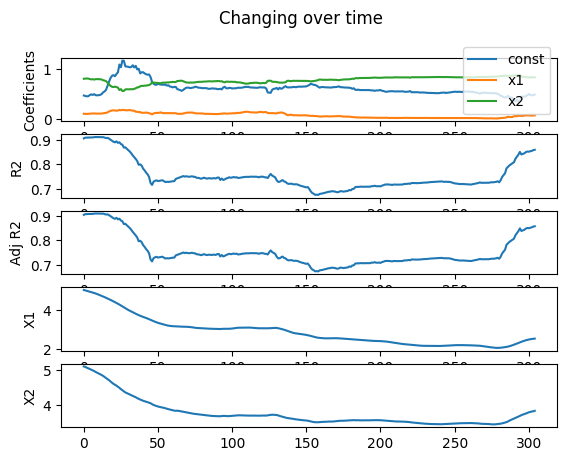

In [6]:
import pandas as pd
import statsmodels.api as sm
import numpy as np
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

data = pd.read_csv('combined.csv')

# Window size
window_size = 240

# Number of models
num_models = len(data) - window_size + 1

# Create a list to store the models
models = []
results = []
rmse_values = []
coef_values = []
r2_values = []
adj_r2_values = []
x1_values = []
x2_values = []

# Create the models
for i in range(num_models):
    # Define the dependent variable
    y = data['y'].iloc[i : i + window_size]

    # Define the independent variables
    X = data[['x1', 'x2']].iloc[i : i + window_size]

    # Add a constant to the independent variables matrix for the intercept term
    X = sm.add_constant(X)

    # Create an OLS model
    model = sm.OLS(y, X)

    # Fit the model
    result = model.fit()

    # Calculate RMSE
    predictions = result.predict(X)
    rmse = np.sqrt(mean_squared_error(y, predictions))
    rmse_values.append(rmse)
    
    # Collect model statistics
    coef_values.append(result.params)
    r2_values.append(result.rsquared)
    adj_r2_values.append(result.rsquared_adj)
    x1_values.append(data['x1'].iloc[i : i + window_size].mean())
    x2_values.append(data['x2'].iloc[i : i + window_size].mean())

    # Store the model and the results
    models.append(model)
    results.append(result)

# Create plots
fig, axs = plt.subplots(5)
fig.suptitle('Changing over time')

# Coefficient plot
coef_values = np.array(coef_values)
axs[0].plot(coef_values[:,0], label='const')
axs[0].plot(coef_values[:,1], label='x1')
axs[0].plot(coef_values[:,2], label='x2')
axs[0].set_ylabel('Coefficients')
axs[0].legend()

# R2 plot
axs[1].plot(r2_values)
axs[1].set_ylabel('R2')

# Adjusted R2 plot
axs[2].plot(adj_r2_values)
axs[2].set_ylabel('Adj R2')

# X1 plot
axs[3].plot(x1_values)
axs[3].set_ylabel('X1')

# X2 plot
axs[4].plot(x2_values)
axs[4].set_ylabel('X2')

plt.show()


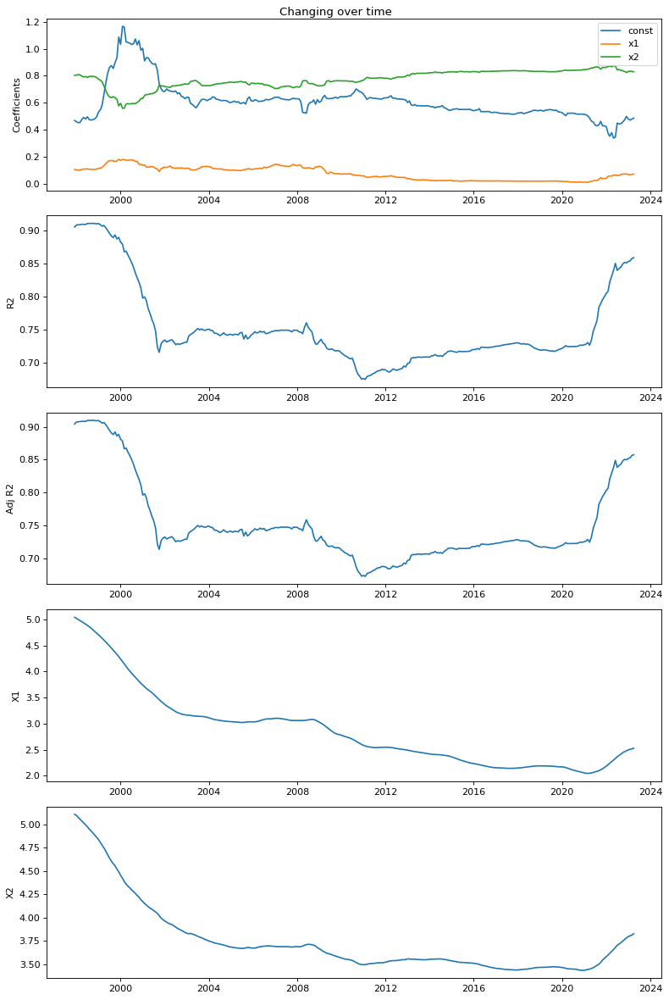

In [13]:
import pandas as pd
import statsmodels.api as sm
import numpy as np
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

data = pd.read_csv('combined.csv')

# Convert date to datetime and set as index
data['date'] = pd.to_datetime(data['date'], format='%Y%m')
data.set_index('date', inplace=True)

# Window size
window_size = 240

# Number of models
num_models = len(data) - window_size + 1

# Create a list to store the models
models = []
results = []
rmse_values = []
coef_values = []
r2_values = []
adj_r2_values = []
x1_values = []
x2_values = []

# Create the models
for i in range(num_models):
    # Define the dependent variable
    y = data['y'].iloc[i : i + window_size]

    # Define the independent variables
    X = data[['x1', 'x2']].iloc[i : i + window_size]

    # Add a constant to the independent variables matrix for the intercept term
    X = sm.add_constant(X)

    # Create an OLS model
    model = sm.OLS(y, X)

    # Fit the model
    result = model.fit()

    # Calculate RMSE
    predictions = result.predict(X)
    rmse = np.sqrt(mean_squared_error(y, predictions))
    rmse_values.append(rmse)
    
    # Collect model statistics
    coef_values.append(result.params)
    r2_values.append(result.rsquared)
    adj_r2_values.append(result.rsquared_adj)
    x1_values.append(data['x1'].iloc[i : i + window_size].mean())
    x2_values.append(data['x2'].iloc[i : i + window_size].mean())

    # Store the model and the results
    models.append(model)
    results.append(result)

# Define years for x-axis
years = data.index[window_size - 1 :]

# Create plots
fig, axs = plt.subplots(5, figsize=(10, 15), dpi=80)
fig.suptitle('Changing over time')

# Coefficient plot
coef_values = np.array(coef_values)
axs[0].plot(years, coef_values[:,0], label='const')
axs[0].plot(years, coef_values[:,1], label='x1')
axs[0].plot(years, coef_values[:,2], label='x2')
axs[0].set_ylabel('Coefficients')
axs[0].legend()

# R2 plot
axs[1].plot(years, r2_values)
axs[1].set_ylabel('R2')

# Adjusted R2 plot
axs[2].plot(years, adj_r2_values)
axs[2].set_ylabel('Adj R2')

# X1 plot
axs[3].plot(years, x1_values)
axs[3].set_ylabel('X1')

# X2 plot
axs[4].plot(years, x2_values)
axs[4].set_ylabel('X2')

plt.tight_layout()
plt.show()


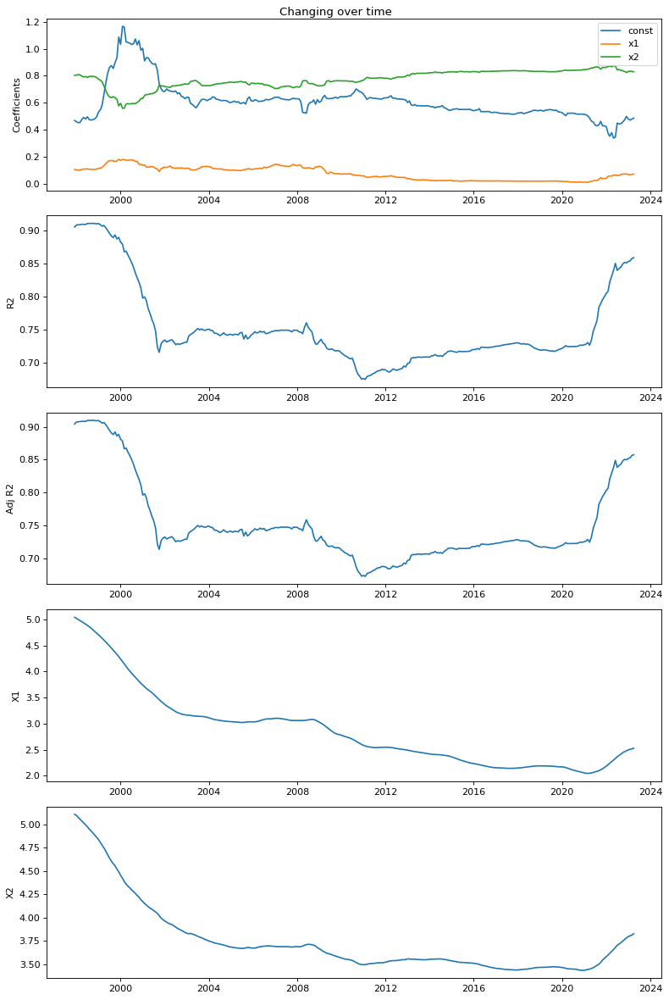

<Figure size 640x480 with 0 Axes>

In [16]:
import matplotlib.ticker as ticker
import pandas as pd
import statsmodels.api as sm
import numpy as np
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

data = pd.read_csv('combined.csv')

# Convert date to datetime and set as index
data['date'] = pd.to_datetime(data['date'], format='%Y%m')
data.set_index('date', inplace=True)

# Window size
window_size = 240

# Number of models
num_models = len(data) - window_size + 1

# Create a list to store the models
models = []
results = []
rmse_values = []
coef_values = []
r2_values = []
adj_r2_values = []
x1_values = []
x2_values = []

# Create the models
for i in range(num_models):
    # Define the dependent variable
    y = data['y'].iloc[i : i + window_size]

    # Define the independent variables
    X = data[['x1', 'x2']].iloc[i : i + window_size]

    # Add a constant to the independent variables matrix for the intercept term
    X = sm.add_constant(X)

    # Create an OLS model
    model = sm.OLS(y, X)

    # Fit the model
    result = model.fit()

    # Calculate RMSE
    predictions = result.predict(X)
    rmse = np.sqrt(mean_squared_error(y, predictions))
    rmse_values.append(rmse)
    
    # Collect model statistics
    coef_values.append(result.params)
    r2_values.append(result.rsquared)
    adj_r2_values.append(result.rsquared_adj)
    x1_values.append(data['x1'].iloc[i : i + window_size].mean())
    x2_values.append(data['x2'].iloc[i : i + window_size].mean())

    # Store the model and the results
    models.append(model)
    results.append(result)

# Define years for x-axis
years = data.index[window_size - 1 :]

# Create plots
fig, axs = plt.subplots(5, figsize=(10, 15), dpi=80)
fig.suptitle('Changing over time')

# Coefficient plot
coef_values = np.array(coef_values)
axs[0].plot(years, coef_values[:,0], label='const')
axs[0].plot(years, coef_values[:,1], label='x1')
axs[0].plot(years, coef_values[:,2], label='x2')
axs[0].set_ylabel('Coefficients')
axs[0].legend()

# R2 plot
axs[1].plot(years, r2_values)
axs[1].set_ylabel('R2')

# Adjusted R2 plot
axs[2].plot(years, adj_r2_values)
axs[2].set_ylabel('Adj R2')

# X1 plot
axs[3].plot(years, x1_values)
axs[3].set_ylabel('X1')

# X2 plot
axs[4].plot(years, x2_values)
axs[4].set_ylabel('X2')

plt.tight_layout()
plt.show()

# Define the tick locations
tick_locations = np.linspace(0, num_models-1, 5).astype(int)

# Create list of labels
labels = [f'{data.index[i].strftime("%Y%m")}-{data.index[i+window_size-1].strftime("%Y%m")}' for i in tick_locations]



# Adjust x-axis
for ax in axs:
    ax.set_xticks(tick_locations)
    ax.set_xticklabels(labels, rotation=45)

plt.tight_layout()
plt.show()


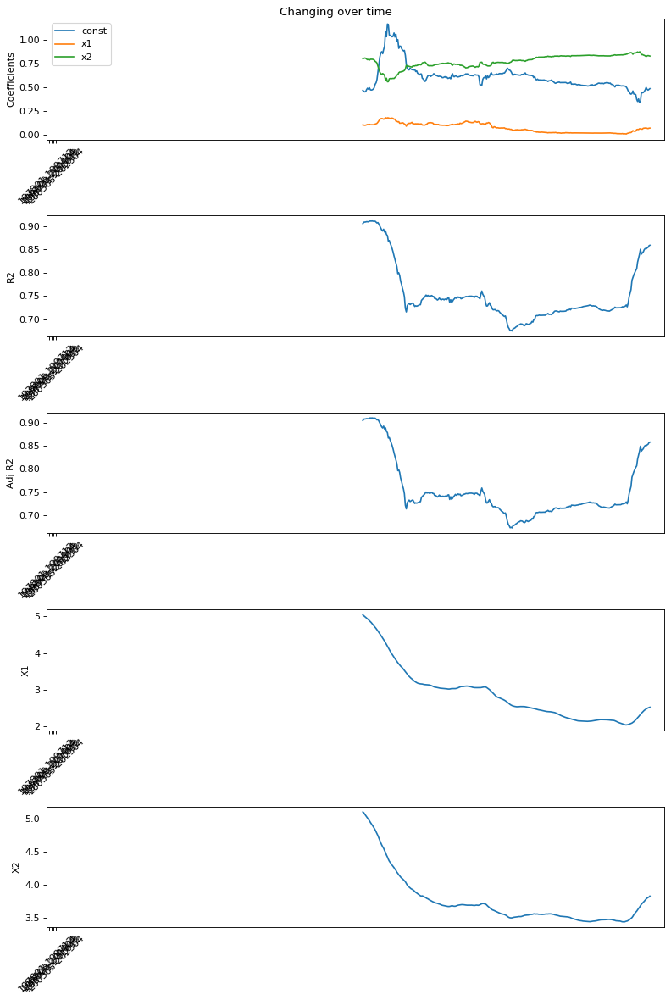

In [17]:
import matplotlib.ticker as ticker
import pandas as pd
import statsmodels.api as sm
import numpy as np
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

data = pd.read_csv('combined.csv')

# Convert date to datetime and set as index
data['date'] = pd.to_datetime(data['date'], format='%Y%m')
data.set_index('date', inplace=True)

# Window size
window_size = 240

# Number of models
num_models = len(data) - window_size + 1

# Create a list to store the models
models = []
results = []
rmse_values = []
coef_values = []
r2_values = []
adj_r2_values = []
x1_values = []
x2_values = []

# Create the models
for i in range(num_models):
    # Define the dependent variable
    y = data['y'].iloc[i : i + window_size]

    # Define the independent variables
    X = data[['x1', 'x2']].iloc[i : i + window_size]

    # Add a constant to the independent variables matrix for the intercept term
    X = sm.add_constant(X)

    # Create an OLS model
    model = sm.OLS(y, X)

    # Fit the model
    result = model.fit()

    # Calculate RMSE
    predictions = result.predict(X)
    rmse = np.sqrt(mean_squared_error(y, predictions))
    rmse_values.append(rmse)
    
    # Collect model statistics
    coef_values.append(result.params)
    r2_values.append(result.rsquared)
    adj_r2_values.append(result.rsquared_adj)
    x1_values.append(data['x1'].iloc[i : i + window_size].mean())
    x2_values.append(data['x2'].iloc[i : i + window_size].mean())

    # Store the model and the results
    models.append(model)
    results.append(result)

# Define years for x-axis
years = data.index[window_size - 1 :]

# Create plots
fig, axs = plt.subplots(5, figsize=(10, 15), dpi=80)
fig.suptitle('Changing over time')

# Coefficient plot
coef_values = np.array(coef_values)
axs[0].plot(years, coef_values[:,0], label='const')
axs[0].plot(years, coef_values[:,1], label='x1')
axs[0].plot(years, coef_values[:,2], label='x2')
axs[0].set_ylabel('Coefficients')
axs[0].legend()

# R2 plot
axs[1].plot(years, r2_values)
axs[1].set_ylabel('R2')

# Adjusted R2 plot
axs[2].plot(years, adj_r2_values)
axs[2].set_ylabel('Adj R2')

# X1 plot
axs[3].plot(years, x1_values)
axs[3].set_ylabel('X1')

# X2 plot
axs[4].plot(years, x2_values)
axs[4].set_ylabel('X2')

# Define the tick locations
tick_locations = np.linspace(0, num_models-1, 5).astype(int)

# Create list of labels
labels = [f'{data.index[i].strftime("%Y%m")}-{data.index[i+window_size-1].strftime("%Y%m")}' for i in tick_locations]

# Adjust x-axis
for ax in axs:
    ax.set_xticks(tick_locations)
    ax.set_xticklabels(labels, rotation=45)

plt.tight_layout()
plt.show()


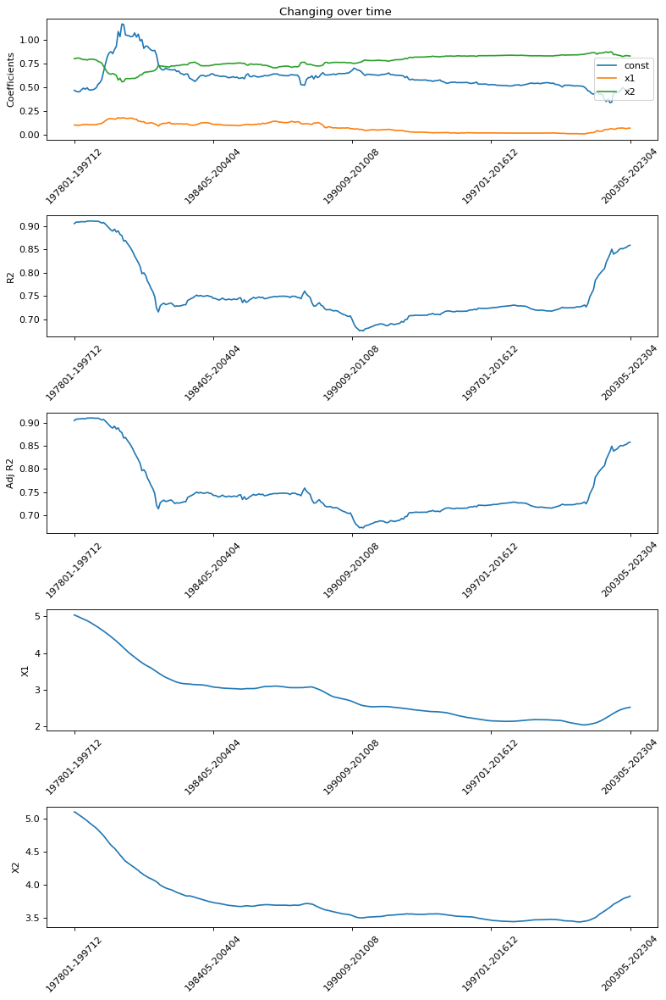

In [18]:
import matplotlib.ticker as ticker
import pandas as pd
import statsmodels.api as sm
import numpy as np
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

data = pd.read_csv('combined.csv')

# Convert date to datetime and set as index
data['date'] = pd.to_datetime(data['date'], format='%Y%m')
data.set_index('date', inplace=True)

# Window size
window_size = 240

# Number of models
num_models = len(data) - window_size + 1

# Create a list to store the models
models = []
results = []
rmse_values = []
coef_values = []
r2_values = []
adj_r2_values = []
x1_values = []
x2_values = []

# Create the models
for i in range(num_models):
    # Define the dependent variable
    y = data['y'].iloc[i : i + window_size]

    # Define the independent variables
    X = data[['x1', 'x2']].iloc[i : i + window_size]

    # Add a constant to the independent variables matrix for the intercept term
    X = sm.add_constant(X)

    # Create an OLS model
    model = sm.OLS(y, X)

    # Fit the model
    result = model.fit()

    # Calculate RMSE
    predictions = result.predict(X)
    rmse = np.sqrt(mean_squared_error(y, predictions))
    rmse_values.append(rmse)
    
    # Collect model statistics
    coef_values.append(result.params)
    r2_values.append(result.rsquared)
    adj_r2_values.append(result.rsquared_adj)
    x1_values.append(data['x1'].iloc[i : i + window_size].mean())
    x2_values.append(data['x2'].iloc[i : i + window_size].mean())

    # Store the model and the results
    models.append(model)
    results.append(result)

# Create plots
fig, axs = plt.subplots(5, figsize=(10, 15), dpi=80)
fig.suptitle('Changing over time')

# Coefficient plot
coef_values = np.array(coef_values)
axs[0].plot(coef_values[:,0], label='const')
axs[0].plot(coef_values[:,1], label='x1')
axs[0].plot(coef_values[:,2], label='x2')
axs[0].set_ylabel('Coefficients')
axs[0].legend()

# R2 plot
axs[1].plot(r2_values)
axs[1].set_ylabel('R2')

# Adjusted R2 plot
axs[2].plot(adj_r2_values)
axs[2].set_ylabel('Adj R2')

# X1 plot
axs[3].plot(x1_values)
axs[3].set_ylabel('X1')

# X2 plot
axs[4].plot(x2_values)
axs[4].set_ylabel('X2')

# Define the tick locations
tick_locations = np.linspace(0, num_models-1, 5).astype(int)

# Create list of labels
labels = [f'{data.index[i].strftime("%Y%m")}-{data.index[i+window_size-1].strftime("%Y%m")}' for i in tick_locations]

# Adjust x-axis
for ax in axs:
    ax.set_xticks(tick_locations)
    ax.set_xticklabels(labels, rotation=45)

plt.tight_layout()
plt.show()


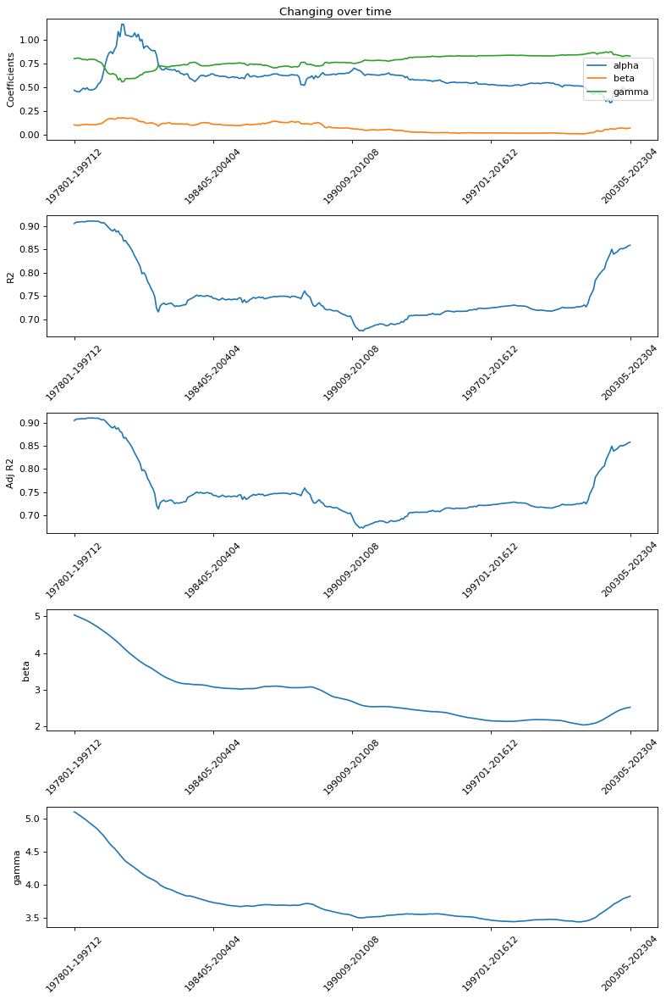

In [1]:
import matplotlib.ticker as ticker
import pandas as pd
import statsmodels.api as sm
import numpy as np
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

data = pd.read_csv('combined.csv')

# Convert date to datetime and set as index
data['date'] = pd.to_datetime(data['date'], format='%Y%m')
data.set_index('date', inplace=True)

# Window size
window_size = 240

# Number of models
num_models = len(data) - window_size + 1

# Create a list to store the models
models = []
results = []
rmse_values = []
coef_values = []
r2_values = []
adj_r2_values = []
x1_values = []
x2_values = []

# Create the models
for i in range(num_models):
    # Define the dependent variable
    y = data['y'].iloc[i : i + window_size]

    # Define the independent variables
    X = data[['x1', 'x2']].iloc[i : i + window_size]

    # Add a constant to the independent variables matrix for the intercept term
    X = sm.add_constant(X)

    # Create an OLS model
    model = sm.OLS(y, X)

    # Fit the model
    result = model.fit()

    # Calculate RMSE
    predictions = result.predict(X)
    rmse = np.sqrt(mean_squared_error(y, predictions))
    rmse_values.append(rmse)
    
    # Collect model statistics
    coef_values.append(result.params)
    r2_values.append(result.rsquared)
    adj_r2_values.append(result.rsquared_adj)
    x1_values.append(data['x1'].iloc[i : i + window_size].mean())
    x2_values.append(data['x2'].iloc[i : i + window_size].mean())

    # Store the model and the results
    models.append(model)
    results.append(result)

# Create plots
fig, axs = plt.subplots(5, figsize=(10, 15), dpi=80)
fig.suptitle('Changing over time')

# Coefficient plot
coef_values = np.array(coef_values)
axs[0].plot(coef_values[:,0], label='alpha')
axs[0].plot(coef_values[:,1], label='beta')
axs[0].plot(coef_values[:,2], label='gamma')
axs[0].set_ylabel('Coefficients')
axs[0].legend()

# R2 plot
axs[1].plot(r2_values)
axs[1].set_ylabel('R2')

# Adjusted R2 plot
axs[2].plot(adj_r2_values)
axs[2].set_ylabel('Adj R2')

# X1 plot
axs[3].plot(x1_values)
axs[3].set_ylabel('beta')

# X2 plot
axs[4].plot(x2_values)
axs[4].set_ylabel('gamma')

# Define the tick locations
tick_locations = np.linspace(0, num_models-1, 5).astype(int)

# Create list of labels
labels = [f'{data.index[i].strftime("%Y%m")}-{data.index[i+window_size-1].strftime("%Y%m")}' for i in tick_locations]

# Adjust x-axis
for ax in axs:
    ax.set_xticks(tick_locations)
    ax.set_xticklabels(labels, rotation=45)

plt.tight_layout()
plt.show()


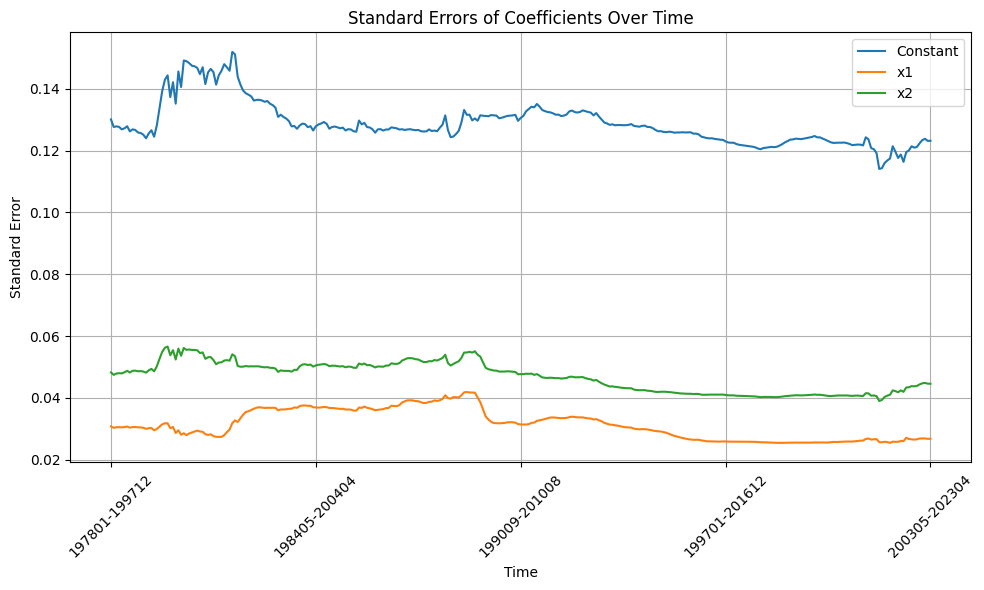

In [22]:
import matplotlib.ticker as ticker
import pandas as pd
import statsmodels.api as sm
import numpy as np
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Load the data
data = pd.read_csv('combined.csv')

# Convert date to datetime and set as index
data['date'] = pd.to_datetime(data['date'], format='%Y%m')
data.set_index('date', inplace=True)

# Window size
window_size = 240

# Number of models
num_models = len(data) - window_size + 1

# Create a list to store the models and results
models = []
results = []

# Also create lists to store the standard errors
std_errors = []

# Create the models
for i in range(num_models):
    # Define the dependent variable
    y = data['y'].iloc[i : i + window_size]

    # Define the independent variables
    X = data[['x1', 'x2']].iloc[i : i + window_size]

    # Add a constant to the independent variables matrix
    X = sm.add_constant(X)

    # Create an OLS model
    model = sm.OLS(y, X)

    # Fit the model
    result = model.fit()

    # Store the model, the results, and the standard errors
    models.append(model)
    results.append(result)
    std_errors.append(result.bse)

# Convert the list of standard errors to a 2D numpy array
std_errors = np.array(std_errors)

# Create a plot for the standard errors
plt.figure(figsize=(10, 6))
plt.plot(std_errors[:, 0], label='Constant')
plt.plot(std_errors[:, 1], label='x1')
plt.plot(std_errors[:, 2], label='x2')
plt.legend()
plt.grid(True) # Add grid
plt.xlabel('Time')
plt.ylabel('Standard Error')
plt.title('Standard Errors of Coefficients Over Time')

# Define the tick locations
tick_locations = np.linspace(0, num_models-1, 5).astype(int)

# Create list of labels
labels = [f'{data.index[i].strftime("%Y%m")}-{data.index[i+window_size-1].strftime("%Y%m")}' for i in tick_locations]

plt.xticks(tick_locations, labels, rotation=45) # Adjust x-axis

plt.tight_layout()
plt.show()


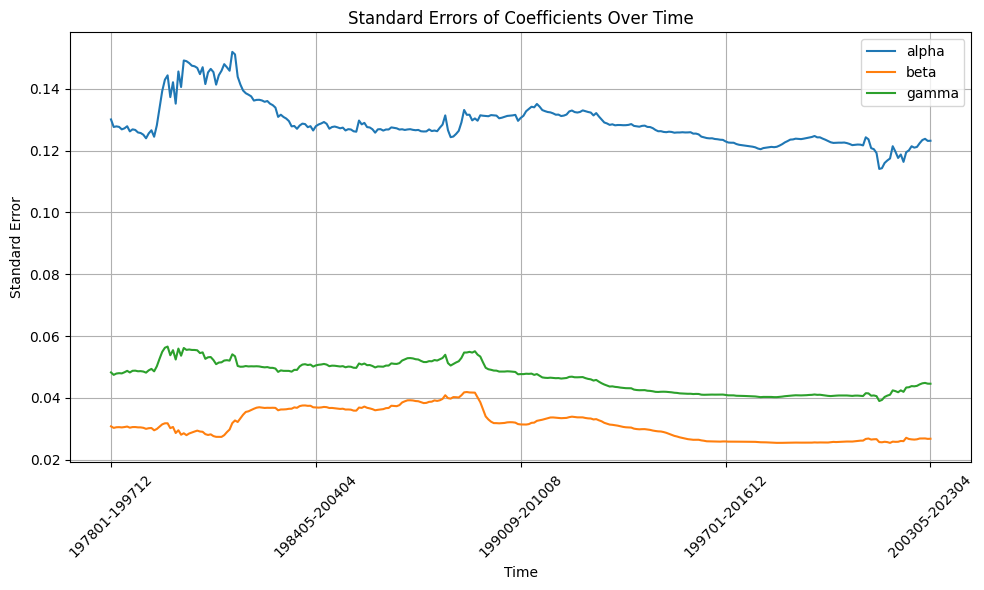

In [2]:
import matplotlib.ticker as ticker
import pandas as pd
import statsmodels.api as sm
import numpy as np
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Load the data
data = pd.read_csv('combined.csv')

# Convert date to datetime and set as index
data['date'] = pd.to_datetime(data['date'], format='%Y%m')
data.set_index('date', inplace=True)

# Window size
window_size = 240

# Number of models
num_models = len(data) - window_size + 1

# Create a list to store the models and results
models = []
results = []

# Also create lists to store the standard errors
std_errors = []

# Create the models
for i in range(num_models):
    # Define the dependent variable
    y = data['y'].iloc[i : i + window_size]

    # Define the independent variables
    X = data[['x1', 'x2']].iloc[i : i + window_size]

    # Add a constant to the independent variables matrix
    X = sm.add_constant(X)

    # Create an OLS model
    model = sm.OLS(y, X)

    # Fit the model
    result = model.fit()

    # Store the model, the results, and the standard errors
    models.append(model)
    results.append(result)
    std_errors.append(result.bse)

# Convert the list of standard errors to a 2D numpy array
std_errors = np.array(std_errors)

# Create a plot for the standard errors
plt.figure(figsize=(10, 6))
plt.plot(std_errors[:, 0], label='alpha')
plt.plot(std_errors[:, 1], label='beta')
plt.plot(std_errors[:, 2], label='gamma')
plt.legend()
plt.grid(True) # Add grid
plt.xlabel('Time')
plt.ylabel('Standard Error')
plt.title('Standard Errors of Coefficients Over Time')

# Define the tick locations
tick_locations = np.linspace(0, num_models-1, 5).astype(int)

# Create list of labels
labels = [f'{data.index[i].strftime("%Y%m")}-{data.index[i+window_size-1].strftime("%Y%m")}' for i in tick_locations]

plt.xticks(tick_locations, labels, rotation=45) # Adjust x-axis

plt.tight_layout()
plt.show()


In [19]:
import pandas as pd
import statsmodels.api as sm
import numpy as np
from sklearn.metrics import mean_squared_error

data = pd.read_csv('combined.csv')

# Convert date to datetime and set as index
data['date'] = pd.to_datetime(data['date'], format='%Y%m')
data.set_index('date', inplace=True)

# Window size
window_size = 240

# Number of models
num_models = len(data) - window_size + 1

# Create lists to store results
result_dict = {
    'start_end_date': [],
    'const_coef': [],
    'x1_coef': [],
    'x2_coef': [],
    'R2': [],
    'adj_R2': [],
    'RMSE': []
}

# Run models
for i in range(num_models):
    # Define the dependent variable
    y = data['y'].iloc[i : i + window_size]

    # Define the independent variables
    X = data[['x1', 'x2']].iloc[i : i + window_size]

    # Add a constant to the independent variables matrix for the intercept term
    X = sm.add_constant(X)

    # Create an OLS model and fit it
    result = sm.OLS(y, X).fit()

    # Calculate RMSE
    predictions = result.predict(X)
    rmse = np.sqrt(mean_squared_error(y, predictions))

    # Update result_dict
    result_dict['start_end_date'].append(f'{data.index[i].strftime("%Y%m")}-{data.index[i+window_size-1].strftime("%Y%m")}')
    result_dict['const_coef'].append(result.params[0])
    result_dict['x1_coef'].append(result.params[1])
    result_dict['x2_coef'].append(result.params[2])
    result_dict['R2'].append(result.rsquared)
    result_dict['adj_R2'].append(result.rsquared_adj)
    result_dict['RMSE'].append(rmse)

# Convert result_dict to DataFrame and save as .csv file
result_df = pd.DataFrame(result_dict)
result_df.to_csv('model_results.csv', index=False)


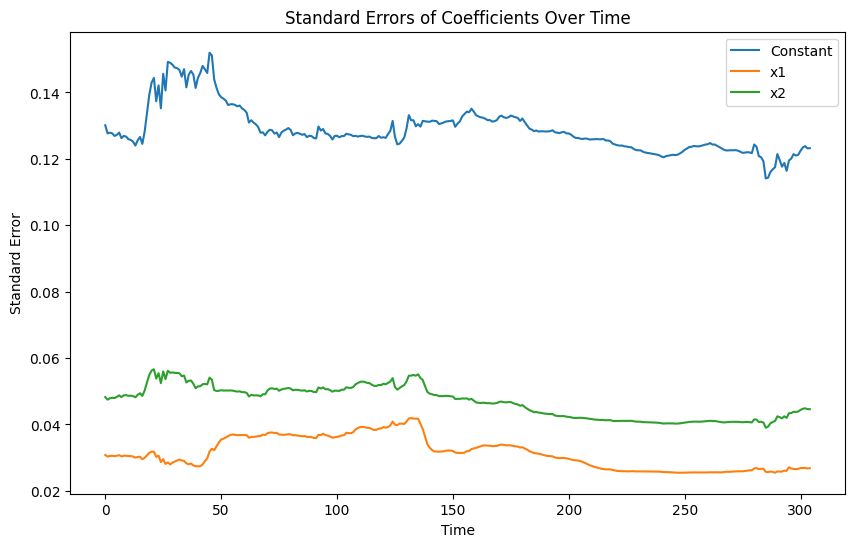

In [21]:
import matplotlib.ticker as ticker
import pandas as pd
import statsmodels.api as sm
import numpy as np
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

# Load the data
data = pd.read_csv('combined.csv')

# Convert date to datetime and set as index
data['date'] = pd.to_datetime(data['date'], format='%Y%m')
data.set_index('date', inplace=True)

# Window size
window_size = 240

# Number of models
num_models = len(data) - window_size + 1

# Create a list to store the models and results
models = []
results = []

# Also create lists to store the standard errors and other statistics
std_errors = []

# Create the models
for i in range(num_models):
    # Define the dependent variable
    y = data['y'].iloc[i : i + window_size]

    # Define the independent variables
    X = data[['x1', 'x2']].iloc[i : i + window_size]

    # Add a constant to the independent variables matrix
    X = sm.add_constant(X)

    # Create an OLS model
    model = sm.OLS(y, X)

    # Fit the model
    result = model.fit()

    # Store the model, the results, and the standard errors
    models.append(model)
    results.append(result)
    std_errors.append(result.bse)

# Convert the list of standard errors to a 2D numpy array
std_errors = np.array(std_errors)

# Create a plot for the standard errors
plt.figure(figsize=(10, 6))
plt.plot(std_errors[:, 0], label='Constant')
plt.plot(std_errors[:, 1], label='x1')
plt.plot(std_errors[:, 2], label='x2')
plt.legend()
plt.xlabel('Time')
plt.ylabel('Standard Error')
plt.title('Standard Errors of Coefficients Over Time')
plt.show()


In [3]:
import pandas as pd
import statsmodels.api as sm
import numpy as np

# Load the data
data = pd.read_csv('combined.csv')

# Convert date to datetime and set as index
data['date'] = pd.to_datetime(data['date'], format='%Y%m')
data.set_index('date', inplace=True)

# Window size
window_size = 240

# Number of models
num_models = len(data) - window_size + 1

# Create lists to store results
result_dict = {
    'start_end_date': [],
    'const_std_error': [],
    'const_peak_minima': [],
    'const_peak_maxima': [],
    'x1_std_error': [],
    'x1_peak_minima': [],
    'x1_peak_maxima': [],
    'x2_std_error': [],
    'x2_peak_minima': [],
    'x2_peak_maxima': []
}

# Run models
for i in range(num_models):
    # Define the dependent variable
    y = data['y'].iloc[i : i + window_size]

    # Define the independent variables
    X = data[['x1', 'x2']].iloc[i : i + window_size]

    # Add a constant to the independent variables matrix for the intercept term
    X = sm.add_constant(X)

    # Create an OLS model and fit it
    result = sm.OLS(y, X).fit()

    # Update result_dict
    result_dict['start_end_date'].append(f'{data.index[i].strftime("%Y%m")}-{data.index[i+window_size-1].strftime("%Y%m")}')
    result_dict['const_std_error'].append(round(result.bse[0], 2))
    result_dict['const_peak_minima'].append(round(result.params[0] - 1.96 * result.bse[0], 2))
    result_dict['const_peak_maxima'].append(round(result.params[0] + 1.96 * result.bse[0], 2))
    result_dict['x1_std_error'].append(round(result.bse[1], 2))
    result_dict['x1_peak_minima'].append(round(result.params[1] - 1.96 * result.bse[1], 2))
    result_dict['x1_peak_maxima'].append(round(result.params[1] + 1.96 * result.bse[1], 2))
    result_dict['x2_std_error'].append(round(result.bse[2], 2))
    result_dict['x2_peak_minima'].append(round(result.params[2] - 1.96 * result.bse[2], 2))
    result_dict['x2_peak_maxima'].append(round(result.params[2] + 1.96 * result.bse[2], 2))

# Convert result_dict to DataFrame and save as .csv file
result_df = pd.DataFrame(result_dict)
result_df.to_csv('coefficients_std_errors_peak.csv', index=False)


In [4]:
import pandas as pd
import statsmodels.api as sm
import numpy as np

# Load the data
data = pd.read_csv('combined.csv')

# Convert date to datetime and set as index
data['date'] = pd.to_datetime(data['date'], format='%Y%m')
data.set_index('date', inplace=True)

# Window size
window_size = 240

# Number of models
num_models = len(data) - window_size + 1

# Create lists to store results
result_dict = {
    'start_end_date': [],
    'const_std_error': [],
    'x1_std_error': [],
    'x2_std_error': [],
    'const_peak': [],
    'x1_peak': [],
    'x2_peak': []
}

# Run models
for i in range(num_models):
    # Define the dependent variable
    y = data['y'].iloc[i : i + window_size]

    # Define the independent variables
    X = data[['x1', 'x2']].iloc[i : i + window_size]

    # Add a constant to the independent variables matrix for the intercept term
    X = sm.add_constant(X)

    # Create an OLS model and fit it
    result = sm.OLS(y, X).fit()

    # Update result_dict
    result_dict['start_end_date'].append(f'{data.index[i].strftime("%Y%m")}-{data.index[i+window_size-1].strftime("%Y%m")}')
    result_dict['const_std_error'].append(round(result.bse[0], 2))
    result_dict['x1_std_error'].append(round(result.bse[1], 2))
    result_dict['x2_std_error'].append(round(result.bse[2], 2))
    result_dict['const_peak'].append(max(result.bse[0], default=0))
    result_dict['x1_peak'].append(max(result.bse[1], default=0))
    result_dict['x2_peak'].append(max(result.bse[2], default=0))

# Convert result_dict to DataFrame and save as .csv file
result_df = pd.DataFrame(result_dict)
result_df.to_csv('std_error_peaks.csv', index=False)


TypeError: 'numpy.float64' object is not iterable

In [5]:
import pandas as pd
import statsmodels.api as sm
import numpy as np

# Load the data
data = pd.read_csv('combined.csv')

# Convert date to datetime and set as index
data['date'] = pd.to_datetime(data['date'], format='%Y%m')
data.set_index('date', inplace=True)

# Window size
window_size = 240

# Number of models
num_models = len(data) - window_size + 1

# Create lists to store results
result_dict = {
    'start_end_date': [],
    'const_std_error': [],
    'x1_std_error': [],
    'x2_std_error': [],
    'const_peak': [],
    'x1_peak': [],
    'x2_peak': []
}

# Run models
for i in range(num_models):
    # Define the dependent variable
    y = data['y'].iloc[i : i + window_size]

    # Define the independent variables
    X = data[['x1', 'x2']].iloc[i : i + window_size]

    # Add a constant to the independent variables matrix for the intercept term
    X = sm.add_constant(X)

    # Create an OLS model and fit it
    result = sm.OLS(y, X).fit()

    # Update result_dict
    result_dict['start_end_date'].append(f'{data.index[i].strftime("%Y%m")}-{data.index[i+window_size-1].strftime("%Y%m")}')
    result_dict['const_std_error'].append(round(result.bse[0], 2))
    result_dict['x1_std_error'].append(round(result.bse[1], 2))
    result_dict['x2_std_error'].append(round(result.bse[2], 2))
    result_dict['const_peak'].append(result.bse[0].max() if isinstance(result.bse[0], np.ndarray) else 0)
    result_dict['x1_peak'].append(result.bse[1].max() if isinstance(result.bse[1], np.ndarray) else 0)
    result_dict['x2_peak'].append(result.bse[2].max() if isinstance(result.bse[2], np.ndarray) else 0)

# Convert result_dict to DataFrame and save as .csv file
result_df = pd.DataFrame(result_dict)
result_df.to_csv('std_error_peaks.csv', index=False)


In [2]:
import pandas as pd
import statsmodels.api as sm
import numpy as np

# Load the data
data = pd.read_csv('combined.csv')

# Convert date to datetime and set as index
data['date'] = pd.to_datetime(data['date'], format='%Y%m')
data.set_index('date', inplace=True)

# Window size
window_size = 240

# Number of models
num_models = len(data) - window_size + 1

# Create lists to store results
result_dict = {
    'start_end_date': [],
    'const_std_error': [],
    'x1_std_error': [],
    'x2_std_error': []
}

# Run models
for i in range(num_models):
    # Define the dependent variable
    y = data['y'].iloc[i : i + window_size]

    # Define the independent variables
    X = data[['x1', 'x2']].iloc[i : i + window_size]

    # Add a constant to the independent variables matrix for the intercept term
    X = sm.add_constant(X)

    # Create an OLS model and fit it
    result = sm.OLS(y, X).fit()

    # Update result_dict
    result_dict['start_end_date'].append(f'{data.index[i].strftime("%Y%m")}-{data.index[i+window_size-1].strftime("%Y%m")}')
    result_dict['const_std_error'].append(round(result.bse[0], 3))
    result_dict['x1_std_error'].append(round(result.bse[1], 3))
    result_dict['x2_std_error'].append(round(result.bse[2], 3))

# Convert result_dict to DataFrame and save as .csv file
result_df = pd.DataFrame(result_dict)
result_df.to_csv('coefficients_std_errors2.csv', index=False)


In [20]:
import pandas as pd
import statsmodels.api as sm
import numpy as np
from sklearn.metrics import mean_squared_error

data = pd.read_csv('combined.csv')

# Convert date to datetime and set as index
data['date'] = pd.to_datetime(data['date'], format='%Y%m')
data.set_index('date', inplace=True)

# Window size
window_size = 240

# Number of models
num_models = len(data) - window_size + 1

# Create lists to store results
result_dict = {
    'start_end_date': [],
    'const_coef': [],
    'x1_coef': [],
    'x2_coef': [],
    'R2': [],
    'adj_R2': [],
    'RMSE': []
}

# Run models
for i in range(num_models):
    # Define the dependent variable
    y = data['y'].iloc[i : i + window_size]

    # Define the independent variables
    X = data[['x1', 'x2']].iloc[i : i + window_size]

    # Add a constant to the independent variables matrix for the intercept term
    X = sm.add_constant(X)

    # Create an OLS model and fit it
    result = sm.OLS(y, X).fit()

    # Calculate RMSE
    predictions = result.predict(X)
    rmse = np.sqrt(mean_squared_error(y, predictions))

    # Update result_dict
    result_dict['start_end_date'].append(f'{data.index[i].strftime("%Y%m")}-{data.index[i+window_size-1].strftime("%Y%m")}')
    result_dict['const_coef'].append(round(result.params[0], 2))
    result_dict['x1_coef'].append(round(result.params[1], 2))
    result_dict['x2_coef'].append(round(result.params[2], 2))
    result_dict['R2'].append(round(result.rsquared, 2))
    result_dict['adj_R2'].append(round(result.rsquared_adj, 2))
    result_dict['RMSE'].append(round(rmse, 2))

# Convert result_dict to DataFrame and save as .csv file
result_df = pd.DataFrame(result_dict)
result_df.to_csv('model_results.csv', index=False)


In [14]:
import matplotlib.ticker as ticker

# Create list of labels
labels = [f'{data.index[i].strftime("%Y%m")}-{data.index[i+window_size-1].strftime("%Y%m")}' for i in range(num_models)]


# Adjust x-axis
for ax in axs:
    ax.xaxis.set_major_locator(ticker.MultipleLocator(num_models//10)) # Set locator according to your need
    ax.set_xticklabels(labels[::num_models//10], rotation=45)  # Set tick labels

plt.tight_layout()
plt.show()


C:\Users\Dell\AppData\Local\Temp\ipykernel_5000\1346828026.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(labels[::num_models//10], rotation=45)  # Set tick labels


<Figure size 640x480 with 0 Axes>

In [33]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.regression.linear_model import RegressionResults

# Load the data
data = pd.read_csv('combined.csv')

# Window size
window_size = 240

# Number of models
num_models = len(data) - window_size + 1

# Create a list to store the models
models = []

# Create a list to store the results
results = []

for i in range(num_models):
    # Define the dependent variable
    y = data['y'].iloc[i : i + window_size]

    # Define the independent variables
    X = data[['x1', 'x2']].iloc[i : i + window_size]

    # Add a constant to the independent variables matrix for the intercept term
    X = sm.add_constant(X)

    # Create an OLS model
    model = sm.OLS(y, X)

    # Fit the model
    result = model.fit()

    # Print the R-squared value
    print(f'R-squared value for model {i+1}: {result.rsquared}')


R-squared value for model 1: 0.9052297224863042
R-squared value for model 2: 0.9082113758424232
R-squared value for model 3: 0.9084796001913323
R-squared value for model 4: 0.9087265331473192
R-squared value for model 5: 0.9093268364941465
R-squared value for model 6: 0.9091050509117343
R-squared value for model 7: 0.908992568711403
R-squared value for model 8: 0.9104433008377372
R-squared value for model 9: 0.9106291402031227
R-squared value for model 10: 0.9105559036499971
R-squared value for model 11: 0.9107364444908207
R-squared value for model 12: 0.9102564166754827
R-squared value for model 13: 0.9100546178245305
R-squared value for model 14: 0.9103663356187962
R-squared value for model 15: 0.9084859844473703
R-squared value for model 16: 0.90653417064683
R-squared value for model 17: 0.9074301787042145
R-squared value for model 18: 0.9040855007834225
R-squared value for model 19: 0.8999876712940164
R-squared value for model 20: 0.8956152385045053
R-squared value for model 21: 0.